In [89]:
import numpy as np
import pandas as pd
import os
import matplotlib.cm as cm
from matplotlib import pyplot as plt
from scipy import stats as st
import seaborn as sns

from IPython.core.pylabtools import figsize

import numpy.random as r
from pylab import *
from matplotlib.gridspec import GridSpec

import sys
sys.path.insert(0, '../../utils')
import splicing_utils as spu
import single_cell_plots as scp
from single_cell_plots import *

plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 1
plt.rcParams["axes.facecolor"] = 'white'

import matplotlib as mpl
import numpy as np
from matplotlib import pyplot as plt
from scipy.stats import norm
mpl.rcParams["mathtext.fontset"] = "stix"
from scipy.stats import combine_pvalues

from sklearn.decomposition import PCA
from scipy.stats import spearmanr
import rpy2
import rpy2.robjects.packages as rpackages
import rpy2.robjects as robjects
import rpy2.robjects.numpy2ri as rpyn
from statsmodels.stats.multitest import multipletests
dt = rpy2.robjects.packages.importr('diptest')

from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering

from scipy.special import logit
from scipy.special import expit

from sklearn.metrics import adjusted_rand_score

from scipy.stats import chisquare

from scipy.stats import hypergeom

import warnings
warnings.filterwarnings("ignore")

In [99]:
import importlib
importlib.reload(scp)
importlib.reload(spu)
sns.reset_orig()
mpl.rcParams["mathtext.fontset"] = "stix"
mpl.rcParams['pdf.fonttype'] = 42

# mRNA and quality of observations

This section explores each dataset's mRNA capture efficiency and splice junction read coverage.

This code generates figures 3a-g. It will require to process first the data, including the estimation of $\Psi$ observations and running the modified version of the Census normalization to estimate the number of captured mRNA molecules per cell.

In [4]:
data_dir = '/mnt/c/Users/ferna/Desktop/SingleCell/data/'
%run -i '../../utils/load_data.py'

### Figure 3a: captured mRNA estimation

Here we show the distribution of estimated mRNA molecules captured per cell in each dataset. The estimated number of captured mRNAs was determined using a variation of the Census normalization (Qiu et al., 2017).

/home/cfbuenabadn/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:61: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  return bound(*args, **kwds)


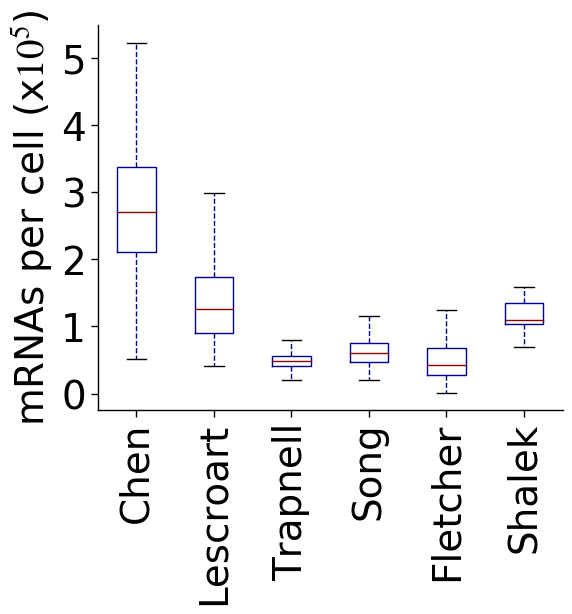

In [4]:
cuentas_chen = chen_mrna_counts.sum(axis=0)
cuentas_song = song_mrna_counts.sum(axis=0)
cuentas_trapnell = trapnell_mrna_counts.sum(axis=0)
cuentas_lescroart = lescroart_mrna_counts.sum(axis=0)
cuentas_das = das_mrna_counts.sum(axis=0)
cuentas_shalek = shalek_mrna_counts.sum(axis=0)

cuentas_df = [cuentas_chen, cuentas_lescroart, cuentas_trapnell, cuentas_song, cuentas_das, cuentas_shalek]
dset_names = ['Chen', 'Lescroart', 'Trapnell', 'Song', 'Fletcher', 'Shalek']


scp.plot_boxplot(cuentas_df, 'mRNAs per cell (x$10^5$)', dset_names, 'mrna_cells_boxplot', xlocs = np.array([1, 2, 3, 4, 5, 6]),
                 ylocs=[0, 100000, 200000, 300000, 400000, 500000], 
                 ytags=['0', '1', '2', '3', '4', '5', '6'], save_dir='plots_review/figure3/')

plt.show()

### Supplementary Figure 3c 

Total number of uniquely mapped reads (by RSEM) per cell.

/home/cfbuenabadn/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:61: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  return bound(*args, **kwds)


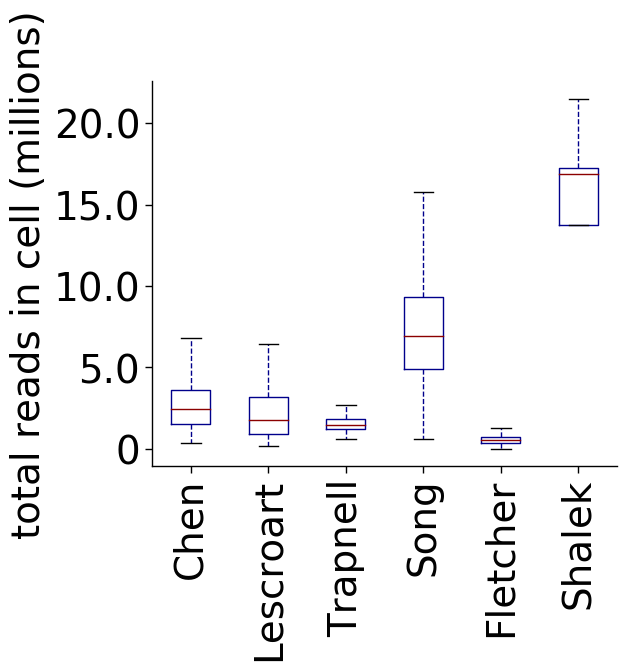

In [5]:
chen_star_tab = pd.read_csv(data_dir + 'chen/chen.rsemCounts.gene_symbols.tab', 
                            sep='\t', index_col=0)[chen_PSI.columns]
lescroart_star_tab = pd.read_csv(data_dir + 'lescroart/lescroart.rsemCounts.gene_symbols.tab', 
                                 sep='\t', index_col=0)[lescroart_PSI.columns]
trapnell_star_tab = pd.read_csv(data_dir + 'trapnell/trapnell.rsemCounts.gene_symbols.tab', 
                                sep='\t', index_col=0)[trapnell_PSI.columns]
song_star_tab = pd.read_csv(data_dir + 'song/song.rsemCounts.gene_symbols.tab', 
                            sep='\t', index_col=0)[song_PSI.columns]
das_star_tab = pd.read_csv(data_dir + 'das/das.rsemCounts.gene_symbols.tab', 
                           sep='\t', index_col=0)[das_PSI.columns]
shalek_star_tab = pd.read_csv(data_dir + 'shalek/shalek.rsemCounts.gene_symbols.tab', 
                              sep='\t', index_col=0)[shalek_PSI.columns]


read_counts_chen = chen_star_tab.sum(axis=0)
read_counts_song = song_star_tab.sum(axis=0)
read_counts_trapnell = trapnell_star_tab.sum(axis=0)
read_counts_lescroart = lescroart_star_tab.sum(axis=0)
read_counts_das = das_star_tab.sum(axis=0)
read_counts_shalek = shalek_star_tab.sum(axis=0)

reads_df = [read_counts_chen, read_counts_lescroart, read_counts_trapnell, 
                      read_counts_song, read_counts_das, read_counts_shalek]


scp.plot_boxplot(reads_df, 'total reads in cell (millions)', dset_names, 'total_reads_boxplot', 
                 ylocs =[0, 5000000, 10000000,15000000, 20000000], xlocs = np.array([1, 2, 3, 4, 5, 6]),
                 ytags = ['0', '5.0', '10.0', '15.0', '20.0'], save_dir='plots_review/figure3/')


plt.show()

### Figure 3b and Supplementary Figures 3d

For each exon, we compare the average number of mRNA molecules captured for its gene, versus the number of informative splice junction reads (included and excluded). We also observe the relationship of these variables with the percentage of cells that present binary values ($\Psi =0$ or $\Psi=1$) for each exon.

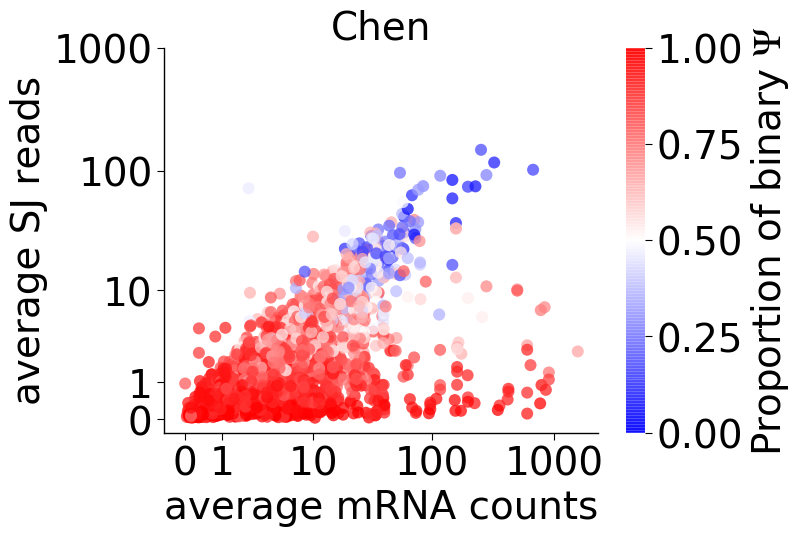

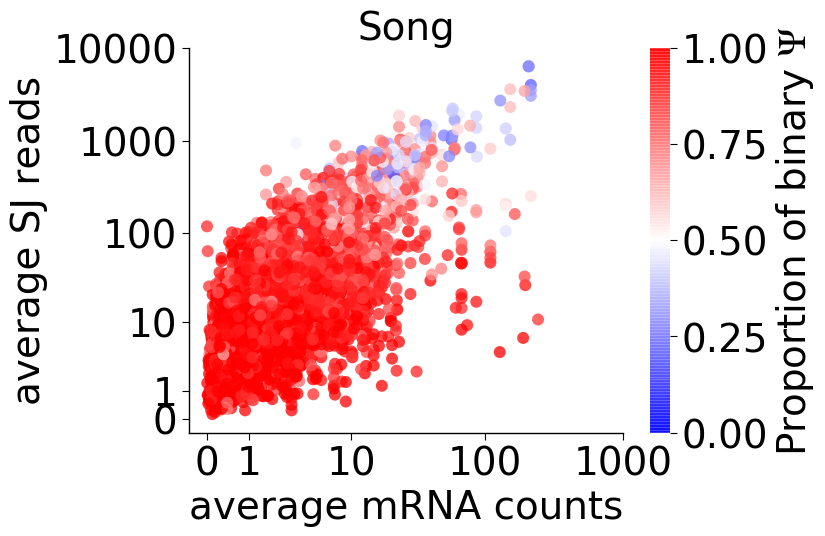

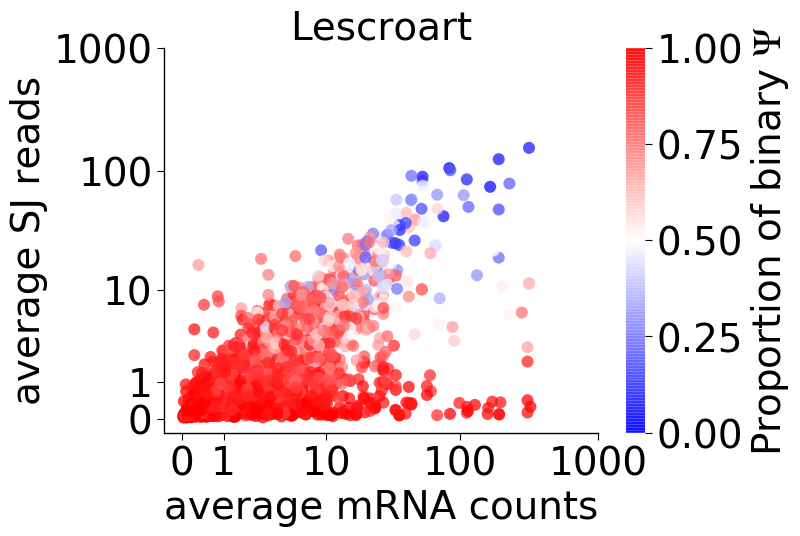

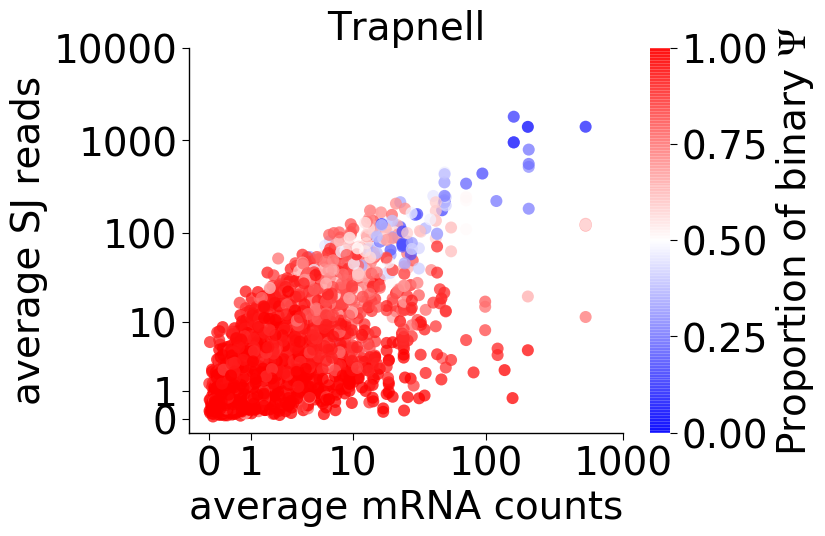

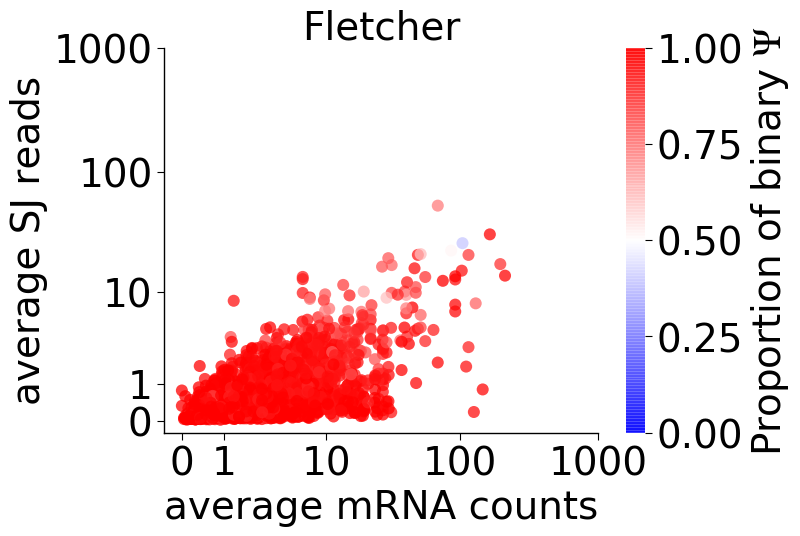

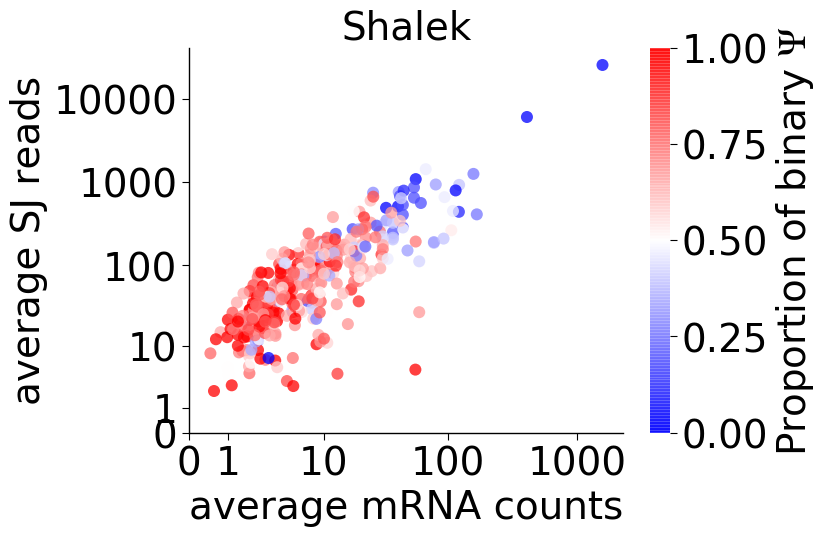

In [6]:
chen_int_genes, chen_int_exons = spu.get_int_events(chen_PSI, chen_mrna_counts, 0.05)
chen_int_exons = [x for x in chen_int_exons if x in mrna_per_event_chen.index]

song_int_genes, song_int_exons = spu.get_int_events(song_PSI, song_mrna_counts, 0.05)
song_int_exons = [x for x in song_int_exons if x in mrna_per_event_song.index]

trapnell_int_genes, trapnell_int_exons = spu.get_int_events(trapnell_PSI, trapnell_mrna_counts, 0.05)
trapnell_int_exons = [x for x in trapnell_int_exons if x in mrna_per_event_trapnell.index]

lescroart_int_genes, lescroart_int_exons = spu.get_int_events(lescroart_PSI, lescroart_mrna_counts, 0.05)
lescroart_int_exons = [x for x in lescroart_int_exons if x in mrna_per_event_lescroart.index]

das_int_genes, das_int_exons = spu.get_int_events(das_PSI, das_mrna_counts, 0.05)
das_int_exons = [x for x in das_int_exons if x in mrna_per_event_das.index]

shalek_int_genes, shalek_int_exons = spu.get_int_events(shalek_PSI, shalek_mrna_counts, 0.05)
shalek_int_exons = [x for x in shalek_int_exons if x in mrna_per_event_shalek.index]

reads_song, mrna_song, binary_song, psi_song = spu.get_dataset_averages(song_PSI, song_read_counts, 
                                                                        song_mrna_counts, song_int_exons)
reads_das, mrna_das, binary_das, psi_das = spu.get_dataset_averages(das_PSI, das_read_counts, 
                                                                     das_mrna_counts, das_int_exons)
reads_chen, mrna_chen, binary_chen, psi_chen = spu.get_dataset_averages(chen_PSI, chen_read_counts, 
                                                                        chen_mrna_counts, chen_int_exons)
reads_lescroart, mrna_lescroart, binary_lescroart, psi_lescroart = spu.get_dataset_averages(lescroart_PSI, 
                                                                                            lescroart_read_counts, 
                                                                                            lescroart_mrna_counts, 
                                                                                             lescroart_int_exons)
reads_trapnell, mrna_trapnell, binary_trapnell, psi_trapnell = spu.get_dataset_averages(trapnell_PSI, trapnell_read_counts, 
                                                                          trapnell_mrna_counts, trapnell_int_exons)
reads_shalek, mrna_shalek, binary_shalek, psi_shalek = spu.get_dataset_averages(shalek_PSI, shalek_read_counts, 
                                                                          shalek_mrna_counts, shalek_int_exons)

scp.plot_information_map2(mrna_chen, reads_chen, binary_chen, 'Chen', 
                         [0, np.log10(2), np.log10(11), np.log10(101), np.log10(1001)],
                         ['0', '1', '10', '100', '1000'],
                           [0, np.log10(2), np.log10(11), np.log10(101), np.log10(1001)],
                         ['0', '1', '10', '100', '1000'],
                         stat = 'median', 
                         mrna_min = 10, read_min = (10*chen_coverage_tab['SJ_coverage']).mean(), 
                          save_name = 'chen_binary_median',
                         plot_dir = 'plots_review/figure3/')


scp.plot_information_map2(mrna_song, reads_song, binary_song, 'Song',
                          [0, np.log10(2), np.log10(11), np.log10(101), np.log10(1001)],
                         ['0', '1', '10', '100', '1000'],
                           [0, np.log10(2), np.log10(11), np.log10(101), np.log10(1001), np.log10(10001)],
                         ['0', '1', '10', '100', '1000', '10000'],
                         stat = 'median', max_x = 3, max_y = 4,
                         save_name = 'song_binary_median', mrna_min = 10, 
                         read_min=(10*song_coverage_tab['SJ_coverage']).mean(),
                         plot_dir = 'plots_review/figure3/')

scp.plot_information_map2(mrna_lescroart, reads_lescroart, binary_lescroart, 'Lescroart', 
                          [0, np.log10(2), np.log10(11), np.log10(101), np.log10(1001)],
                         ['0', '1', '10', '100', '1000'],
                           [0, np.log10(2), np.log10(11), np.log10(101), np.log10(1001)],
                         ['0', '1', '10', '100', '1000'],
                         stat = 'median', save_name = 'lescroart_binary_median', mrna_min = 10, 
                         read_min=(10*lescroart_coverage_tab['SJ_coverage']).mean(), 
                          plot_dir = 'plots_review/figure3/')

scp.plot_information_map2(mrna_trapnell, reads_trapnell, binary_trapnell,
                     'Trapnell',  [0, np.log10(2), np.log10(11), np.log10(101), np.log10(1001)],
                         ['0', '1', '10', '100', '1000'],
                           [0, np.log10(2), np.log10(11), np.log10(101), np.log10(1001), np.log10(10001)],
                         ['0', '1', '10', '100', '1000', '10000'],
                         stat = 'median', save_name = 'trapnell_binary_median', 
                          max_x = 3, max_y = 4, mrna_min = 10, read_min=(10*trapnell_coverage_tab['SJ_coverage']).mean(),
                         plot_dir = 'plots_review/figure3/')

scp.plot_information_map2(mrna_das, reads_das, binary_das,
                     'Fletcher', [0, np.log10(2), np.log10(11), np.log10(101), np.log10(1001)],
                         ['0', '1', '10', '100', '1000'],
                           [0, np.log10(2), np.log10(11), np.log10(101), np.log10(1001)],
                         ['0', '1', '10', '100', '1000'],
                         stat = 'median', save_name = 'fletcher_binary_median', mrna_min = 10, 
                          read_min=(10*das_coverage_tab['SJ_coverage']).mean(),
                         plot_dir = 'plots_review/figure3/')

scp.plot_information_map2(mrna_shalek, reads_shalek, binary_shalek,
                     'Shalek', [0, np.log10(2), np.log10(11), np.log10(101), np.log10(1001)],
                         ['0', '1', '10', '100', '1000'],
                           [0, np.log10(2), np.log10(11), np.log10(101), np.log10(1001), np.log10(10001)],
                         ['0', '1', '10', '100', '1000', '10000'],
                         stat = 'median', save_name = 'shalek_binary_median', mrna_min = 10, 
                          read_min=(10*shalek_coverage_tab['SJ_coverage']).mean(),
                         plot_dir = 'plots_review/figure3/')

plt.show()

### Figure 3c: RNA-seq reads per splice junction

Estimation of the read coverage of each splice junction. This ratio was estimated as follows:

$$ C_j = \frac{\text{total splice junction reads in cell }j}{\text{total splice junctions in mRNAs of cell }j} = \frac{\sum_k r_{jk}}{\sum_k s_k m_{jk}}$$

Where $r_{jk}$ is the number of reads spanning constitutive splice junctions of gene $k$ in cell $j$, $s_k$ is the number of constitutive splice junctions of gene $k$, and $m_{jk}$ is the number of mRNA molecules of gene $k$ in cell $j$.

The number of reads spanning constitutive junctions were obtained from the **SJ.out.tab** output from the STAR alignment of each single cell. Constutive junctions were determined as junctions that appear in all annotated transcripts of each protein coding gene in the Gencode annotation (versions hg38 for human, mm10 for mouse).

/home/cfbuenabadn/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:61: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  return bound(*args, **kwds)


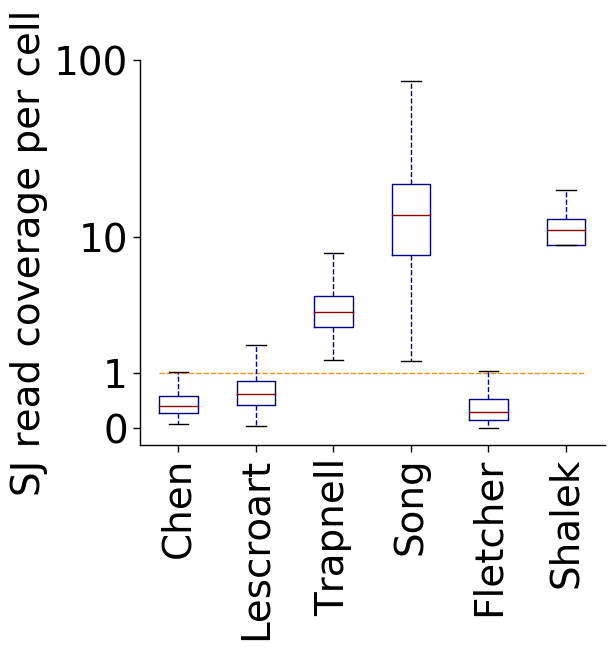

In [7]:
dset_names = ['Chen', 'Lescroart', 'Trapnell', 'Song', 'Fletcher', 'Shalek']

scp.plot_boxplot([np.log10(chen_coverage_tab['SJ_coverage']+1),np.log10(lescroart_coverage_tab['SJ_coverage']+1), 
                  np.log10(trapnell_coverage_tab['SJ_coverage']+1), np.log10(song_coverage_tab['SJ_coverage']+1), 
                  np.log10(das_coverage_tab['SJ_coverage']+1), np.log10(shalek_coverage_tab['SJ_coverage']+1)], 
                 'SJ read coverage per cell', dset_names, 
                 'reads_per_SJ_per_cell', ylocs = [0, np.log10(2), np.log10(11), np.log10(101)],
                 xlocs = np.array([1, 2, 3, 4, 5, 6]),
                 ytags = ['0', '1', '10', '100'], plot_line = np.log10(2), save_dir='plots_review/figure3/')

plt.show()

### Figure 3d: PCA projection of the Chen dataset

PCA projection of the Chen et al., 2016 neuron differentiation. PCA projection was based on gene expression normalized with SCONE (Cole et al., 2019). 

Cell clusters were defined through agglomerative clustering, and named based on the majority of labels of the cells based on the author's original annotation. We use five clusters to account for potential subpopulations in the neuron cells, as shown in the projection colored by the provided labels shown below.

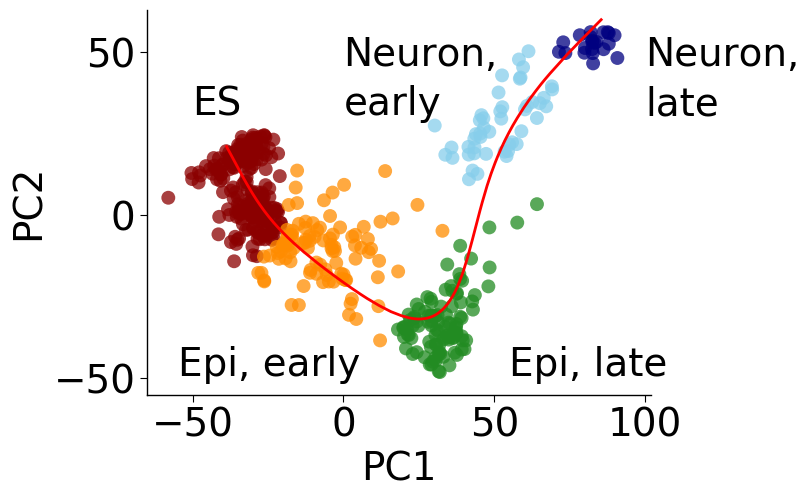

In [146]:
figsize(6.5,5)
fig = plt.figure()
ax  = plt.subplot(1,1,1)

ax.scatter(chen_pca_clust.PC1.loc[chen_pca_clust.AC==0], 
           chen_pca_clust.PC2.loc[chen_pca_clust.AC==0], 
           c='darkred', s=100, edgecolors='none', label='ES', alpha=0.75)

ax.scatter(chen_pca_clust.PC1.loc[chen_pca_clust.AC==1], 
           chen_pca_clust.PC2.loc[chen_pca_clust.AC==1], 
           c='darkorange', s=100, edgecolors='none', label='Epi, early', alpha=0.75)

ax.scatter(chen_pca_clust.PC1.loc[chen_pca_clust.AC==2], 
           chen_pca_clust.PC2.loc[chen_pca_clust.AC==2], 
           c='forestgreen', s=100, edgecolors='none', label='Epi, late', alpha=0.75)

ax.scatter(chen_pca_clust.PC1.loc[chen_pca_clust.AC==3], 
           chen_pca_clust.PC2.loc[chen_pca_clust.AC==3], 
           c='skyblue', s=100, edgecolors='none', label='MN, early', alpha=0.75)

ax.scatter(chen_pca_clust.PC1.loc[chen_pca_clust.AC==4], 
           chen_pca_clust.PC2.loc[chen_pca_clust.AC==4], 
           c='navy', s=100, edgecolors='none', label='MN, late', alpha=0.75)

ax.plot(chen_pca_clust.line_1, chen_pca_clust.line_2, c='red',linewidth=2, label='lineage')


ax.set_xlim([-65, 102])
ax.set_ylim([-55, 63])
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)


ax.tick_params(labelsize=28, length=5)

plt.ylabel('PC2', fontsize=28)
plt.xlabel('PC1', fontsize=28)


ax.text(-50, 40, 'ES', fontsize=28, verticalalignment='top')
ax.text(-55, -40, 'Epi, early', fontsize=28, verticalalignment='top')
ax.text(55, -40, 'Epi, late', fontsize=28, verticalalignment='top')
ax.text(0, 55, 'Neuron,', fontsize=28, verticalalignment='top')
ax.text(0, 40, 'early', fontsize=28, verticalalignment='top')
ax.text(100, 55, 'Neuron,', fontsize=28, verticalalignment='top')
ax.text(100, 40, 'late', fontsize=28, verticalalignment='top')


plt.savefig('plots_review/figure3/PCA_AC_chen.svg', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/PCA_AC_chen.pdf', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/PCA_AC_chen.png', bbox_inches='tight', transparent=True)

plt.show()

Same PCA projection, coloring of cells made by annotated cell type provided by the authors of the study.

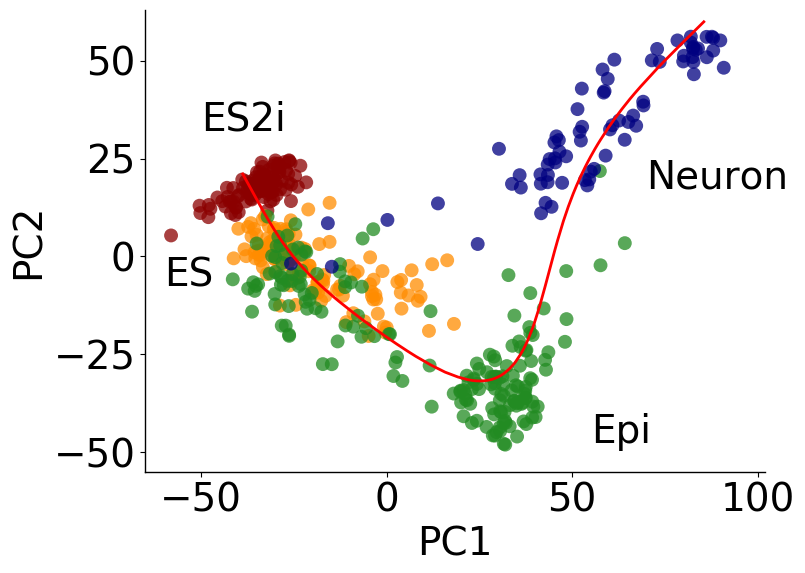

In [147]:
figsize(8,6)
fig = plt.figure()
ax  = plt.subplot(1,1,1)

ax.scatter(chen_pca_clust.PC1.loc[chen_pca_clust.cell_type=='ES2i'], 
           chen_pca_clust.PC2.loc[chen_pca_clust.cell_type=='ES2i'], 
           c='darkred', s=100, edgecolors='none', label='ES2i', alpha=0.75)

ax.scatter(chen_pca_clust.PC1.loc[chen_pca_clust.cell_type=='ES'], 
           chen_pca_clust.PC2.loc[chen_pca_clust.cell_type=='ES'], 
           c='darkorange', s=100, edgecolors='none', label='ES', alpha=0.75)

ax.scatter(chen_pca_clust.PC1.loc[chen_pca_clust.cell_type=='Epi'], 
           chen_pca_clust.PC2.loc[chen_pca_clust.cell_type=='Epi'], 
           c='forestgreen', s=100, edgecolors='none', label='Epi', alpha=0.75)

ax.scatter(chen_pca_clust.PC1.loc[chen_pca_clust.cell_type=='Motor neuron'], 
           chen_pca_clust.PC2.loc[chen_pca_clust.cell_type=='Motor neuron'], 
           c='navy', s=100, edgecolors='none', label='MN', alpha=0.75)

ax.plot(chen_pca_clust.line_1, chen_pca_clust.line_2, c='red',linewidth=2, label='lineage')


ax.set_xlim([-65, 102])
ax.set_ylim([-55, 63])
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)


ax.tick_params(labelsize=28)

plt.ylabel('PC2', fontsize=28)
plt.xlabel('PC1', fontsize=28)

ax.text(-50, 40, 'ES2i', fontsize=28, verticalalignment='top')
ax.text(-60, 0, 'ES', fontsize=28, verticalalignment='top')
ax.text(55, -40, 'Epi', fontsize=28, verticalalignment='top')
ax.text(70, 25, 'Neuron', fontsize=28, verticalalignment='top')

plt.savefig('plots_review/figure3/PCA_cell_type_chen.svg', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/PCA_cell_type_chen.pdf', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/PCA_cell_type_chen.png', bbox_inches='tight', transparent=True)

plt.show()

#### Nova1 expression shows that a subgroup of cells annotated as Neurons correspond to more mature stages

Text(70, 25, 'Neuron')

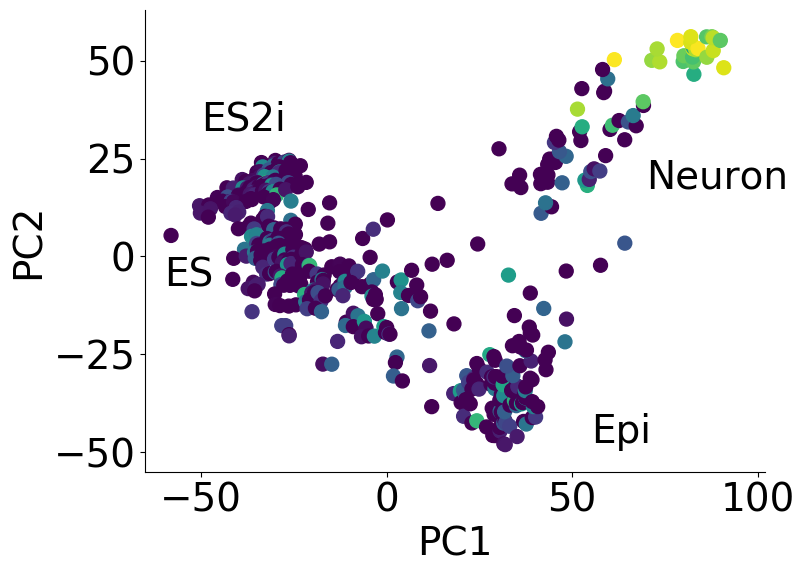

In [197]:
chen_norm_counts = pd.read_csv(data_dir + 'chen/chen.norm_counts_extended.tab', sep='\t', index_col = 0)

figsize(8,6)
fig = plt.figure()
ax  = plt.subplot(1,1,1)
ax.scatter(chen_pca_clust.PC1, chen_pca_clust.PC2,
    c=np.log10(chen_norm_counts.loc['Nova1', chen_pca_clust.index]+1), cmap=cm.viridis, vmin=0, s=100)

ax.set_xlim([-65, 102])
ax.set_ylim([-55, 63])
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)


ax.tick_params(labelsize=28)

plt.ylabel('PC2', fontsize=28)
plt.xlabel('PC1', fontsize=28)

ax.text(-50, 40, 'ES2i', fontsize=28, verticalalignment='top')
ax.text(-60, 0, 'ES', fontsize=28, verticalalignment='top')
ax.text(55, -40, 'Epi', fontsize=28, verticalalignment='top')
ax.text(70, 25, 'Neuron', fontsize=28, verticalalignment='top')

### Figure 3e: $\hat{\Psi}$ of Cadm1, unfiltered

We are using the alternative 8th exon of Cadm1 as an example.

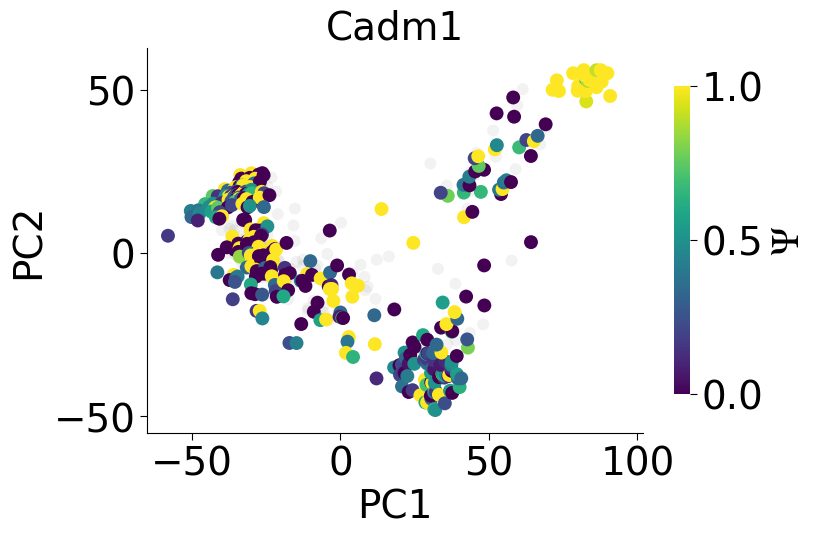

In [100]:
scp.plot_pca(chen_pca, chen_PSI, mrna_per_event_chen, chen_read_counts, chen_coverage_tab['SJ_coverage'], 
             'Cadm1_2', 10, filter_cells=False, plot_dir = 'plots_review/figure3/events/')

### Figure 3f : $\hat{\Psi}$ of Cadm1, filtered

For each exon $k$, we only consider an observation in a given cell $j$ if:
* There are at least 10 mRNA molecules of the gene that contains the exon in the cell.
* There are at least $10 \cdot C_j (1-\Psi_{kj})$ informative junction reads of the exon in the cell.

Where $C_j$ is the splice junction read coverage in cell $j$, and $\Psi_{kj}$ is the observed $\Psi$ for exon $k$ in cell $j$. 

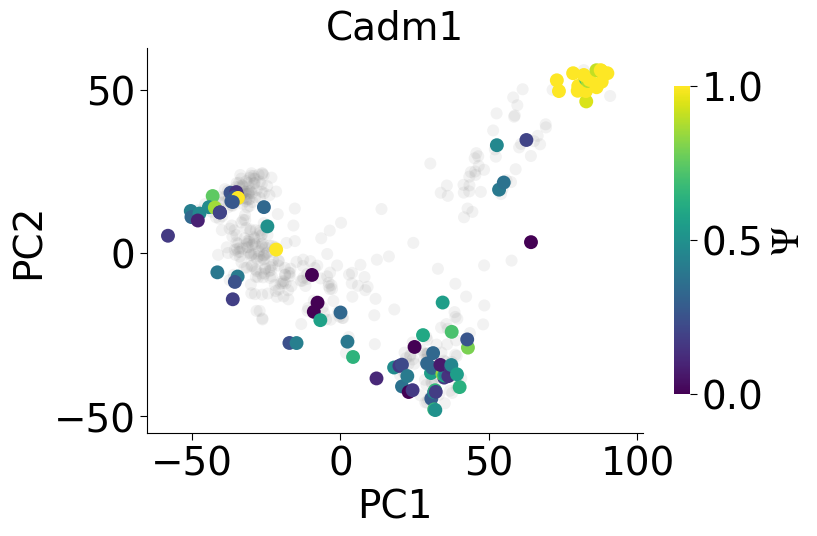

In [101]:
scp.plot_pca(chen_pca, chen_PSI, mrna_per_event_chen, chen_read_counts, chen_coverage_tab['SJ_coverage'], 
             'Cadm1_2', 10, filter_cells=True, plot_dir = 'plots_review/figure3/events/')

### Figure 3h and Supp Figure 3h: Stacked histograms

Distribution of $\Psi$ densities in selected exons for each cell cluster. For each exon $k$, we only consider an observation in a given cell $j$ if:
* There are at least 10 mRNA molecules of the gene that contains the exon in the cell.
* There are at least $10 \cdot C_j (1-\Psi_{kj})$ informative junction reads of the exon in the cell.

Where $SJ_j$ is the splice junction read coverage in cell $j$, and $\Psi_{kj}$ is the observed $\Psi$ for exon $k$ in cell $j$. 

We plot one stacked histogram for each cell cluster from the agglomerative clustering shown above. For each exon, we keep the exons that show observations in at least 50% of the cells. For the purpose of display, here we only show the exons with average cluster $\Psi$ between 0.1 and 0.9. (For further analysis, we use exons with average 0.05-0.95 $\Psi$). 

#### Chen dataset

Four annotated cell types, but we use five clusters. This is because the cells annotated as neurons were highly heterogeneous, and at least two distinct subpopulations were constantly observed.

../../utils/single_cell_plots.py:908: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0.05, 0.235, 1, 0.95])


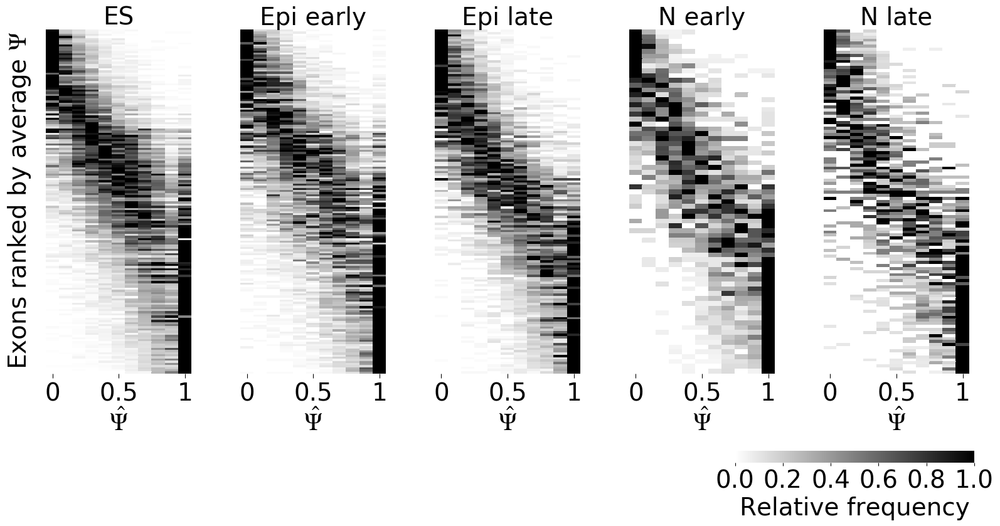

In [6]:
# import importlib
# importlib.reload(scp)
# importlib.reload(spu)
# sns.reset_orig()
# mpl.rcParams["mathtext.fontset"] = "stix"


hist_list = [x[4] for x in chen_clust_filter]

dset_name_list = ['ES', 'Epi early', 'Epi late', 'N early', 'N late']

# scp.plot_histograms(hist_list, dset_name_list, fig_len=10, fig_height = 10, ypos1=0.025, ypos2 = 0.625,
#                     plot_dir = 'plots_review/figure3/', plot_name = 'PSI_distributions_filtered_clusters_chen_tight',
#                     plot_title = "", 
#                     ylab='Exons ranked by average $\Psi$', ls=28, sk=3, tfs=20, nbins=11, 
#                     name_size=28, wspace=0.025, hspace=0.1)


scp.plot_histograms(hist_list, dset_name_list, fig_len=16, fig_height = 10, ypos1=0.025, ypos2 = 0.625,
                    plot_dir = 'plots_review/figure3/', plot_name = 'PSI_distributions_filtered_clusters_chen',
                    plot_title = "", 
                    ylab='Exons ranked by average $\Psi$', ls=28, sk=4, tfs=20, nbins=11, name_size=28, wspace=2, hspace=0.1)

plt.show()

#### Song dataset

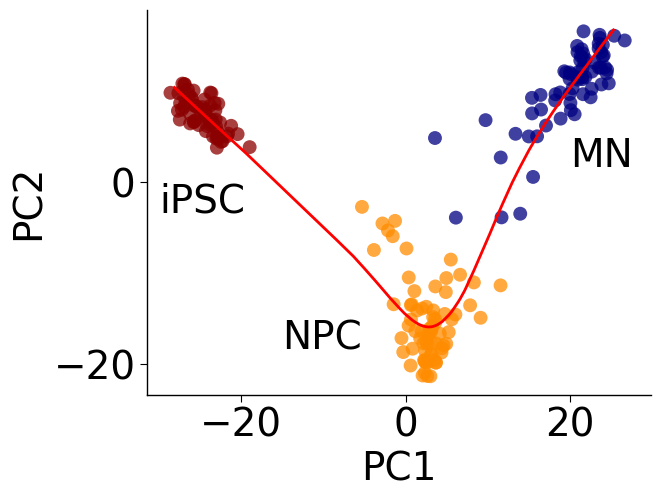

In [148]:
figsize(6.5,5)
fig = plt.figure()
ax  = plt.subplot(1,1,1)

ax.scatter(-song_pca_clust.PC1.loc[song_pca_clust.AC==1], 
           song_pca_clust.PC2.loc[song_pca_clust.AC==1], 
           c='darkred', s=100, edgecolors='none', label='iPSC', alpha=0.75)

ax.scatter(-song_pca_clust.PC1.loc[song_pca_clust.AC==2], 
           song_pca_clust.PC2.loc[song_pca_clust.AC==2], 
           c='darkorange', s=100, edgecolors='none', label='NPC', alpha=0.75)

ax.scatter(-song_pca_clust.PC1.loc[song_pca_clust.AC==0], 
           song_pca_clust.PC2.loc[song_pca_clust.AC==0], 
           c='navy', s=100, edgecolors='none', label='MN', alpha=0.75)


ax.plot(-song_pca_clust.line_1, -song_pca_clust.line_2, c='red',linewidth=2, label='lineage')


ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)


ax.tick_params(labelsize=28, length=5)

plt.ylabel('PC2', fontsize=28)
plt.xlabel('PC1', fontsize=28)


ax.text(-30, 0, 'iPSC', fontsize=28, verticalalignment='top')
ax.text(-15, -15, 'NPC', fontsize=28, verticalalignment='top')
ax.text(20, 5, 'MN', fontsize=28, verticalalignment='top')

plt.show()

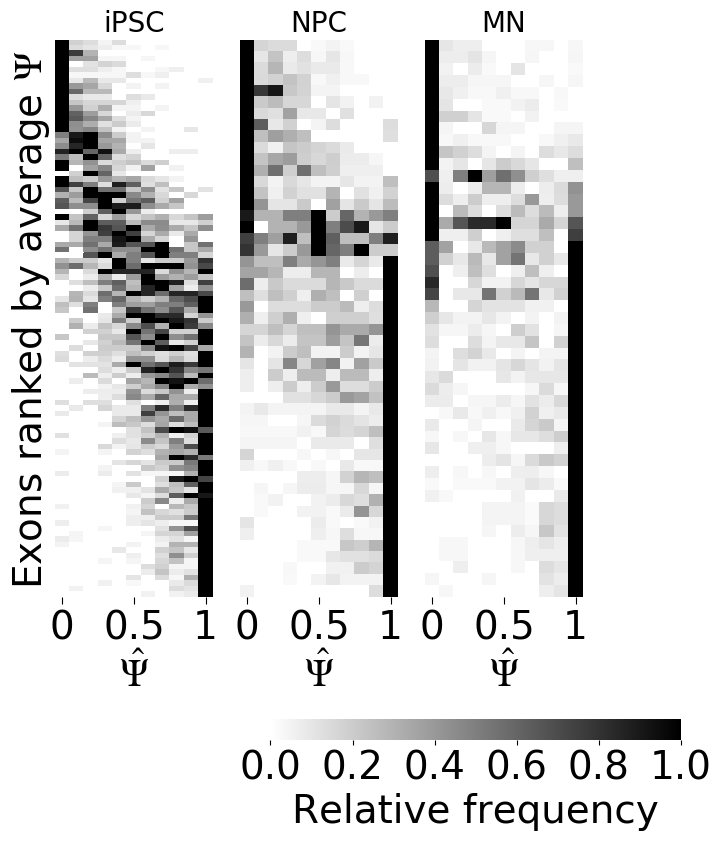

In [104]:
# Commented code was made to replicate the plots with exactly the same width for paper figures.

# shalek_int_genes_10, shalek_int_exons_10 = spu.get_int_events(shalek_PSI, shalek_mrna_counts, 0.1)
# shalek_int_exons_10 = [x for x in shalek_int_exons_10 if x in mrna_per_event_shalek.index]

# shalek_filtered_10 = process_subpop(shalek_PSI.columns, shalek_PSI, shalek_mrna_counts, mrna_per_event_shalek, 
#                                  shalek_read_counts, shalek_coverage_tab['SJ_coverage'], 0.1, 10, 0, cell_min=0.5)

# hist_list = [x[4] for x in song_clust_filter] + [shalek_filtered_10[4]]

# dset_name_list = ['iPSC', 'NPC', 'MN', 'BMDC']


# scp.plot_histograms(hist_list, dset_name_list, fig_len=10, fig_height = 10, ypos1=0.01, ypos2 = 0.625,
#                     plot_dir = 'plots_review/figure3/', plot_name = 'PSI_distributions_filtered_clusters_song_shalek',
#                     plot_title = "", 
#                     ylab='Exons ranked by average $\Psi$', ls=28, sk=3, tfs=20, nbins=11)

hist_list = [x[4] for x in song_clust_filter]

dset_name_list = ['iPSC', 'NPC', 'MN']


scp.plot_histograms(hist_list, dset_name_list, fig_len=10, fig_height = 10, ypos1=0.01, ypos2 = 0.625,
                    plot_dir = 'plots_review/figure3/', plot_name = 'PSI_distributions_filtered_clusters_song',
                    plot_title = "", 
                    ylab='Exons ranked by average $\Psi$', ls=28, sk=3, tfs=20, nbins=11)


plt.show()

#### Lescroart dataset

For this dataset, I am actually using the original labels (instead of agglomerative clustering), because they seem to separate the cells quite well.

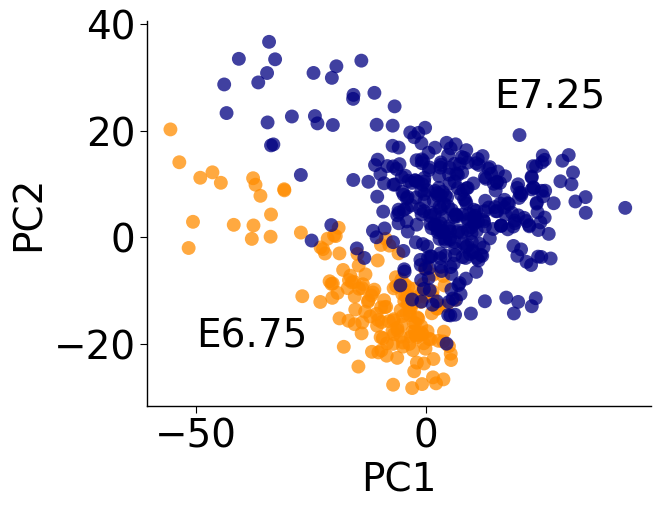

In [157]:
figsize(6.5,5)
fig = plt.figure()
ax  = plt.subplot(1,1,1)

ax.scatter(lescroart_pca_clust.PC1.loc[lescroart_pca_clust.cell_type=='E6.75'], 
           lescroart_pca_clust.PC2.loc[lescroart_pca_clust.cell_type=='E6.75'], 
           c='darkorange', s=100, edgecolors='none', label='E6.75', alpha=0.75)

ax.scatter(lescroart_pca_clust.PC1.loc[lescroart_pca_clust.cell_type=='E7.25'], 
           lescroart_pca_clust.PC2.loc[lescroart_pca_clust.cell_type=='E7.25'], 
           c='navy', s=100, edgecolors='none', label='E7.25', alpha=0.75)



ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)


ax.tick_params(labelsize=28, length=5)

plt.ylabel('PC2', fontsize=28)
plt.xlabel('PC1', fontsize=28)


ax.text(-50, -15, 'E6.75', fontsize=28, verticalalignment='top')
ax.text(15, 30, 'E7.25', fontsize=28, verticalalignment='top')
# ax.text(20, 5, 'MN', fontsize=28, verticalalignment='top')

plt.show()

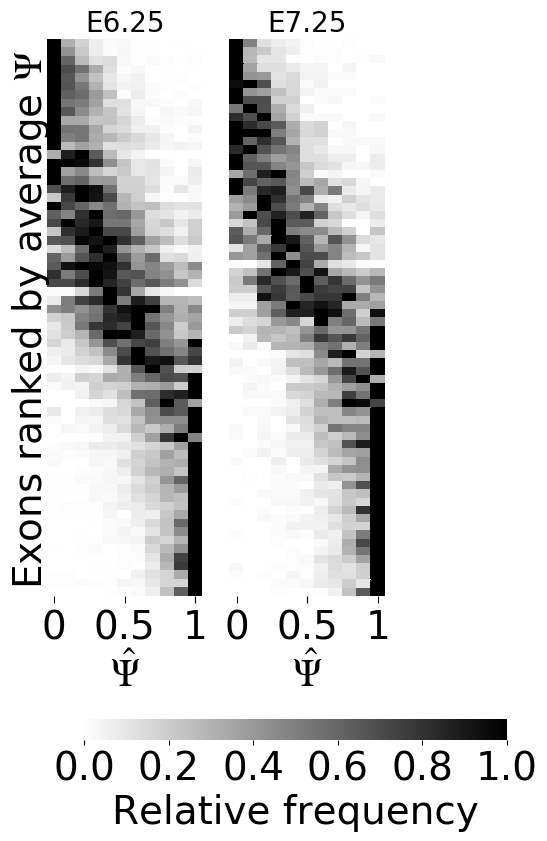

In [105]:
lescroart_clust_filter = []
for cluster in lescroart_pca_clust.cell_type.unique():
    clust_subpop = lescroart_pca_clust.index[lescroart_pca_clust.cell_type == cluster]
    
    lescroart_filter = process_subpop(clust_subpop, lescroart_PSI, lescroart_mrna_counts, mrna_per_event_lescroart, 
                                 lescroart_read_counts, lescroart_coverage_tab['SJ_coverage'], 0.1, 10, 0, cell_min=0.5)
    
    lescroart_clust_filter.append(lescroart_filter)
    

# hist_list = [x[4] for x in lescroart_clust_filter]*2

# dset_name_list = ['E6.25', 'E7.25', 'E6.25', 'E7.25']

hist_list = [x[4] for x in lescroart_clust_filter]

dset_name_list = ['E6.25', 'E7.25']


scp.plot_histograms(hist_list, dset_name_list, fig_len=10, fig_height = 10, ypos1=0.01, ypos2 = 0.625,
                    plot_dir = 'plots_review/figure3/', plot_name = 'PSI_distributions_filtered_clusters_lescroart',
                    plot_title = "", 
                    ylab='Exons ranked by average $\Psi$', ls=28, sk=3, tfs=20, nbins=11)

plt.show()

#### Trapnell dataset

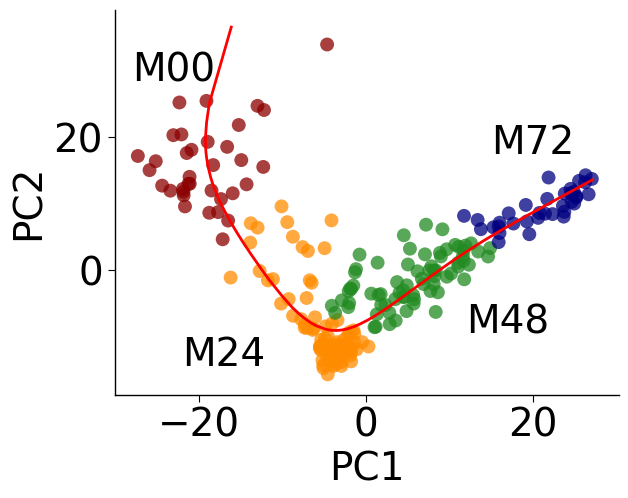

In [169]:
figsize(6.5,5)
fig = plt.figure()
ax  = plt.subplot(1,1,1)

ax.scatter(trapnell_pca_clust.PC1.loc[trapnell_pca_clust.AC==3], 
           trapnell_pca_clust.PC2.loc[trapnell_pca_clust.AC==3], 
           c='darkred', s=100, edgecolors='none', label='MM0', alpha=0.75)

ax.scatter(trapnell_pca_clust.PC1.loc[trapnell_pca_clust.AC==0], 
           trapnell_pca_clust.PC2.loc[trapnell_pca_clust.AC==0], 
           c='darkorange', s=100, edgecolors='none', label='M24', alpha=0.75)

ax.scatter(trapnell_pca_clust.PC1.loc[trapnell_pca_clust.AC==1], 
           trapnell_pca_clust.PC2.loc[trapnell_pca_clust.AC==1], 
           c='forestgreen', s=100, edgecolors='none', label='M48', alpha=0.75)

ax.scatter(trapnell_pca_clust.PC1.loc[trapnell_pca_clust.AC==2], 
           trapnell_pca_clust.PC2.loc[trapnell_pca_clust.AC==2], 
           c='navy', s=100, edgecolors='none', label='M72', alpha=0.75)


ax.plot(trapnell_pca_clust.line_1, trapnell_pca_clust.line_2, c='red',linewidth=2, label='lineage')


ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)


ax.tick_params(labelsize=28, length=5)

plt.ylabel('PC2', fontsize=28)
plt.xlabel('PC1', fontsize=28)


ax.text(-28, 33, 'M00', fontsize=28, verticalalignment='top')
ax.text(-22, -10, 'M24', fontsize=28, verticalalignment='top')
ax.text(12, -5, 'M48', fontsize=28, verticalalignment='top')
ax.text(15, 22, 'M72', fontsize=28, verticalalignment='top')

plt.show()

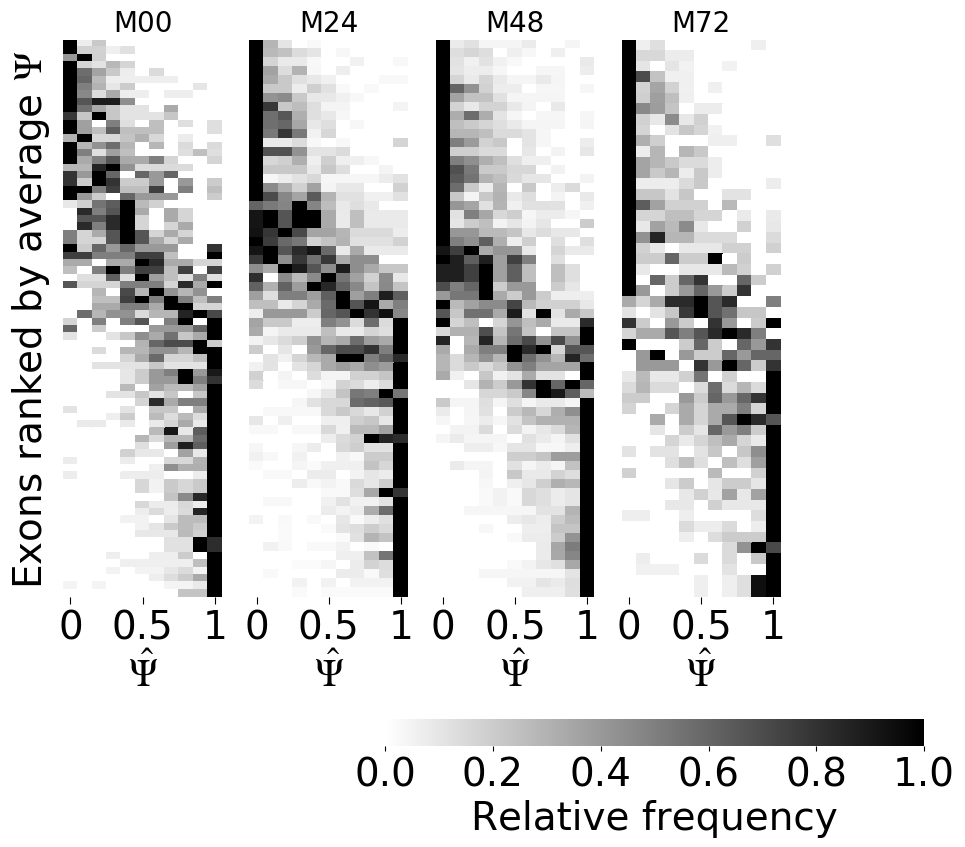

In [21]:
hist_list = [x[4] for x in trapnell_clust_filter]

dset_name_list = ['M00', 'M24', 'M48', 'M72']


scp.plot_histograms(hist_list, dset_name_list, fig_len=10, fig_height = 10, ypos1=0.01, ypos2 = 0.625,
                    plot_dir = 'plots_review/figure3/', plot_name = 'PSI_distributions_filtered_clusters_trapnell',
                    plot_title = "", 
                    ylab='Exons ranked by average $\Psi$',ls=28, sk=4, tfs=20, nbins=11)

plt.show()

#### Shalek dataset

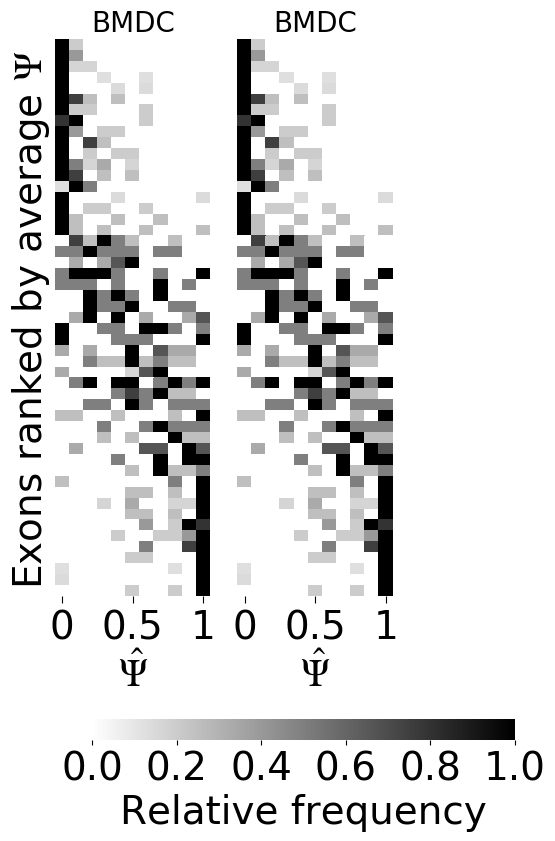

In [107]:
shalek_int_genes_10, shalek_int_exons_10 = spu.get_int_events(shalek_PSI, shalek_mrna_counts, 0.1)
shalek_int_exons_10 = [x for x in shalek_int_exons_10 if x in mrna_per_event_shalek.index]

shalek_filtered_10 = process_subpop(shalek_PSI.columns, shalek_PSI, shalek_mrna_counts, mrna_per_event_shalek, 
                                 shalek_read_counts, shalek_coverage_tab['SJ_coverage'], 0.1, 10, 0, cell_min=0.5)

# scp.plot_histograms([shalek_filtered_10[4], trapnell_clust_filter[0][4]], 
#                     ['BMDC', 'trapnell0'], fig_len=12, fig_height = 10, ypos1=-0.01, ypos2 = 0.625,
#                     plot_dir = 'plots_review/figure3/', plot_name = 'PSI_distributions_filtered_clusters_shalek',
#                     plot_title = "", 
#                     ylab='Exons ranked by average $\Psi$', ls=28, sk=3, tfs=20, nbins=11)


# I am plotting the same histogram twice because plotting only one distors the image

scp.plot_histograms([shalek_filtered_10[4], shalek_filtered_10[4]], 
                    ['BMDC', 'BMDC'], fig_len=12, fig_height = 10, ypos1=-0.01, ypos2 = 0.625,
                    plot_dir = 'plots_review/figure3/', plot_name = 'PSI_distributions_filtered_clusters_shalek',
                    plot_title = "", 
                    ylab='Exons ranked by average $\Psi$', ls=28, sk=3, tfs=20, nbins=11)


#### Fletcher dataset

In [23]:
das_sra = pd.read_csv('/mnt/c/Users/ferna/Desktop/SingleCell/data/das/SraRunTable.txt', sep='\t', index_col = 6)
das_sra = das_sra.loc[das_PSI.columns]
das_clust_filter = []
for cluster in sorted(das_sra.age.unique()):
    clust_subpop = das_sra.index[das_sra.age == cluster]
    
    das_filter = process_subpop(clust_subpop, das_PSI, das_mrna_counts, mrna_per_event_das, 
                                 das_read_counts, das_coverage_tab['SJ_coverage'], 0.1, 10, 0, cell_min=0.5)
    
    das_clust_filter.append(das_filter)

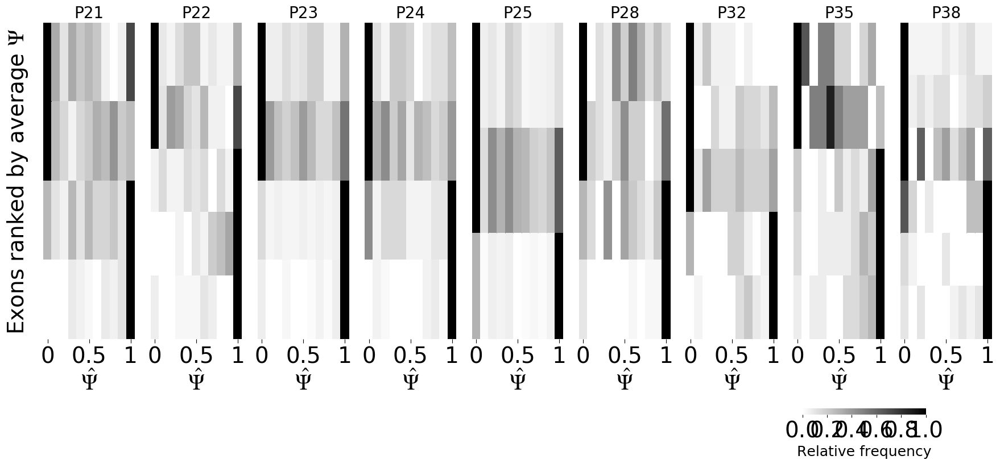

In [24]:
hist_list = [x[4] for x in das_clust_filter]

dset_name_list =sorted(das_sra.age.unique())


scp.plot_histograms(hist_list, dset_name_list, fig_len=10, fig_height = 10, ypos1=0.025, ypos2 = 0.625,
                    plot_dir = 'plots_review/figure3/', plot_name = 'PSI_distributions_filtered_clusters_das',
                    plot_title = "", 
                    ylab='Exons ranked by average $\Psi$', ls=18, sk=1.65, tfs=20, nbins=11)

plt.show()

### Figure 3g: Quantifying selected exons

In [105]:
chen_filtered = filter_psi(chen_PSI, chen_int_exons, mrna_per_event_chen, chen_coverage_tab['SJ_coverage'], 
                           chen_read_counts, 10, 0, cell_min=0.5)

lescroart_filtered = filter_psi(lescroart_PSI, lescroart_int_exons, mrna_per_event_lescroart, lescroart_coverage_tab['SJ_coverage'], 
                           lescroart_read_counts, 10, 0, cell_min=0.5)

trapnell_filtered = filter_psi(trapnell_PSI, trapnell_int_exons, mrna_per_event_trapnell, trapnell_coverage_tab['SJ_coverage'], 
                           trapnell_read_counts, 10, 0, cell_min=0.5)

song_filtered = filter_psi(song_PSI, song_int_exons, mrna_per_event_song, song_coverage_tab['SJ_coverage'], 
                           song_read_counts, 10, 0, cell_min=0.5)

das_filtered = filter_psi(das_PSI, das_int_exons, mrna_per_event_das, das_coverage_tab['SJ_coverage'], 
                           das_read_counts, 10, 0, cell_min=0.5)

shalek_filtered = filter_psi(shalek_PSI, shalek_int_exons, mrna_per_event_shalek, shalek_coverage_tab['SJ_coverage'], 
                           shalek_read_counts, 10, 0, cell_min=0.5)

filtered_exons_count = []
filtered_exons_count.append(chen_filtered[0].shape[0])
filtered_exons_count.append(lescroart_filtered[0].shape[0])
filtered_exons_count.append(trapnell_filtered[0].shape[0])
filtered_exons_count.append(song_filtered[0].shape[0])
filtered_exons_count.append(das_filtered[0].shape[0])
filtered_exons_count.append(shalek_filtered[0].shape[0])

NameError: name 'lescroart_int_exons' is not defined

In [109]:
filtered_exons_count

[222, 114, 93, 106, 5, 70]

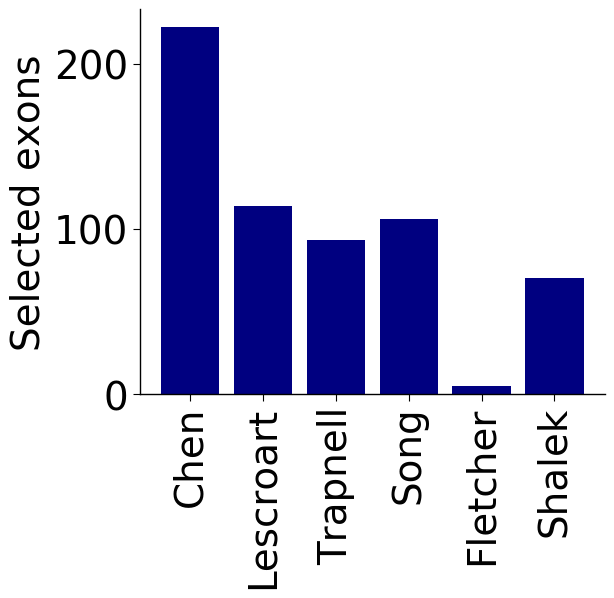

In [110]:
fig, ax = plt.subplots(figsize=(6, 5))

ax.bar([1, 2, 3, 4, 5, 6], filtered_exons_count, color='navy')
ax.tick_params(labelsize=28)
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
# ax.spines['left'].set_linewidth(2)
# ax.spines['bottom'].set_linewidth(2)

ax.xaxis.set_tick_params(length=5)
ax.yaxis.set_tick_params(length=5)


plt.ylabel("Selected exons", fontsize=28)

locs, labels = plt.yticks()


plt.xticks([1, 2, 3, 4, 5, 6], ['Chen', 'Lescroart', 'Trapnell', 'Song', 'Fletcher', 'Shalek'], 
           fontsize=28, rotation='vertical')    

plt.savefig('plots_review/figure3/selected_exons_per_dataset.svg', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/selected_exons_per_dataset.pdf', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/selected_exons_per_dataset.png', dpi=300, bbox_inches='tight', transparent=True)

plt.show()

### All selected exons

In [111]:
selected_counts = []

chen_selected_list = []
for cluster in chen_clust_filter_05:
    chen_selected_list.extend(list(cluster[0].index))
    
selected_counts.append(len(sorted(set(chen_selected_list))))

lescroart_selected_list = []
for cluster in lescroart_clust_filter_05:
    lescroart_selected_list.extend(list(cluster[0].index))
    
selected_counts.append(len(sorted(set(lescroart_selected_list))))

trapnell_selected_list = []
for cluster in trapnell_clust_filter_05:
    trapnell_selected_list.extend(list(cluster[0].index))
    
selected_counts.append(len(sorted(set(trapnell_selected_list))))

song_selected_list = []
for cluster in song_clust_filter_05:
    song_selected_list.extend(list(cluster[0].index))
    
selected_counts.append(len(sorted(set(song_selected_list))))

das_selected_list = []
for cluster in das_clust_filter_05:
    das_selected_list.extend(list(cluster[0].index))
    
selected_counts.append(len(sorted(set(das_selected_list))))

selected_counts.append(shalek_filtered[0].shape[0])

In [113]:
# for i in range(len(das_clust_filter_05)-1):
#     for j in range(i+1, len(das_clust_filter_05)):
#         print(len(das_clust_filter_05[i][0].index & das_clust_filter_05[j][0].index))

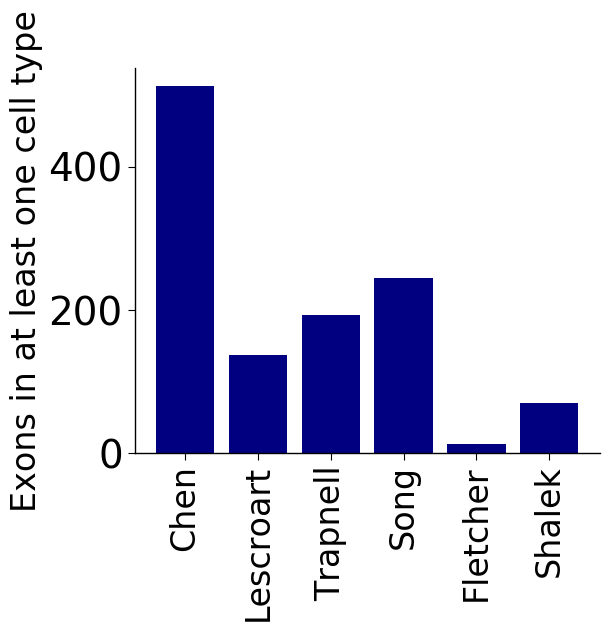

In [114]:
fig, ax = plt.subplots(figsize=(6, 5))

ax.bar([1, 2, 3, 4, 5, 6], selected_counts, color='navy')
ax.tick_params(labelsize=28)
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
# ax.spines['left'].set_linewidth(2)
# ax.spines['bottom'].set_linewidth(2)

ax.xaxis.set_tick_params(length=5)
ax.yaxis.set_tick_params(length=5)


plt.ylabel("Exons in at least one cell type", fontsize=24)

locs, labels = plt.yticks()


plt.xticks([1, 2, 3, 4, 5, 6], ['Chen', 'Lescroart', 'Trapnell', 'Song', 'Fletcher', 'Shalek'], 
           fontsize=24, rotation='vertical')    

plt.savefig('plots_review/figure3/selected_exons_per_cell_type_per_dataset.svg', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/selected_exons_per_cell_type_per_dataset.pdf', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/selected_exons_per_cell_type_per_dataset.png', dpi=300, bbox_inches='tight', transparent=True)

plt.show()

([<matplotlib.axis.XTick at 0x7f098d0a8cc0>,
 <a list of 6 Text xticklabel objects>)

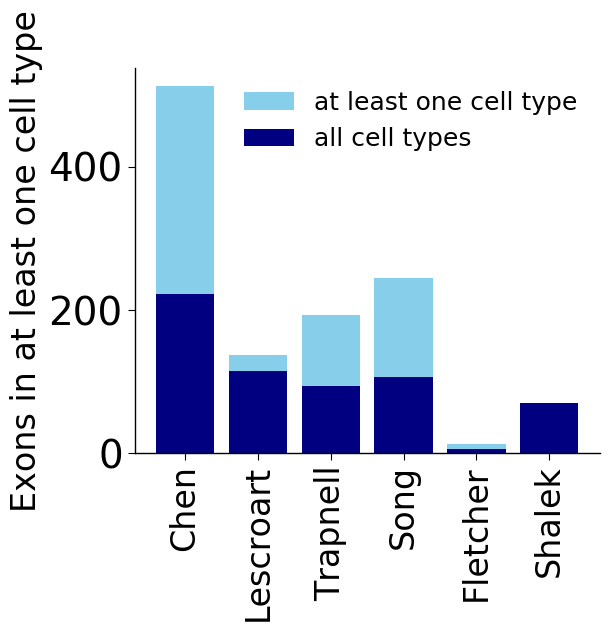

In [115]:
fig, ax = plt.subplots(figsize=(6, 5))

ax.bar([1, 2, 3, 4, 5, 6], selected_counts, color='skyblue', label='at least one cell type')
ax.bar([1, 2, 3, 4, 5, 6], filtered_exons_count, color='navy', label='all cell types')
ax.tick_params(labelsize=28)
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
# ax.spines['left'].set_linewidth(2)
# ax.spines['bottom'].set_linewidth(2)

ax.xaxis.set_tick_params(length=5)
ax.yaxis.set_tick_params(length=5)


plt.ylabel("Exons in at least one cell type", fontsize=24)

locs, labels = plt.yticks()
plt.legend(frameon=False, fontsize=18)

plt.xticks([1, 2, 3, 4, 5, 6], ['Chen', 'Lescroart', 'Trapnell', 'Song', 'Fletcher', 'Shalek'], 
           fontsize=24, rotation='vertical')    

###  Supp Fig 3e,g: Visualization of the distribution of $\hat{\Psi}$ observations towards extreme values 

In [5]:
%run -i '../../utils/bimodality_curves.py'

In [34]:
# chen_all, chen_mrna, chen_mrna_filtered = get_curves_dataset(chen_PSI, chen_ES2i, chen_mrna_counts, mrna_per_event_chen, 
#                                                              chen_read_counts, 
#                        chen_coverage_tab, psi_min = 0.2, mrna_min = 10, reads_min = 0, cell_min = 0.5, filter_cj = True,
#                       get_all = True, steps = 0.05)

#### Bimodality curves

Each curve corresponds to one exon. For each $\Psi$ cutoff = $x$, we calculate the percent of cells (out of those that have an observation of the exon; i.e., not counting NaNs) that have an observation of $x \leq \hat{\Psi} \leq (1-x)$.

To avoid bias towards extreme values as a result of extreme average splicing rate, we restrict the plot to only exons with average $\hat{\Psi}$ between 0.2 and 0.8. To avoid bias from differental splicing rates between cell types, we plot the curves for each cell type individually.

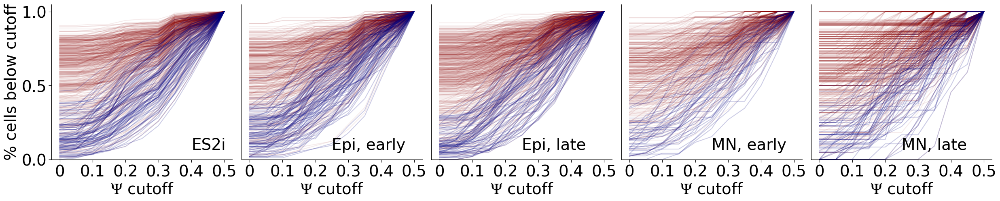

In [91]:
figsize(30, 5)
fig = plt.figure()

gs = GridSpec(1,5)
gs.update(wspace=0.05, hspace=1.05)

ax_1 = fig.add_subplot(gs[0,0])
ax_2 = fig.add_subplot(gs[0,1])
ax_3 = fig.add_subplot(gs[0,2])
ax_4 = fig.add_subplot(gs[0,3])
ax_5 = fig.add_subplot(gs[0,4])

ax_1.set_ylim((0,1.05))
ax_2.set_ylim((0,1.05))
ax_3.set_ylim((0,1.05))
ax_4.set_ylim((0,1.05))
ax_5.set_ylim((0,1.05))

plot_curves_dset(ax_1, chen_PSI, chen_pca_clust.index[chen_pca_clust.AC == 0], 
                 chen_mrna_counts, mrna_per_event_chen, chen_read_counts, chen_coverage_tab)
plot_curves_dset(ax_2, chen_PSI, chen_pca_clust.index[chen_pca_clust.AC == 1], 
                 chen_mrna_counts, mrna_per_event_chen, chen_read_counts, chen_coverage_tab)
plot_curves_dset(ax_3, chen_PSI, chen_pca_clust.index[chen_pca_clust.AC == 2], 
                 chen_mrna_counts, mrna_per_event_chen, chen_read_counts, chen_coverage_tab)
plot_curves_dset(ax_4, chen_PSI, chen_pca_clust.index[chen_pca_clust.AC == 3], 
                 chen_mrna_counts, mrna_per_event_chen, chen_read_counts, chen_coverage_tab)
plot_curves_dset(ax_5, chen_PSI, chen_pca_clust.index[chen_pca_clust.AC == 4], 
                 chen_mrna_counts, mrna_per_event_chen, chen_read_counts, chen_coverage_tab)


plt.setp(ax_2.get_yticklabels(), visible=False)
plt.setp(ax_3.get_yticklabels(), visible=False)
plt.setp(ax_4.get_yticklabels(), visible=False)
plt.setp(ax_5.get_yticklabels(), visible=False)
ax_2.yaxis.set_ticks_position('none')
ax_3.yaxis.set_ticks_position('none')
ax_4.yaxis.set_ticks_position('none')
ax_5.yaxis.set_ticks_position('none')


ax_1.text(0.40, 0.15, 'ES2i', fontsize=28, verticalalignment='top')
ax_2.text(0.25, 0.15, 'Epi, early', fontsize=28, verticalalignment='top')
ax_3.text(0.25, 0.15, 'Epi, late', fontsize=28, verticalalignment='top')
ax_4.text(0.25, 0.15, 'MN, early', fontsize=28, verticalalignment='top')
ax_5.text(0.25, 0.15, 'MN, late', fontsize=28, verticalalignment='top')


ax_1.set_xticks([0, 0.1, 0.2, 0.3, 0.4, 0.5])
ax_1.set_xticklabels(['0', '0.1', '0.2', '0.3', '0.4', '0.5'])
ax_2.set_xticks([0,0.1, 0.2, 0.3, 0.4, 0.5])
ax_2.set_xticklabels(['0','0.1', '0.2', '0.3', '0.4', '0.5'])
ax_3.set_xticks([0,0.1, 0.2, 0.3, 0.4, 0.5])
ax_3.set_xticklabels(['0','0.1', '0.2', '0.3', '0.4', '0.5'])
ax_4.set_xticks([0,0.1, 0.2, 0.3, 0.4, 0.5])
ax_4.set_xticklabels(['0','0.1', '0.2', '0.3', '0.4', '0.5'])
ax_5.set_xticks([0,0.1, 0.2, 0.3, 0.4, 0.5])
ax_5.set_xticklabels(['0','0.1', '0.2', '0.3', '0.4', '0.5'])
            
ax_1.set_ylabel('% cells below cutoff', fontsize = 28)

plt.savefig('plots_review/figure3/bimodality_curves_chen.svg', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/bimodality_curves_chen.pdf', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/bimodality_curves_chen.png', dpi=300, bbox_inches='tight', transparent=True)


plt.show()

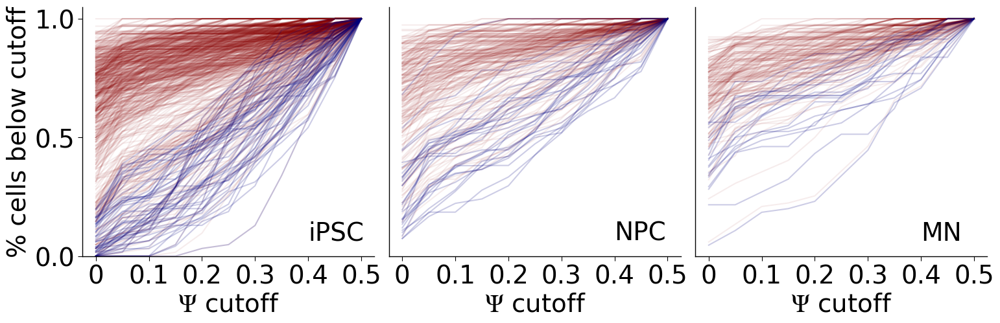

In [38]:
figsize(18, 5)
fig = plt.figure()

gs = GridSpec(1,3)
gs.update(wspace=0.05, hspace=1.05)

ax_1 = fig.add_subplot(gs[0,0])
ax_2 = fig.add_subplot(gs[0,1])
ax_3 = fig.add_subplot(gs[0,2])

ax_1.set_ylim((0,1.05))
ax_2.set_ylim((0,1.05))
ax_3.set_ylim((0,1.05))

plot_curves_dset(ax_1, song_PSI, song_clust_filter[0][0].columns, 
                 song_mrna_counts, mrna_per_event_song, song_read_counts, song_coverage_tab)
plot_curves_dset(ax_2, song_PSI, song_clust_filter[1][0].columns, 
                 song_mrna_counts, mrna_per_event_song, song_read_counts, song_coverage_tab)
plot_curves_dset(ax_3, song_PSI, song_clust_filter[2][0].columns, 
                 song_mrna_counts, mrna_per_event_song, song_read_counts, song_coverage_tab)

plt.setp(ax_2.get_yticklabels(), visible=False)
plt.setp(ax_3.get_yticklabels(), visible=False)
ax_2.yaxis.set_ticks_position('none')
ax_3.yaxis.set_ticks_position('none')

ax_1.text(0.40, 0.15, 'iPSC', fontsize=28, verticalalignment='top')
ax_2.text(0.40, 0.15, 'NPC', fontsize=28, verticalalignment='top')
ax_3.text(0.40, 0.15, 'MN', fontsize=28, verticalalignment='top')

ax_1.set_xticks([0, 0.1, 0.2, 0.3, 0.4, 0.5])
ax_1.set_xticklabels(['0', '0.1', '0.2', '0.3', '0.4', '0.5'])
ax_2.set_xticks([0,0.1, 0.2, 0.3, 0.4, 0.5])
ax_2.set_xticklabels(['0','0.1', '0.2', '0.3', '0.4', '0.5'])
ax_3.set_xticks([0,0.1, 0.2, 0.3, 0.4, 0.5])
ax_3.set_xticklabels(['0','0.1', '0.2', '0.3', '0.4', '0.5'])
            
ax_1.set_ylabel('% cells below cutoff', fontsize = 28)

plt.savefig('plots_review/figure3/bimodality_curves_song.svg', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/bimodality_curves_song.pdf', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/bimodality_curves_song.png', dpi=300, bbox_inches='tight', transparent=True)


plt.show()

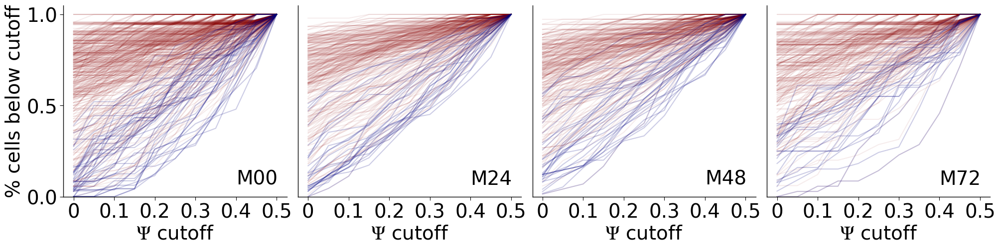

In [39]:
figsize(24, 5)
fig = plt.figure()

gs = GridSpec(1,4)
gs.update(wspace=0.05, hspace=1.05)

ax_1 = fig.add_subplot(gs[0,0])
ax_2 = fig.add_subplot(gs[0,1])
ax_3 = fig.add_subplot(gs[0,2])
ax_4 = fig.add_subplot(gs[0,3])

ax_1.set_ylim((0,1.05))
ax_2.set_ylim((0,1.05))
ax_3.set_ylim((0,1.05))
ax_4.set_ylim((0,1.05))

plot_curves_dset(ax_1, trapnell_PSI, trapnell_clust_filter[0][0].columns, 
                 trapnell_mrna_counts, mrna_per_event_trapnell, trapnell_read_counts, trapnell_coverage_tab)
plot_curves_dset(ax_2, trapnell_PSI, trapnell_clust_filter[1][0].columns, 
                 trapnell_mrna_counts, mrna_per_event_trapnell, trapnell_read_counts, trapnell_coverage_tab)
plot_curves_dset(ax_3, trapnell_PSI, trapnell_clust_filter[2][0].columns, 
                 trapnell_mrna_counts, mrna_per_event_trapnell, trapnell_read_counts, trapnell_coverage_tab)
plot_curves_dset(ax_4, trapnell_PSI, trapnell_clust_filter[3][0].columns, 
                 trapnell_mrna_counts, mrna_per_event_trapnell, trapnell_read_counts, trapnell_coverage_tab)

plt.setp(ax_2.get_yticklabels(), visible=False)
plt.setp(ax_3.get_yticklabels(), visible=False)
plt.setp(ax_4.get_yticklabels(), visible=False)
ax_2.yaxis.set_ticks_position('none')
ax_3.yaxis.set_ticks_position('none')
ax_4.yaxis.set_ticks_position('none')


ax_1.text(0.40, 0.15, 'M00', fontsize=28, verticalalignment='top')
ax_2.text(0.40, 0.15, 'M24', fontsize=28, verticalalignment='top')
ax_3.text(0.40, 0.15, 'M48', fontsize=28, verticalalignment='top')
ax_4.text(0.40, 0.15, 'M72', fontsize=28, verticalalignment='top')

ax_1.set_xticks([0, 0.1, 0.2, 0.3, 0.4, 0.5])
ax_1.set_xticklabels(['0', '0.1', '0.2', '0.3', '0.4', '0.5'])
ax_2.set_xticks([0,0.1, 0.2, 0.3, 0.4, 0.5])
ax_2.set_xticklabels(['0','0.1', '0.2', '0.3', '0.4', '0.5'])
ax_3.set_xticks([0,0.1, 0.2, 0.3, 0.4, 0.5])
ax_3.set_xticklabels(['0','0.1', '0.2', '0.3', '0.4', '0.5'])
ax_4.set_xticks([0,0.1, 0.2, 0.3, 0.4, 0.5])
ax_4.set_xticklabels(['0','0.1', '0.2', '0.3', '0.4', '0.5'])
            
ax_1.set_ylabel('% cells below cutoff', fontsize = 28)

plt.savefig('plots_review/figure3/bimodality_curves_trapnell.svg', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/bimodality_curves_trapnell.pdf', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/bimodality_curves_trapnell.png', dpi=300, bbox_inches='tight', transparent=True)


plt.show()

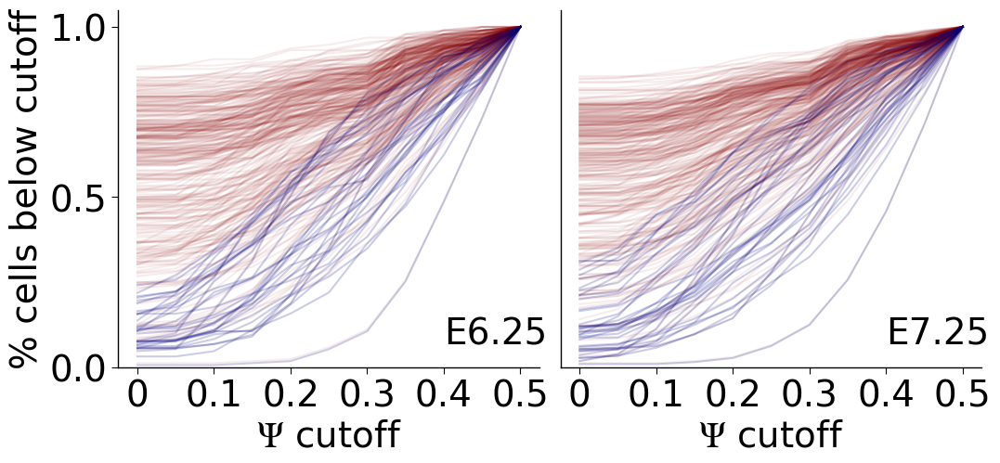

In [40]:
figsize(12, 5)
fig = plt.figure()

gs = GridSpec(1,2)
gs.update(wspace=0.05, hspace=1.05)

ax_1 = fig.add_subplot(gs[0,0])
ax_2 = fig.add_subplot(gs[0,1])

ax_1.set_ylim((0,1.05))
ax_2.set_ylim((0,1.05))

plot_curves_dset(ax_1, lescroart_PSI, lescroart_E6, 
                 lescroart_mrna_counts, mrna_per_event_lescroart, lescroart_read_counts, lescroart_coverage_tab)
plot_curves_dset(ax_2, lescroart_PSI, lescroart_E7, 
                 lescroart_mrna_counts, mrna_per_event_lescroart, lescroart_read_counts, lescroart_coverage_tab)

plt.setp(ax_2.get_yticklabels(), visible=False)
ax_2.yaxis.set_ticks_position('none')

ax_1.text(0.40, 0.15, 'E6.25', fontsize=28, verticalalignment='top')
ax_2.text(0.40, 0.15, 'E7.25', fontsize=28, verticalalignment='top')

ax_1.set_xticks([0, 0.1, 0.2, 0.3, 0.4, 0.5])
ax_1.set_xticklabels(['0', '0.1', '0.2', '0.3', '0.4', '0.5'])
ax_2.set_xticks([0,0.1, 0.2, 0.3, 0.4, 0.5])
ax_2.set_xticklabels(['0','0.1', '0.2', '0.3', '0.4', '0.5'])

ax_1.set_ylabel('% cells below cutoff', fontsize = 28)

plt.savefig('plots_review/figure3/bimodality_curves_lescroart.svg', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/bimodality_curves_lescroart.pdf', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/bimodality_curves_lescroart.png', dpi=300, bbox_inches='tight', transparent=True)


plt.show()

#### The first cluster of each dataset, for Supp Figure 3e

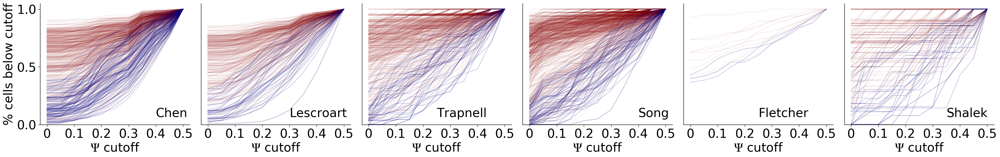

In [42]:
figsize(39, 5)
fig = plt.figure()

gs = GridSpec(1,6)
gs.update(wspace=0.075, hspace=1.05)

ax_1 = fig.add_subplot(gs[0,0])
ax_2 = fig.add_subplot(gs[0,1])
ax_3 = fig.add_subplot(gs[0,2])
ax_4 = fig.add_subplot(gs[0,3])
ax_5 = fig.add_subplot(gs[0,4])
ax_6 = fig.add_subplot(gs[0,5])

ax_1.set_ylim((0,1.05))
ax_2.set_ylim((0,1.05))
ax_3.set_ylim((0,1.05))
ax_4.set_ylim((0,1.05))
ax_5.set_ylim((0,1.05))
ax_6.set_ylim((0,1.05))


plot_curves_dset(ax_1, chen_PSI, chen_clust_filter[0][0].columns, 
                 chen_mrna_counts, mrna_per_event_chen, chen_read_counts, chen_coverage_tab)


plot_curves_dset(ax_2, lescroart_PSI, lescroart_clust_filter[0][0].columns, 
                 lescroart_mrna_counts, mrna_per_event_lescroart, lescroart_read_counts, lescroart_coverage_tab)


plot_curves_dset(ax_3, trapnell_PSI, trapnell_clust_filter[0][0].columns, 
                 trapnell_mrna_counts, mrna_per_event_trapnell, trapnell_read_counts, trapnell_coverage_tab)


plot_curves_dset(ax_4, song_PSI, song_clust_filter[0][0].columns, 
                 song_mrna_counts, mrna_per_event_song, song_read_counts, song_coverage_tab)


plot_curves_dset(ax_5, das_PSI, das_sra.loc[das_sra.age == 'P21'].index, 
                 das_mrna_counts, mrna_per_event_das, das_read_counts, das_coverage_tab)

plot_curves_dset(ax_6, shalek_PSI, shalek_PSI.columns, 
                 shalek_mrna_counts, mrna_per_event_shalek, shalek_read_counts, shalek_coverage_tab)


plt.setp(ax_2.get_yticklabels(), visible=False)
plt.setp(ax_3.get_yticklabels(), visible=False)
plt.setp(ax_4.get_yticklabels(), visible=False)
plt.setp(ax_5.get_yticklabels(), visible=False)
plt.setp(ax_6.get_yticklabels(), visible=False)
ax_2.yaxis.set_ticks_position('none')
ax_3.yaxis.set_ticks_position('none')
ax_4.yaxis.set_ticks_position('none')
ax_5.yaxis.set_ticks_position('none')
ax_6.yaxis.set_ticks_position('none')


ax_1.text(0.40, 0.15, 'Chen', fontsize=28, verticalalignment='top')
ax_2.text(0.3, 0.15, 'Lescroart', fontsize=28, verticalalignment='top')
ax_3.text(0.25, 0.15, 'Trapnell', fontsize=28, verticalalignment='top')
ax_4.text(0.40, 0.15, 'Song', fontsize=28, verticalalignment='top')
ax_5.text(0.25, 0.15, 'Fletcher', fontsize=28, verticalalignment='top')
ax_6.text(0.35, 0.15, 'Shalek', fontsize=28, verticalalignment='top')


ax_1.set_xticks([0, 0.1, 0.2, 0.3, 0.4, 0.5])
ax_1.set_xticklabels(['0', '0.1', '0.2', '0.3', '0.4', '0.5'])
ax_2.set_xticks([0,0.1, 0.2, 0.3, 0.4, 0.5])
ax_2.set_xticklabels(['0','0.1', '0.2', '0.3', '0.4', '0.5'])
ax_3.set_xticks([0,0.1, 0.2, 0.3, 0.4, 0.5])
ax_3.set_xticklabels(['0','0.1', '0.2', '0.3', '0.4', '0.5'])
ax_4.set_xticks([0,0.1, 0.2, 0.3, 0.4, 0.5])
ax_4.set_xticklabels(['0','0.1', '0.2', '0.3', '0.4', '0.5'])
ax_5.set_xticks([0,0.1, 0.2, 0.3, 0.4, 0.5])
ax_5.set_xticklabels(['0','0.1', '0.2', '0.3', '0.4', '0.5'])
ax_6.set_xticks([0,0.1, 0.2, 0.3, 0.4, 0.5])
ax_6.set_xticklabels(['0','0.1', '0.2', '0.3', '0.4', '0.5'])
            
ax_1.set_ylabel('% cells below cutoff', fontsize = 28)

plt.savefig('plots_review/figure3/bimodality_curves_all_dsets.svg', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/bimodality_curves_all_dsets.pdf', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/bimodality_curves_all_dsets.png', dpi=300, bbox_inches='tight', transparent=True)

plt.show()

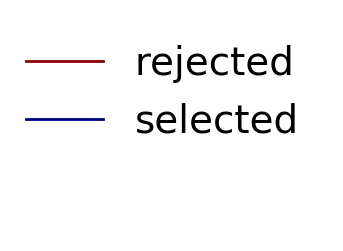

In [43]:
figsize(4,3)
fig = plt.figure()
ax  = plt.subplot(1,1,1)

ax.plot([], c='darkred', label='rejected', linewidth=2)
ax.plot([], c='navy', label='selected', linewidth=2)

ax.spines["top"].set_visible(False)
ax.spines["bottom"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.spines["right"].set_visible(False)
plt.setp(ax.get_xticklabels(), visible=False)
plt.setp(ax.get_yticklabels(), visible=False)
ax.xaxis.set_ticks_position('none') 
ax.yaxis.set_ticks_position('none')
plt.legend(fontsize=28, frameon=False)

plt.savefig('plots_review/figure3/bimodality_curves_legend.svg', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/bimodality_curves_legend.pdf', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/bimodality_curves_legend.png', bbox_inches='tight', transparent=True)
plt.show()

#### Binarity boxplots

Boxplots with the percent of cells with binary $\hat{\Psi}$ for all observed exon. For each cluster, in each dataset, we plot this distribution for all observed exons, the exons selected with the mRNA filter, and the exons selected with the flat-read minimum filter.

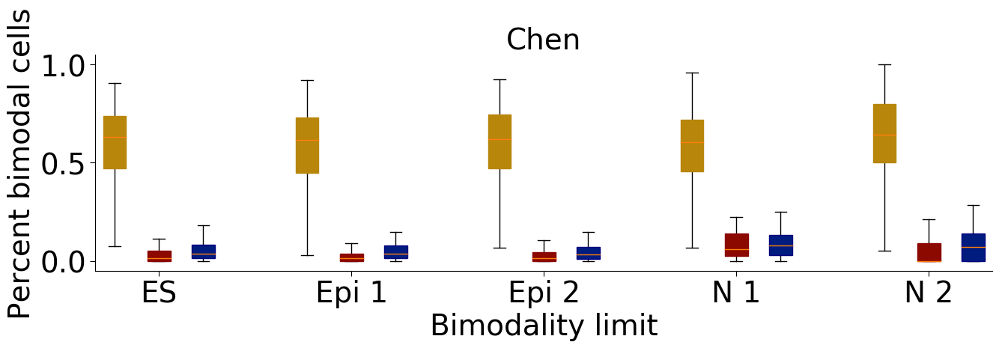

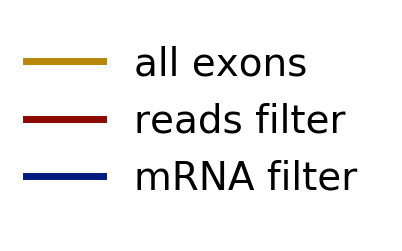

In [93]:
chen_subpop_list = [chen_clust_filter[0][0].columns, chen_clust_filter[1][0].columns, chen_clust_filter[2][0].columns,
                    chen_clust_filter[3][0].columns, chen_clust_filter[4][0].columns]
process_bimodality_dset(chen_PSI, chen_subpop_list, ['ES', 'Epi 1', 'Epi 2', 'N 1', 'N 2'], 
                        chen_mrna_counts, mrna_per_event_chen, chen_read_counts, chen_coverage_tab, 
                            'Chen', psi_min = 0.2, mrna_min = 10, mrna_read_min=6, reads_min = 10, cell_min = 0.5, steps = 0.25)

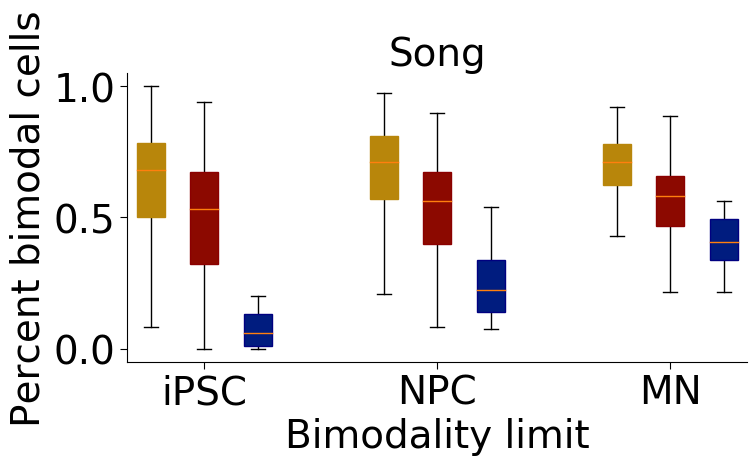

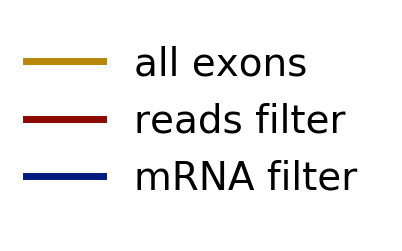

In [94]:
song_subpop_list = [song_clust_filter[0][0].columns, song_clust_filter[1][0].columns, song_clust_filter[2][0].columns]
process_bimodality_dset(song_PSI, song_subpop_list, ['iPSC', 'NPC', 'MN'], 
                        song_mrna_counts, mrna_per_event_song, song_read_counts, song_coverage_tab, 
                            'Song', psi_min = 0.2, mrna_min = 10, mrna_read_min=6, reads_min = 10, cell_min = 0.5, steps = 0.05)

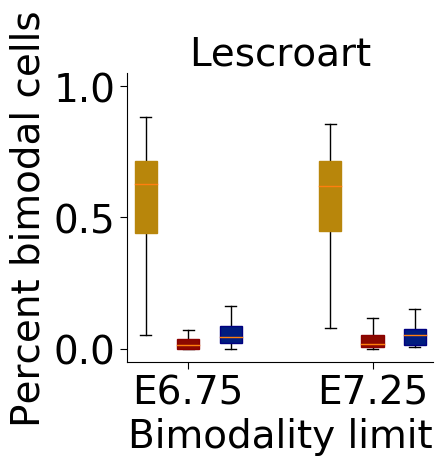

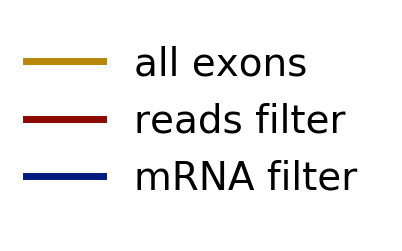

In [95]:
lescroart_subpop_list = [lescroart_E6, lescroart_E7]
process_bimodality_dset(lescroart_PSI, lescroart_subpop_list, ['E6.75', 'E7.25'], 
                        lescroart_mrna_counts, mrna_per_event_lescroart, lescroart_read_counts, lescroart_coverage_tab, 
                            'Lescroart', psi_min = 0.2, mrna_min = 10, mrna_read_min=6, reads_min = 10, cell_min = 0.5, steps = 0.05)

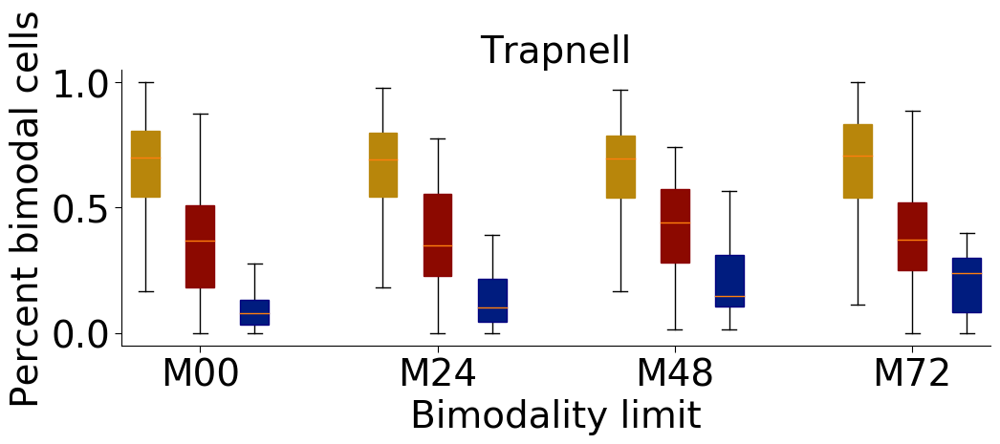

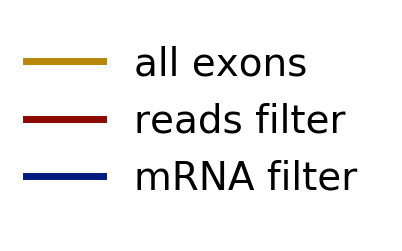

In [96]:
trapnell_subpop_list = [trapnell_clust_filter[0][0].columns, trapnell_clust_filter[1][0].columns, trapnell_clust_filter[2][0].columns,
                    trapnell_clust_filter[3][0].columns]
process_bimodality_dset(trapnell_PSI, trapnell_subpop_list, ['M00', 'M24', 'M48', 'M72'], 
                        trapnell_mrna_counts, mrna_per_event_trapnell, trapnell_read_counts, trapnell_coverage_tab, 
                            'Trapnell', psi_min = 0.2, mrna_min = 10, mrna_read_min=6, reads_min = 10, cell_min = 0.5, steps = 0.05)

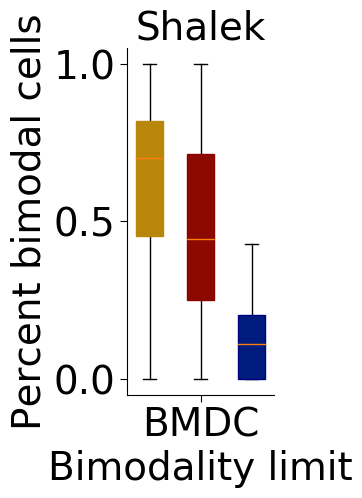

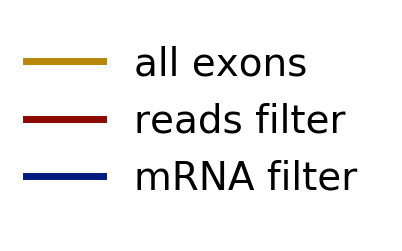

In [97]:
shalek_subpop_list = [shalek_PSI.columns]
process_bimodality_dset(shalek_PSI, shalek_subpop_list, ['BMDC'], 
                        shalek_mrna_counts, mrna_per_event_shalek, shalek_read_counts, shalek_coverage_tab, 
                            'Shalek', psi_min = 0.2, mrna_min = 10, mrna_read_min=6, reads_min = 10, cell_min = 0.5, steps = 0.05)

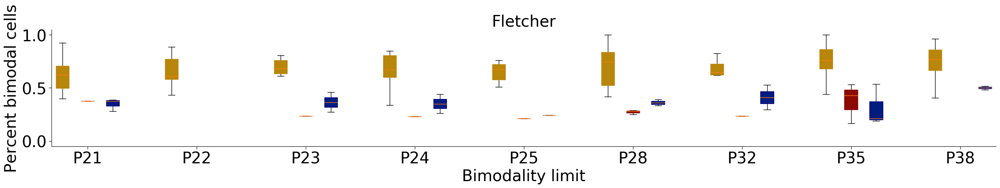

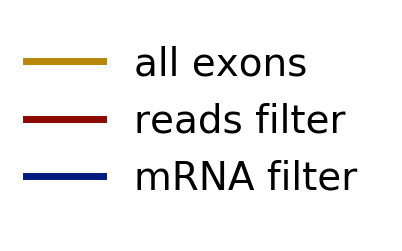

In [98]:
das_subpop = sorted(das_sra.age.unique())



das_subpop_list = [list(das_sra.index[das_sra.age == x]) for x in das_subpop]
process_bimodality_dset(das_PSI, das_subpop_list, das_subpop, 
                        das_mrna_counts, mrna_per_event_das, das_read_counts, das_coverage_tab, 
                            'Fletcher', psi_min = 0.2, mrna_min = 10, mrna_read_min=6, reads_min = 10, 
                        cell_min = 0.5, steps = 0.05)



# process_bimodality(das_PSI, das_sra.loc[das_sra.age == 'P21'].index, das_mrna_counts, mrna_per_event_das, das_read_counts, 
#                    das_coverage_tab, 
#                   'Fletcher')


#### Boxplots extended to different $\Psi$ cutoffs

Here we can compare the distribution of several filters at the same time. 

We also compare the reduction in percent of cells with extreme value ($x \leq \hat{\Psi} \leq (1-x)$) by removing individual observations from the selected exons.

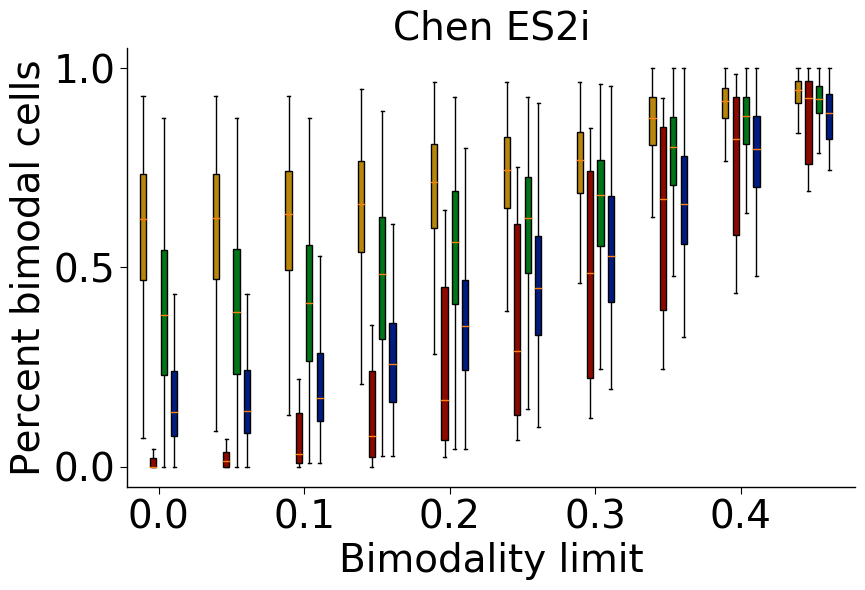

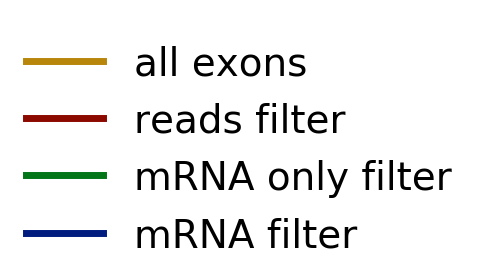

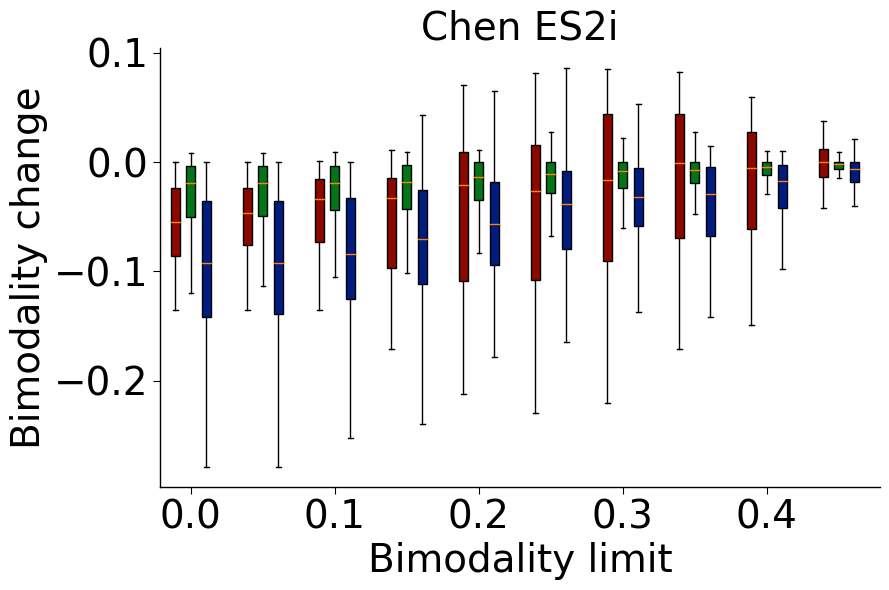

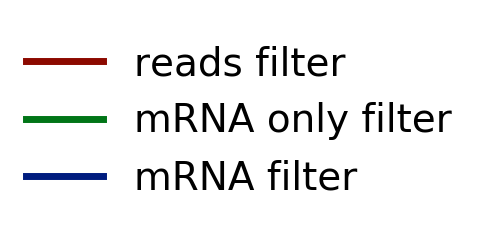

Median AUC in all exons: 0.3823335095137421

Median AUC in read selected exons: 0.19789719626168223
Change is significant with respect to all exons (adj pval = 9.496728483148755e-11)
Change is not significant with respect to all exons (adj pval = 0.5019153153059346)

Median AUC in mRNA only selected exons: 0.3265625
Change is significant with respect to all exons (adj pval = 1.1176458863842513e-18)
Filtering observations does not reduce AUC significantly (adj pval = 0.17963032614821517)

Median AUC in mRNA selected exons: 0.24166666666666664
Change is significant with respect to all exons (adj pval = 6.59617982712021e-35)
Filtering observations reduces AUC significantly (adj pval = 0.0024750673631839418)



In [54]:
process_bimodality(chen_PSI, chen_ES2i, chen_mrna_counts, mrna_per_event_chen, chen_read_counts, chen_coverage_tab, 
                  'Chen ES2i')

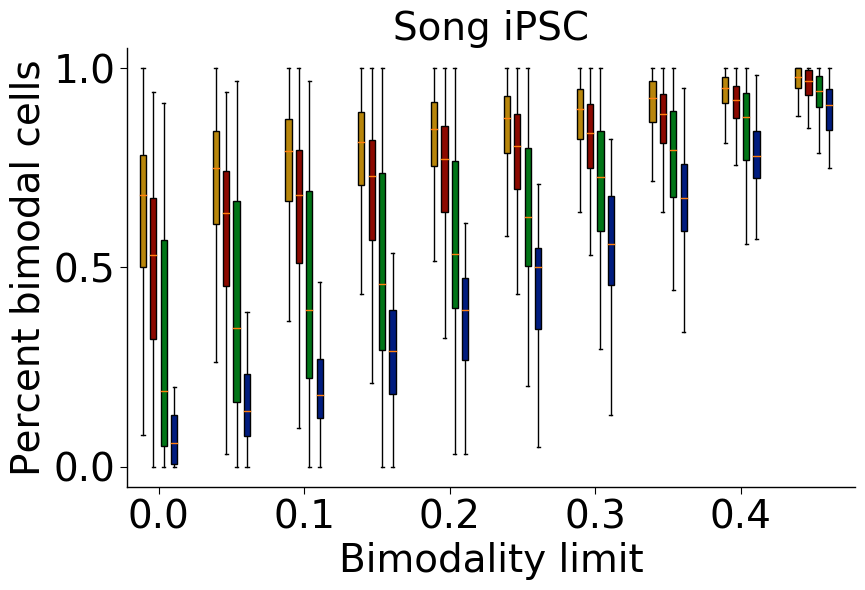

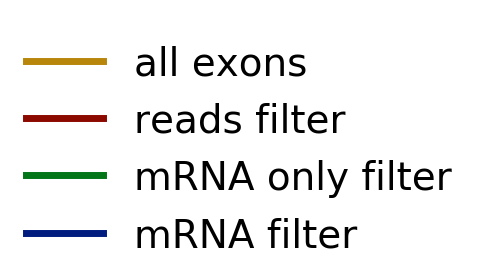

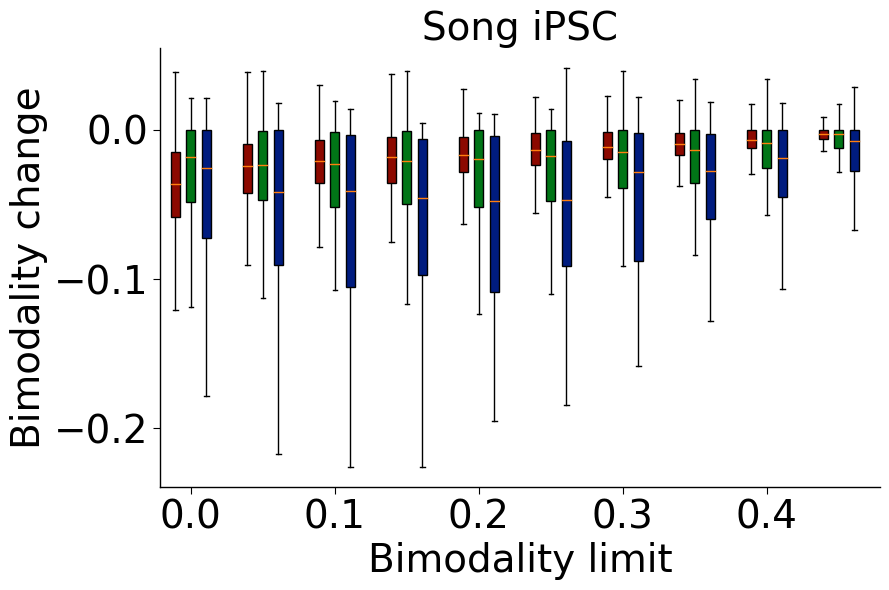

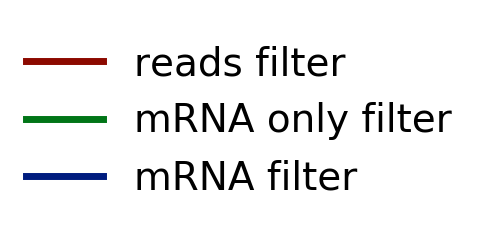

Median AUC in all exons: 0.4360435520361991

Median AUC in read selected exons: 0.40078125
Change is significant with respect to all exons (adj pval = 3.820701403188289e-17)
Filtering observations reduces AUC significantly (adj pval = 0.03548295472687173)

Median AUC in mRNA only selected exons: 0.30855562784645413
Change is significant with respect to all exons (adj pval = 3.3454218280034695e-25)
Filtering observations does not reduce AUC significantly (adj pval = 0.18767904827564164)

Median AUC in mRNA selected exons: 0.24655172413793103
Change is significant with respect to all exons (adj pval = 9.743951889843945e-29)
Filtering observations reduces AUC significantly (adj pval = 0.022266852681001544)



In [55]:
process_bimodality(song_PSI, song_iPSC, song_mrna_counts, mrna_per_event_song, song_read_counts, song_coverage_tab,
                  'Song iPSC')

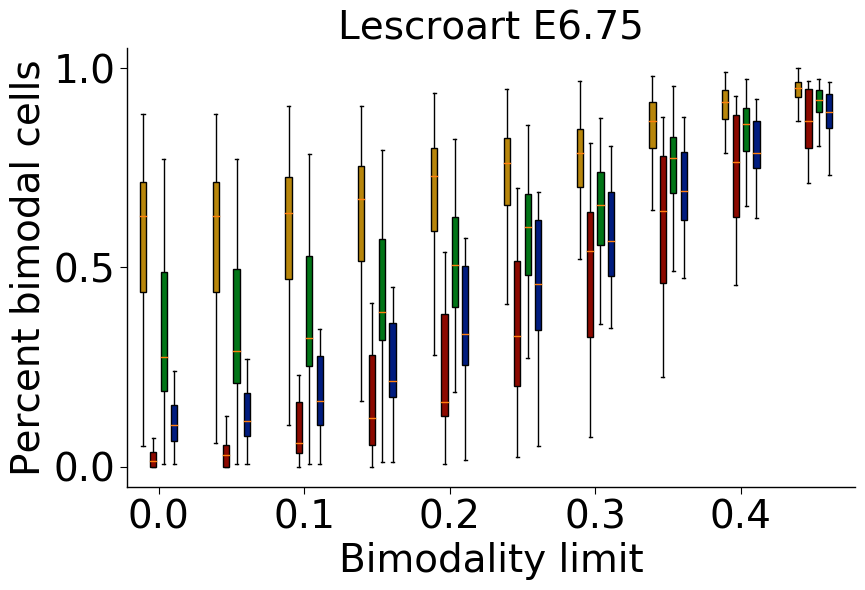

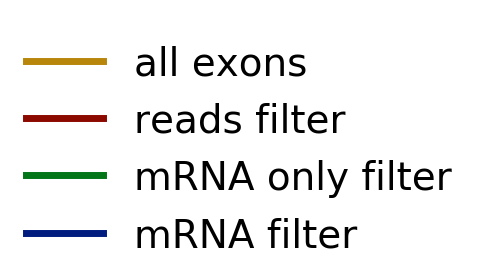

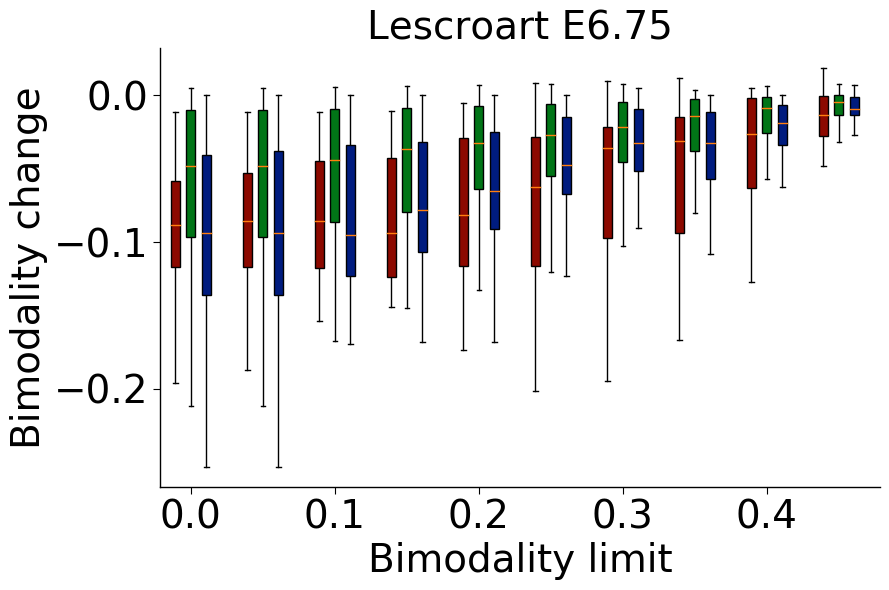

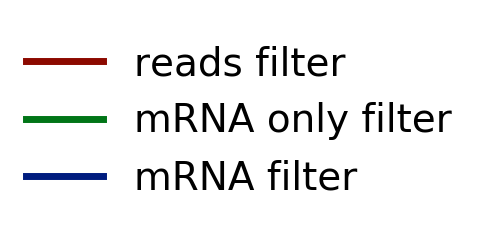

Median AUC in all exons: 0.38859784283513094

Median AUC in read selected exons: 0.21314102564102563
Change is significant with respect to all exons (adj pval = 2.239123433659191e-09)
Change is not significant with respect to all exons (adj pval = 0.17106923105635197)

Median AUC in mRNA only selected exons: 0.2964968152866242
Change is significant with respect to all exons (adj pval = 6.00578835594496e-17)
Filtering observations reduces AUC significantly (adj pval = 0.044315460797826195)

Median AUC in mRNA selected exons: 0.237
Change is significant with respect to all exons (adj pval = 1.9142554886490237e-16)
Filtering observations reduces AUC significantly (adj pval = 0.04042477418871652)



In [56]:
process_bimodality(lescroart_PSI, lescroart_E6, lescroart_mrna_counts, mrna_per_event_lescroart, 
                   lescroart_read_counts, lescroart_coverage_tab, 'Lescroart E6.75')

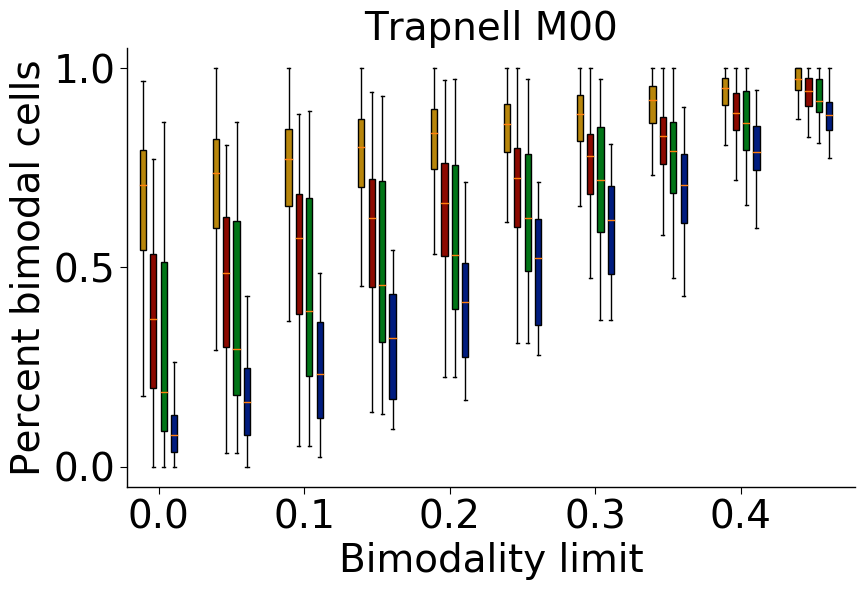

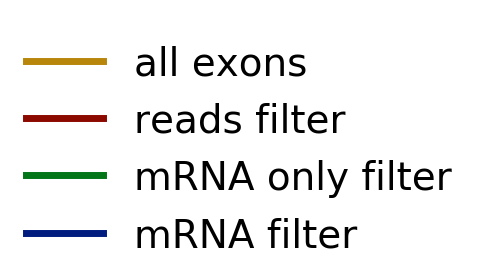

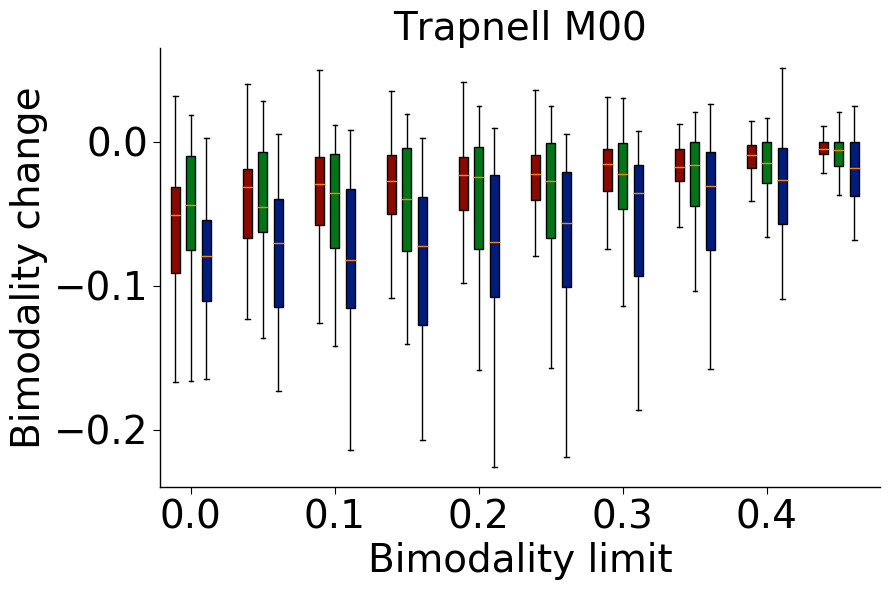

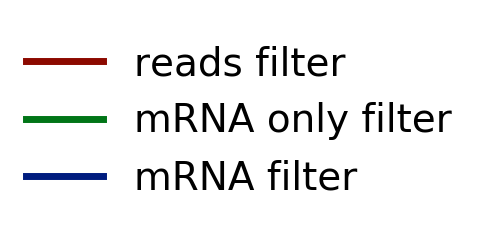

Median AUC in all exons: 0.4306189903846154

Median AUC in read selected exons: 0.3643965517241379
Change is significant with respect to all exons (adj pval = 5.226444434388957e-22)
Change is not significant with respect to all exons (adj pval = 0.08279150373189838)

Median AUC in mRNA only selected exons: 0.30830792682926833
Change is significant with respect to all exons (adj pval = 3.0055983502367337e-13)
Filtering observations does not reduce AUC significantly (adj pval = 0.22846053292672175)

Median AUC in mRNA selected exons: 0.26601874003189796
Change is significant with respect to all exons (adj pval = 2.532238860879113e-17)
Filtering observations reduces AUC significantly (adj pval = 0.026685958819416204)



In [57]:
process_bimodality(trapnell_PSI, trapnell_M00, trapnell_mrna_counts, mrna_per_event_trapnell, 
                   trapnell_read_counts, trapnell_coverage_tab, 'Trapnell M00')

ERROR:root:File `'bimodality_curves.py'` not found.


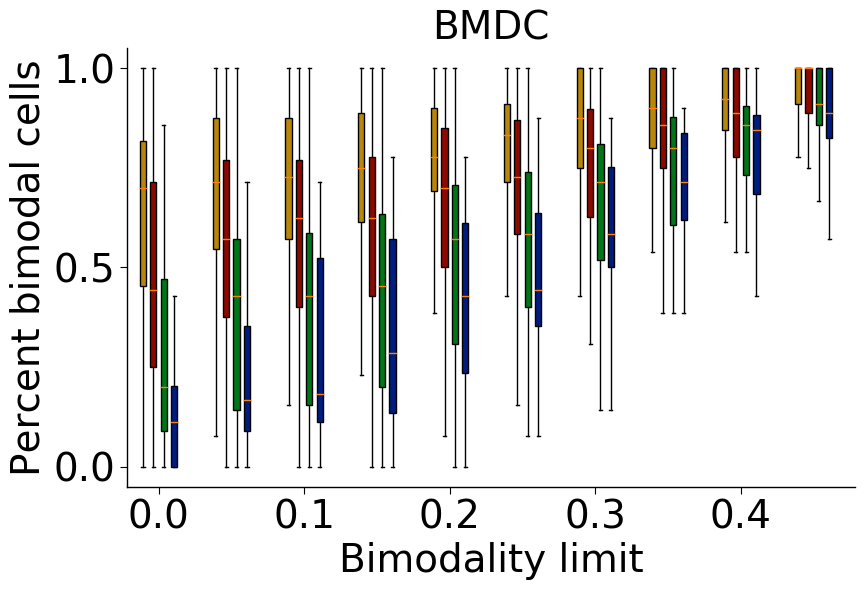

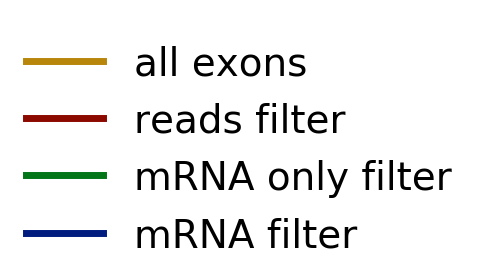

/home/cfbuenabadn/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:1020: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return getattr(section, self.name)[new_key]
/home/cfbuenabadn/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/cfbuenabadn/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/cfbuenabadn/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/cfbuenabadn/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:13

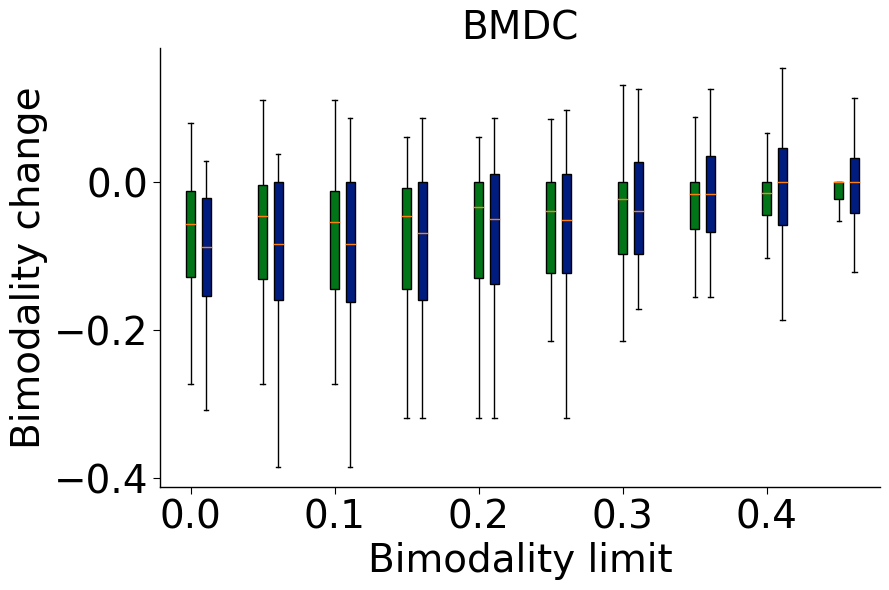

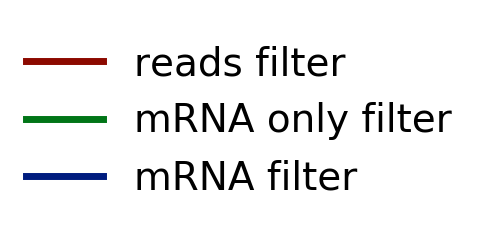

../../utils/bimodality_curves.py:228: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  auc_read_selected = get_auc(curves_all.loc[read_filtered.index])


Median AUC in all exons: 0.41428571428571426

Median AUC in read selected exons: 0.3738636363636364
Change is significant with respect to all exons (adj pval = 0.0011425190729832293)
Change is not significant with respect to all exons (adj pval = 0.30840577821004755)

Median AUC in mRNA only selected exons: 0.32142857142857145
Change is significant with respect to all exons (adj pval = 4.5023296922215744e-08)
Filtering observations does not reduce AUC significantly (adj pval = 0.25649189264423167)

Median AUC in mRNA selected exons: 0.2704545454545454
Change is significant with respect to all exons (adj pval = 7.638339478114633e-10)
Filtering observations does not reduce AUC significantly (adj pval = 0.2999185675514043)



In [58]:
process_bimodality(shalek_PSI, shalek_PSI.columns, shalek_mrna_counts, mrna_per_event_shalek, 
                   shalek_read_counts, shalek_coverage_tab, 'BMDC')

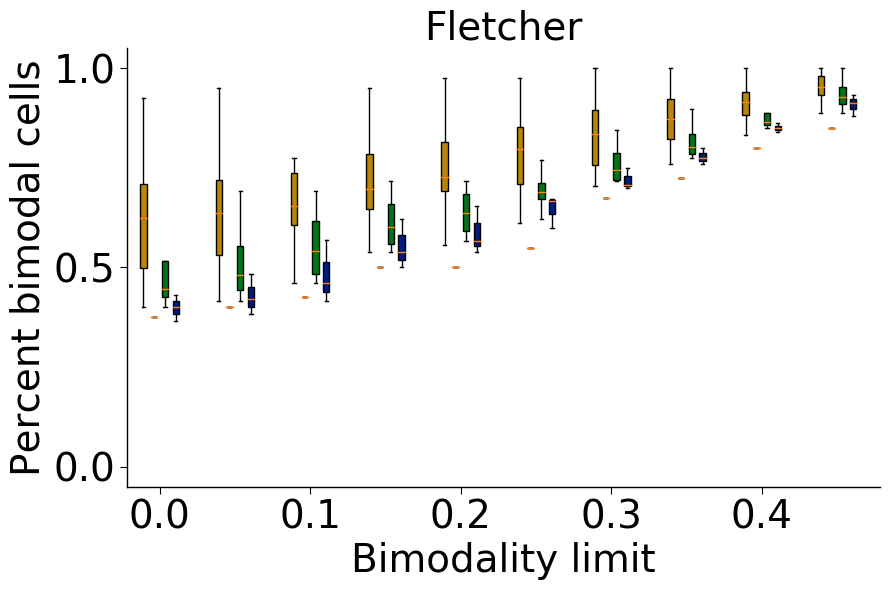

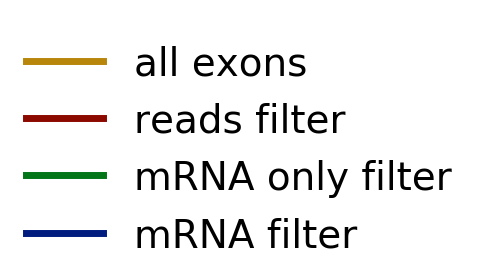

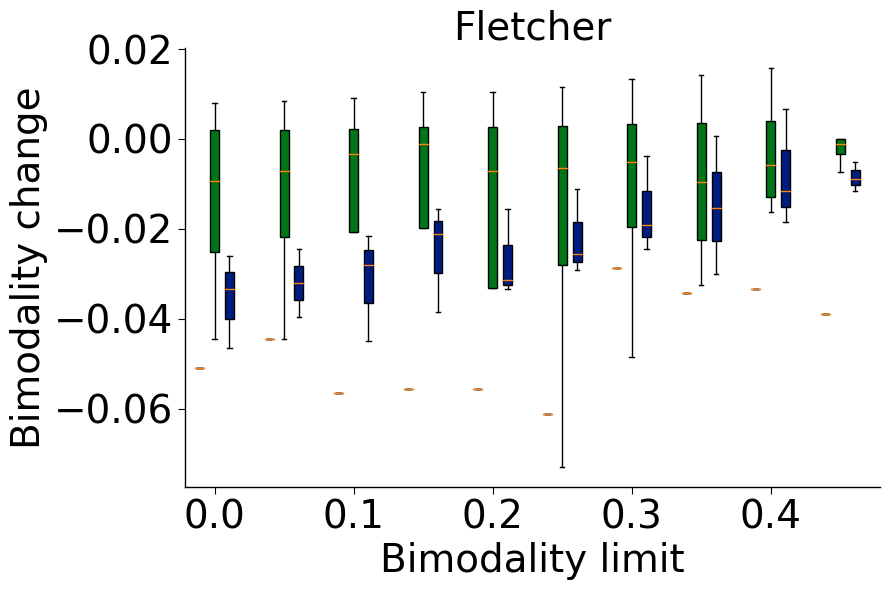

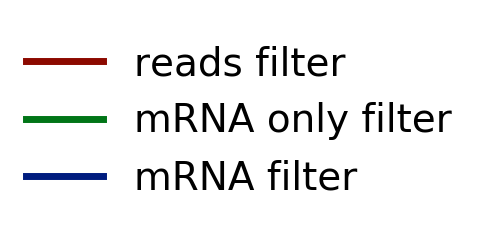

Median AUC in all exons: 0.3921853913630229

Median AUC in read selected exons: 0.30562500000000004
Change is not significant with respect to all exons (adj pval = 0.4051899171364144)
Change is not significant with respect to all exons (adj pval = 1.0)

Median AUC in mRNA only selected exons: 0.3478814627994956
Filtering observations does not reduce AUC significantly (adj pval = 0.4051899171364144)
Filtering observations does not reduce AUC significantly (adj pval = 1.0)

Median AUC in mRNA selected exons: 0.3275
Change is not significant with respect to all exons (adj pval = 0.31147778961010963)
Filtering observations does not reduce AUC significantly (adj pval = 0.9937808753100864)



In [59]:
process_bimodality(das_PSI, das_sra.loc[das_sra.age == 'P21'].index, das_mrna_counts, mrna_per_event_das, das_read_counts, 
                   das_coverage_tab, 
                  'Fletcher')


### Figure 3j: Filtered observations for some selected exons

Some examples of exons that pass the minimum mRNA filter. Individual observations with at least 10 mRNA molecules (and reads expected from 10 mRNA molecules) are shown in color. Individual observations with fewer than 10 mRNA reads are shown in gray.

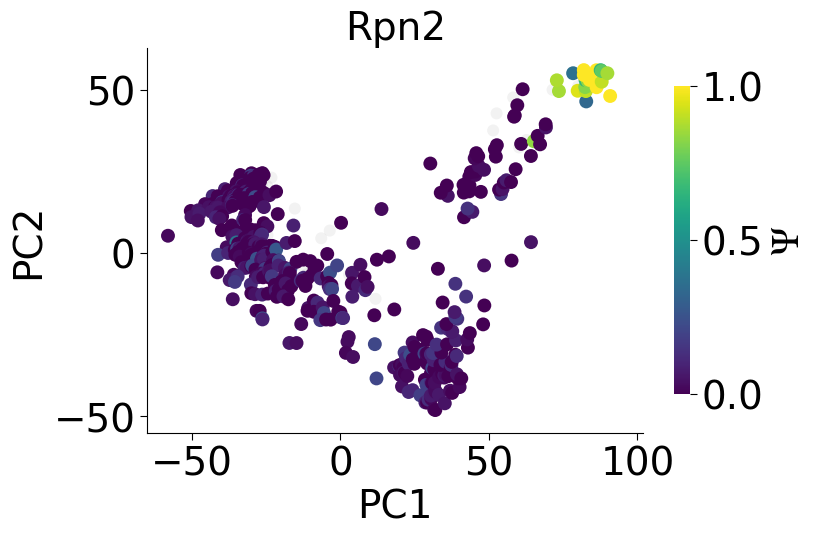

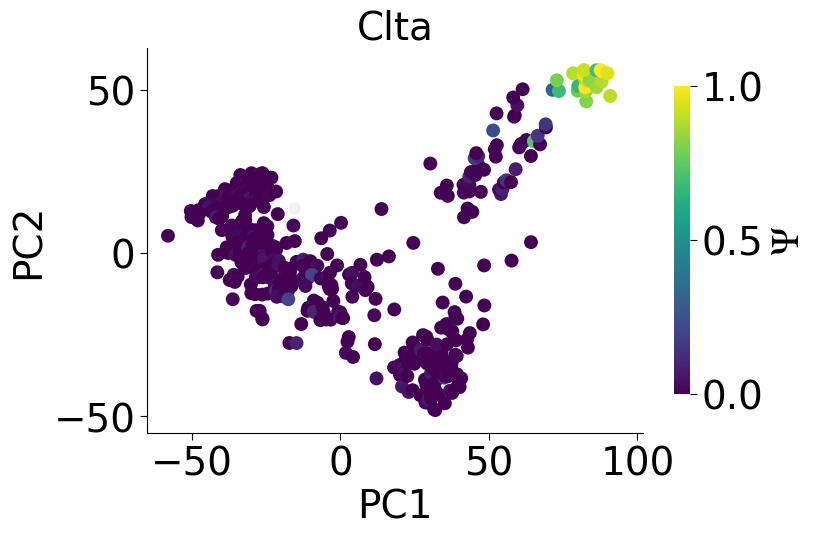

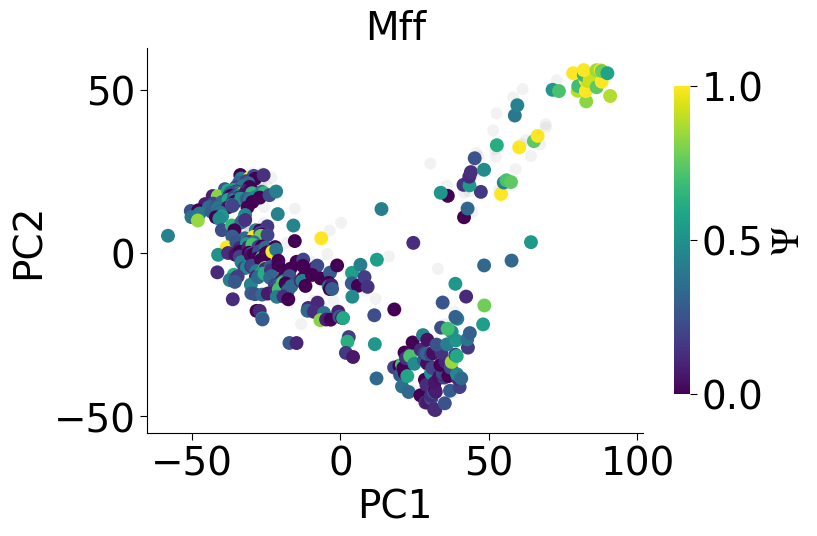

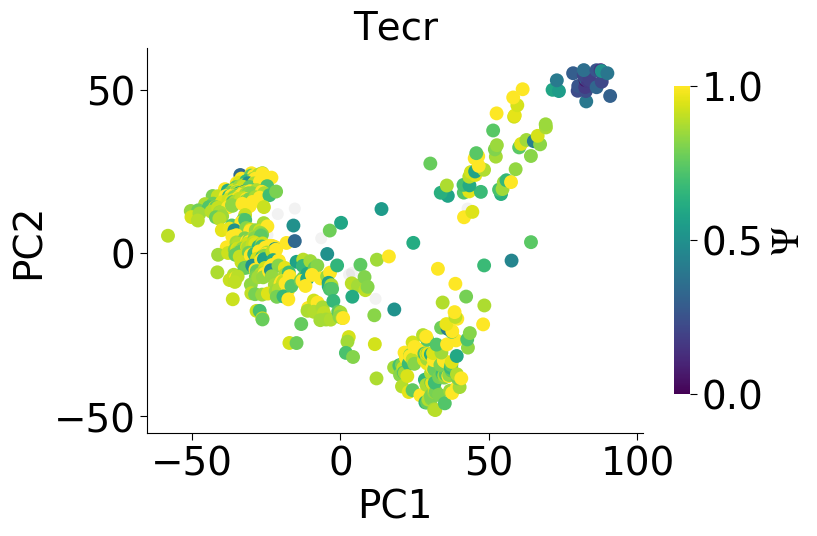

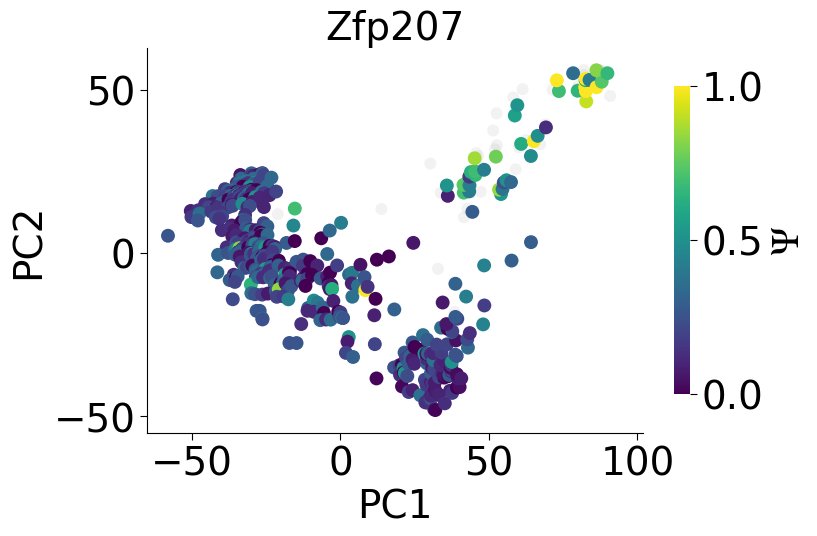

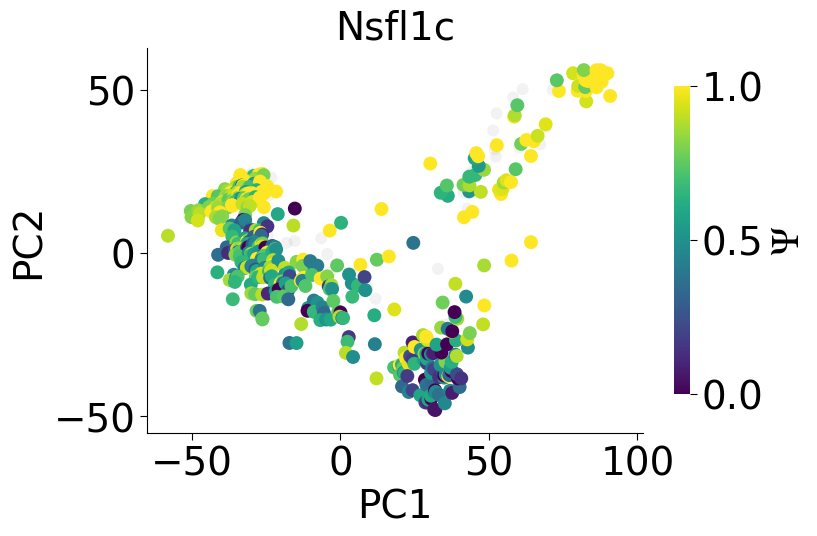

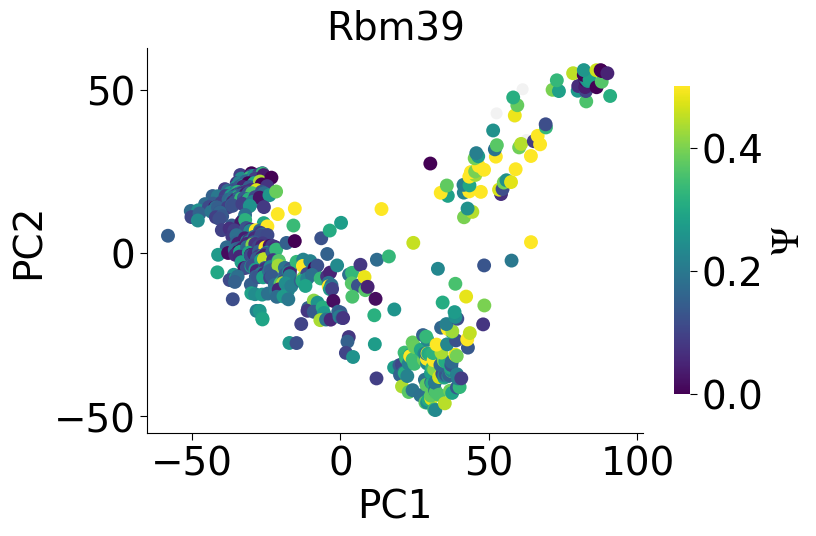

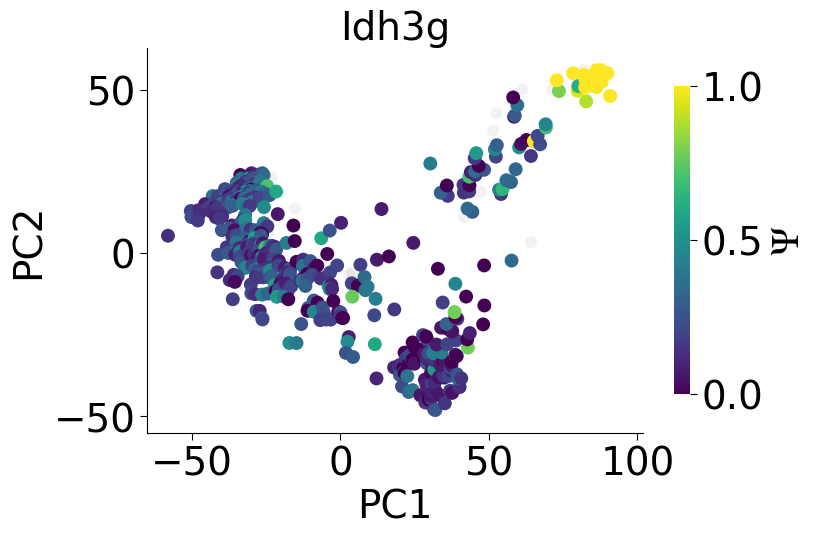

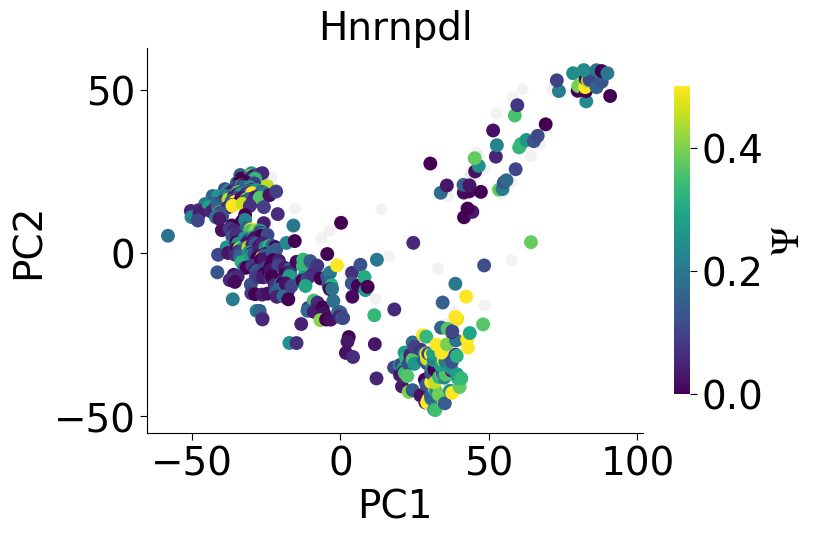

In [102]:
scp.plot_pca(chen_pca, chen_PSI, mrna_per_event_chen, chen_read_counts, chen_coverage_tab['SJ_coverage'], 
         'Rpn2_1', 10, plot_dir = 'plots_review/figure3/events/', filter_cells=True)
scp.plot_pca(chen_pca, chen_PSI, mrna_per_event_chen, chen_read_counts, chen_coverage_tab['SJ_coverage'], 
         'Clta_4', 10, plot_dir = 'plots_review/figure3/events/', filter_cells=True)
scp.plot_pca(chen_pca, chen_PSI, mrna_per_event_chen, chen_read_counts, chen_coverage_tab['SJ_coverage'], 
         'Mff_3', 10, plot_dir = 'plots_review/figure3/events/', filter_cells=True)
scp.plot_pca(chen_pca, chen_PSI, mrna_per_event_chen, chen_read_counts, chen_coverage_tab['SJ_coverage'], 
         'Tecr_4', 10, plot_dir = 'plots_review/figure3/events/', filter_cells=True)
scp.plot_pca(chen_pca, chen_PSI, mrna_per_event_chen, chen_read_counts, chen_coverage_tab['SJ_coverage'], 
         'Zfp207_1', 10, plot_dir = 'plots_review/figure3/events/', filter_cells=True)
scp.plot_pca(chen_pca, chen_PSI, mrna_per_event_chen, chen_read_counts, chen_coverage_tab['SJ_coverage'], 
         'Nsfl1c_2', 10, plot_dir = 'plots_review/figure3/events/', filter_cells=True)
scp.plot_pca(chen_pca, chen_PSI, mrna_per_event_chen, chen_read_counts, chen_coverage_tab['SJ_coverage'], 
         'Rbm39_nmdSE_2', 10, plot_dir = 'plots_review/figure3/events/', vmax=0.5, filter_cells=True)
scp.plot_pca(chen_pca, chen_PSI, mrna_per_event_chen, chen_read_counts, chen_coverage_tab['SJ_coverage'], 
         'Idh3g_1', 10, plot_dir = 'plots_review/figure3/events/', filter_cells=True)
scp.plot_pca(chen_pca, chen_PSI, mrna_per_event_chen, chen_read_counts, chen_coverage_tab['SJ_coverage'], 
         'Hnrnpdl_nmdSE_1', 10, plot_dir = 'plots_review/figure3/events/', vmax=0.5, filter_cells=True)


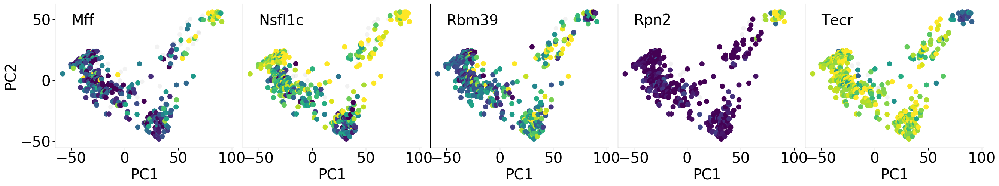

In [109]:
def plot_exon(ax, PSI_tab, pca_tab, event, vmin=0, vmax=1):
    
    ax.scatter(pca_tab.PC1, pca_tab.PC2, c='gray', s=75, edgecolors='none', alpha=0.1)
    sc = ax.scatter(pca_tab.PC1, pca_tab.PC2, 
                c=PSI_tab.loc[event], s=100, edgecolors='none', vmin=vmin, vmax=vmax, cmap=cm.viridis)
    
    ax.tick_params(labelsize=28, length=5)    
    ax.set_xlabel('PC1', fontsize=28)
    ax.tick_params(labelsize=28, length=5)
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.set_xlim([-65, 102])
    ax.set_ylim([-55, 63])
    
    
chen_filtered = filter_psi(chen_PSI, chen_int_exons, mrna_per_event_chen, chen_coverage_tab['SJ_coverage'], 
                           chen_read_counts, 10, 0, cell_min=0.5)
    
    
figsize(32, 5)
fig = plt.figure()

gs = GridSpec(1,5)
gs.update(wspace=0.05, hspace=1.05)

ax_1 = fig.add_subplot(gs[0,0])
ax_2 = fig.add_subplot(gs[0,1])
ax_3 = fig.add_subplot(gs[0,2])
ax_4 = fig.add_subplot(gs[0,3])
ax_5 = fig.add_subplot(gs[0,4])

plot_exon(ax_1, chen_filtered[0], chen_pca_clust, 'Mff_3', vmin=0, vmax=1)
plot_exon(ax_2, chen_filtered[0], chen_pca_clust, 'Nsfl1c_2', vmin=0, vmax=1)
plot_exon(ax_3, chen_filtered[0], chen_pca_clust, 'Rbm39_nmdSE_2', vmin=0, vmax=0.5)
plot_exon(ax_4, chen_filtered[0], chen_pca_clust, 'Rpn2_1', vmin=0, vmax=1)
plot_exon(ax_5, chen_filtered[0], chen_pca_clust, 'Tecr_4', vmin=0, vmax=1)

plt.setp(ax_2.get_yticklabels(), visible=False)
plt.setp(ax_3.get_yticklabels(), visible=False)
plt.setp(ax_4.get_yticklabels(), visible=False)
plt.setp(ax_5.get_yticklabels(), visible=False)

ax_2.yaxis.set_ticks_position('none')
ax_3.yaxis.set_ticks_position('none')
ax_4.yaxis.set_ticks_position('none')
ax_5.yaxis.set_ticks_position('none')

ax_1.text(-50, 55, 'Mff', fontsize=28, verticalalignment='top')
ax_2.text(-50, 55, 'Nsfl1c', fontsize=28, verticalalignment='top')
ax_3.text(-50, 55, 'Rbm39', fontsize=28, verticalalignment='top')
ax_4.text(-50, 55, 'Rpn2', fontsize=28, verticalalignment='top')
ax_5.text(-50, 55, 'Tecr', fontsize=28, verticalalignment='top')
ax_1.set_ylabel('PC2', fontsize = 28)

plt.savefig('plots_review/figure3/events/examples_2.svg', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/events/examples_2.pdf', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/events/examples_2.png', dpi=300, bbox_inches='tight', transparent=True)

plt.show()

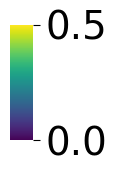

In [64]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
mpl.rcParams["mathtext.fontset"] = "stix"
mpl.rcParams['pdf.fonttype'] = 42

figsize(0.3, 1.5)
fig = plt.figure()
ax  = plt.subplot(1,1,1)

axins1 = inset_axes(ax,
                    width="100%",  # width = 50% of parent_bbox width
                    height="100%",  # height : 5%
                    loc='right')

sc = ax.scatter([0, 0], [0, 0], c = [0, 1], s=1, edgecolors='none', vmin=0, vmax=0.5, cmap=cm.viridis)


ax.tick_params(labelsize=28, length=5)

cb = fig.colorbar(sc, cax = axins1, ticks=[0, 0.5, 1])
cb.ax.tick_params(labelsize=28, length=5)
cb.outline.set_visible(False)
ax.spines["bottom"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)

plt.setp(ax.get_yticklabels(), visible=False)
ax.yaxis.set_ticks_position('none')
plt.setp(ax.get_xticklabels(), visible=False)
ax.xaxis.set_ticks_position('none')

cb.outline.set_visible(False)

plt.savefig('plots_review/figure3/events/colorbar_05.svg', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/events/colorbar_05.pdf', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/events/colorbar_05.png', dpi=300, bbox_inches='tight', transparent=True)

plt.show()

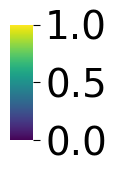

In [65]:
figsize(0.3, 1.5)
fig = plt.figure()
ax  = plt.subplot(1,1,1)

axins1 = inset_axes(ax,
                    width="100%",  # width = 50% of parent_bbox width
                    height="100%",  # height : 5%
                    loc='right')

sc = ax.scatter([0, 0], [0, 0], c = [0, 1], s=1, edgecolors='none', vmin=0, vmax=1, cmap=cm.viridis)

ax.tick_params(labelsize=28, length=5)

cb = fig.colorbar(sc, cax = axins1, ticks=[0, 0.5, 1])
cb.ax.tick_params(labelsize=28, length=5)
cb.outline.set_visible(False)
ax.spines["bottom"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)

plt.setp(ax.get_yticklabels(), visible=False)
ax.yaxis.set_ticks_position('none')
plt.setp(ax.get_xticklabels(), visible=False)
ax.xaxis.set_ticks_position('none')

cb.outline.set_visible(False)

plt.savefig('plots_review/figure3/events/colorbar.svg', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/events/colorbar.pdf', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/events/colorbar.png', dpi=300, bbox_inches='tight', transparent=True)

plt.show()


### Supplementary Figure 5: violinplots of observed $\hat{\Psi}$ per cluster

Before and after filtering. Many exons do not change much because they have plenty of observations with more than 10 mRNAs.

In [142]:
def plot_violins(PSI_tab, PSI_filtered, exon, plot_name = ''):
    figsize(7, 5)
    fig = plt.figure()
    ax  = plt.subplot(1,1,1)
    sns.violinplot(data=[PSI_tab.loc[exon, [x for x in chen_pca_clust.index[chen_pca_clust.AC==0] if x in PSI_tab.columns]].dropna(),
                   PSI_tab.loc[exon, [x for x in chen_pca_clust.index[chen_pca_clust.AC==1] if x in PSI_tab.columns]].dropna(),
                   PSI_tab.loc[exon, [x for x in chen_pca_clust.index[chen_pca_clust.AC==2] if x in PSI_tab.columns]].dropna(),
                   PSI_tab.loc[exon, [x for x in chen_pca_clust.index[chen_pca_clust.AC==3] if x in PSI_tab.columns]].dropna(),
                   PSI_tab.loc[exon, [x for x in chen_pca_clust.index[chen_pca_clust.AC==4] if x in PSI_tab.columns]].dropna()], 
                   cut=0, color='skyblue', scale='width', ax=ax)
    ax.tick_params(labelsize=28, length=5)
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    plt.ylabel('$\Psi$', fontsize=28)
    plt.xlabel('Cell cluster', fontsize=28)
    plt.xticks([0, 1, 2, 3, 4], ['ES', 'Epi1', 'Epi2', 'N1', 'N2'])
    
    if len(plot_name) == 0:
        plot_name = exon
    
    unfilt_name = 'plots_review/figure3/events/{plot_name}_unfiltered_violinplots'.format(plot_name=plot_name)
    plt.savefig(unfilt_name + '.pdf', bbox_inches='tight', transparent=True)
    plt.savefig(unfilt_name + '.png', bbox_inches='tight', transparent=True)
    plt.show()
    
    figsize(7, 5)
    fig = plt.figure()
    ax  = plt.subplot(1,1,1)
    sns.violinplot(data=[PSI_filtered.loc[exon, [x for x in chen_pca_clust.index[chen_pca_clust.AC==0] if x in PSI_tab.columns]].dropna(),
                   PSI_filtered.loc[exon, [x for x in chen_pca_clust.index[chen_pca_clust.AC==1] if x in PSI_tab.columns]].dropna(),
                   PSI_filtered.loc[exon, [x for x in chen_pca_clust.index[chen_pca_clust.AC==2] if x in PSI_tab.columns]].dropna(),
                   PSI_filtered.loc[exon, [x for x in chen_pca_clust.index[chen_pca_clust.AC==3] if x in PSI_tab.columns]].dropna(),
                   PSI_filtered.loc[exon, [x for x in chen_pca_clust.index[chen_pca_clust.AC==4] if x in PSI_tab.columns]].dropna()], 
                   cut=0, color='skyblue', scale='width', ax=ax)
    ax.tick_params(labelsize=28, length=5)
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    plt.ylabel('$\Psi$', fontsize=28)
    plt.xlabel('Cell cluster', fontsize=28)
    plt.xticks([0, 1, 2, 3, 4], ['ES', 'Epi1', 'Epi2', 'N1', 'N2'])
    
    if len(plot_name) == 0:
        plot_name = exon
    
    filt_name = 'plots_review/figure3/events/{plot_name}_filtered_violinplots'.format(plot_name=plot_name)
    plt.savefig(filt_name + '.pdf', bbox_inches='tight', transparent=True)
    plt.savefig(filt_name + '.png', bbox_inches='tight', transparent=True)
    
    

In [143]:
# chen_filtered_lax = filter_psi(chen_PSI, chen_int_exons, mrna_per_event_chen, chen_coverage_tab['SJ_coverage'], 
#                            chen_read_counts, 10, 0, cell_min=0.1)

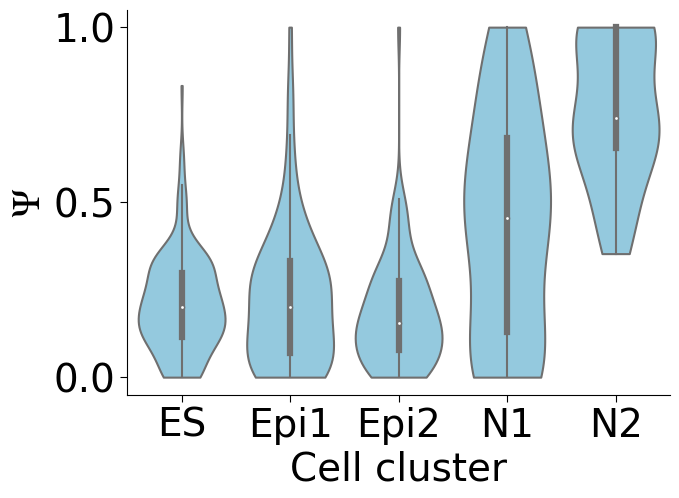

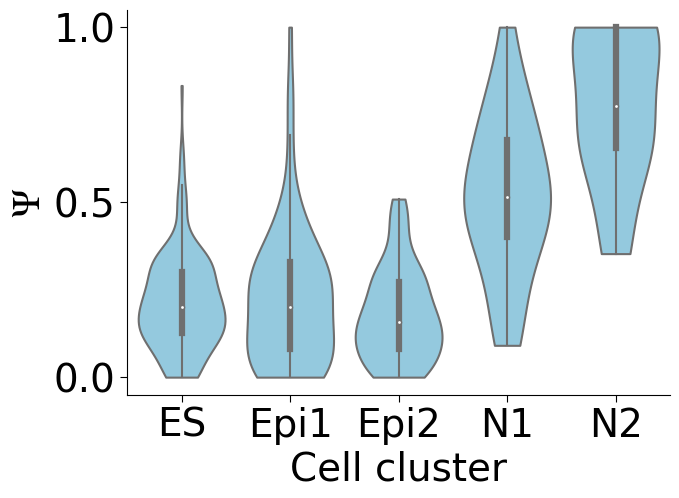

In [144]:
plot_violins(chen_PSI, chen_filtered_lax[0],'Zfp207_1')

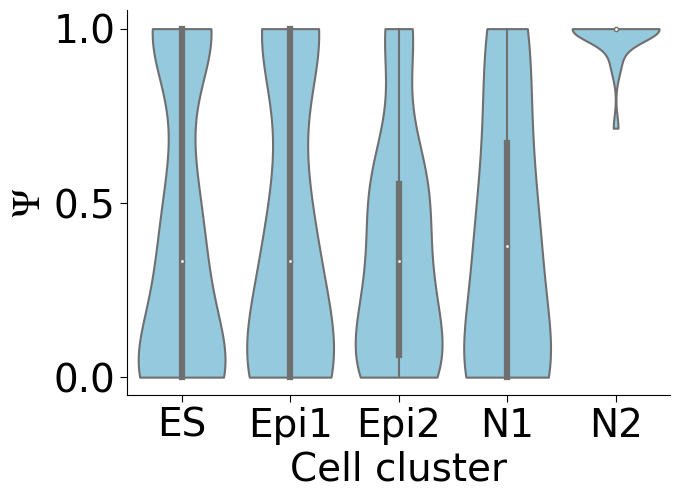

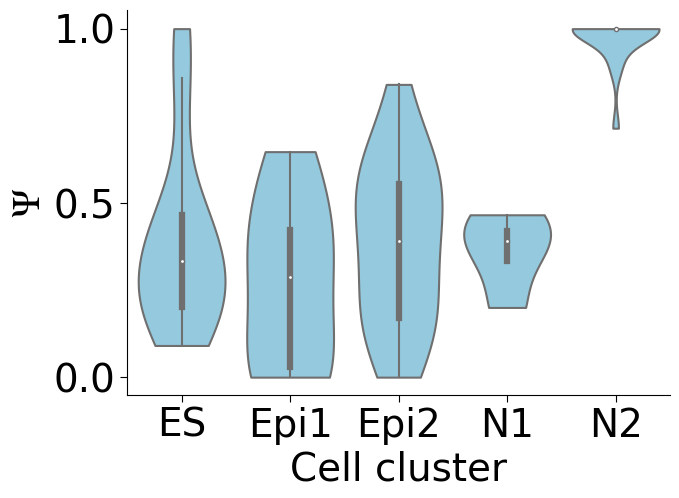

In [145]:
plot_violins(chen_PSI, chen_filtered_lax[0],'Cadm1_2')

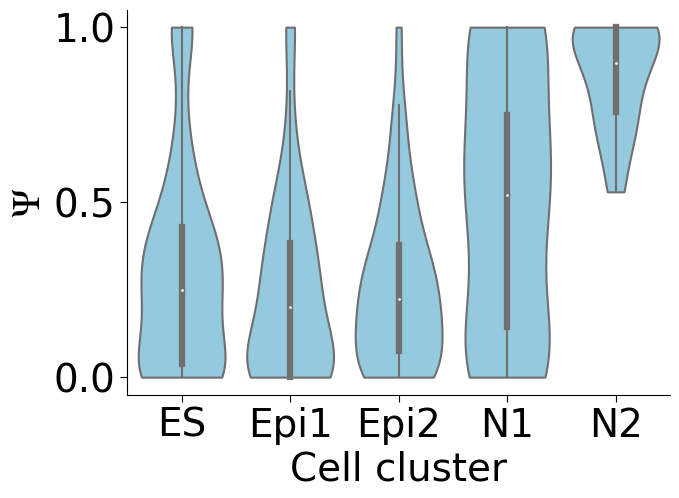

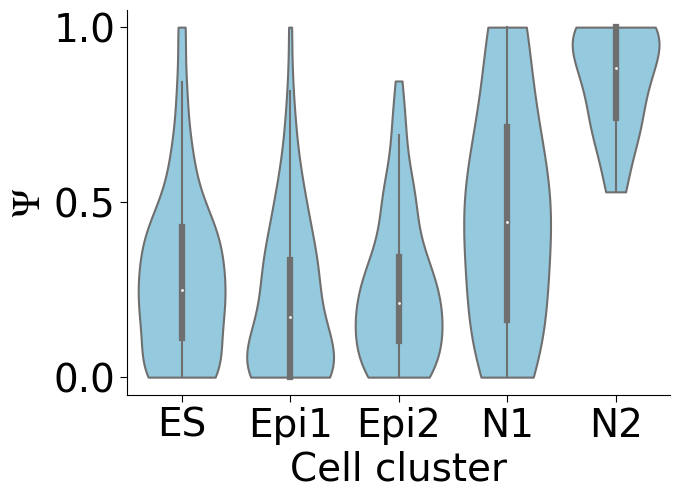

In [146]:
plot_violins(chen_PSI, chen_filtered_lax[0],'Mff_3')

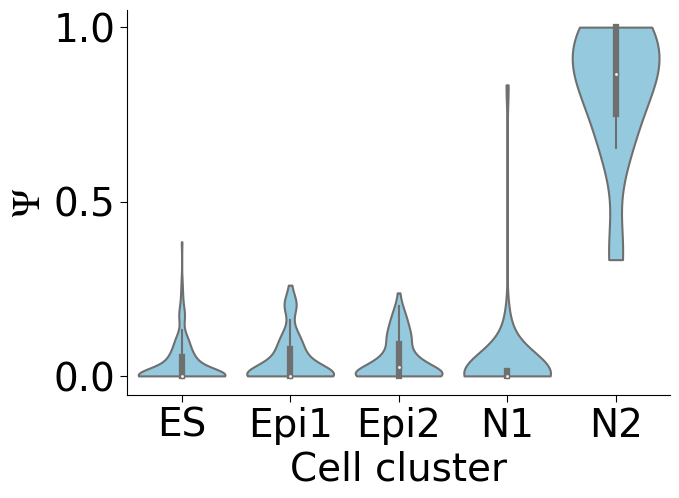

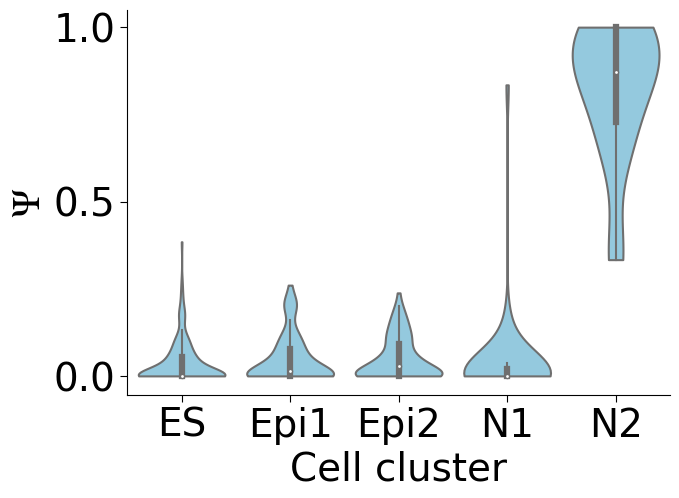

In [147]:
plot_violins(chen_PSI, chen_filtered_lax[0],'Rpn2_1')

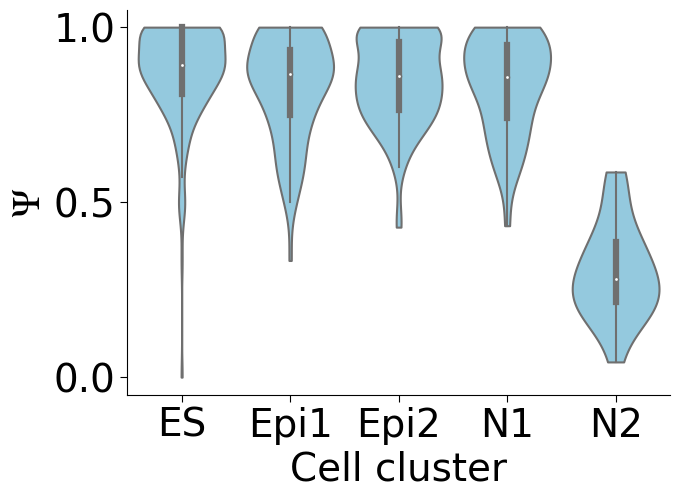

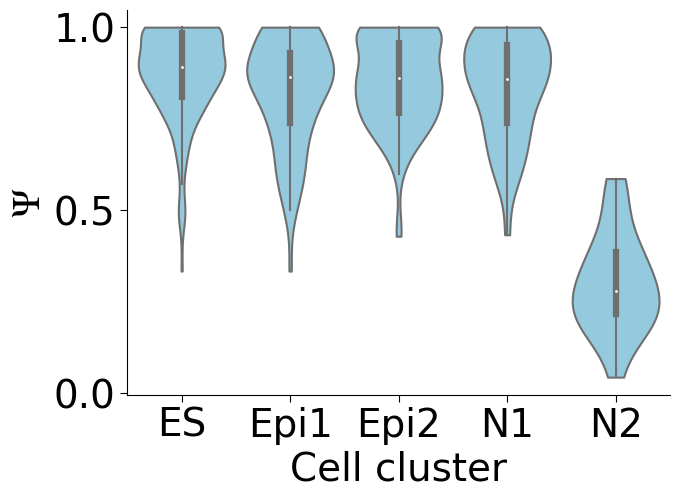

In [148]:
plot_violins(chen_PSI, chen_filtered_lax[0],'Tecr_4')

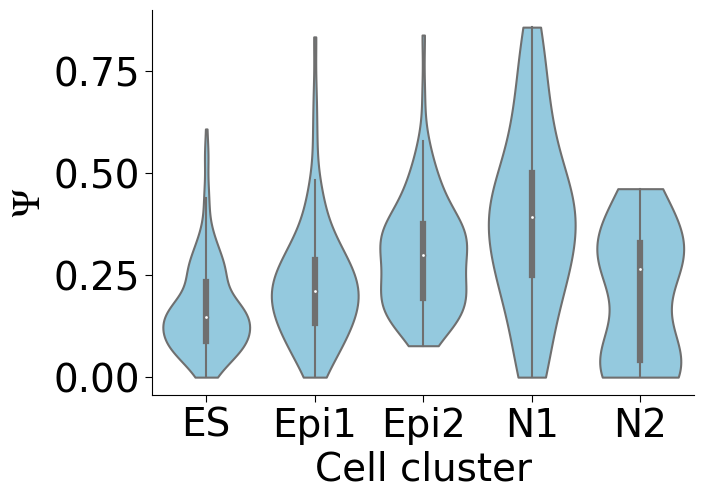

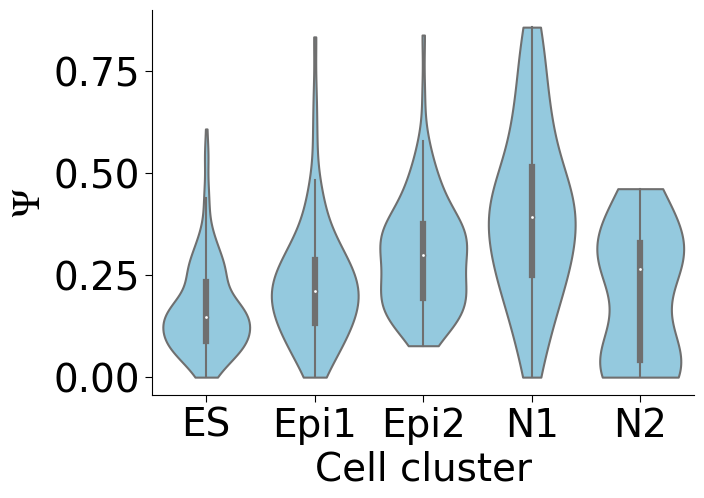

In [149]:
plot_violins(chen_PSI, chen_filtered_lax[0],'Rbm39_nmdSE_2')

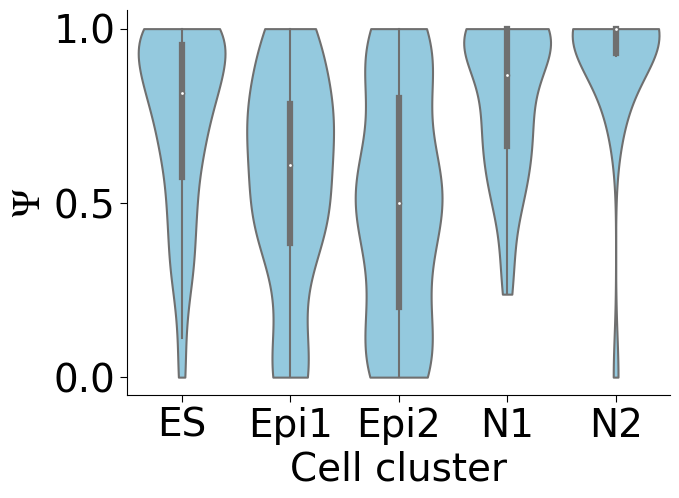

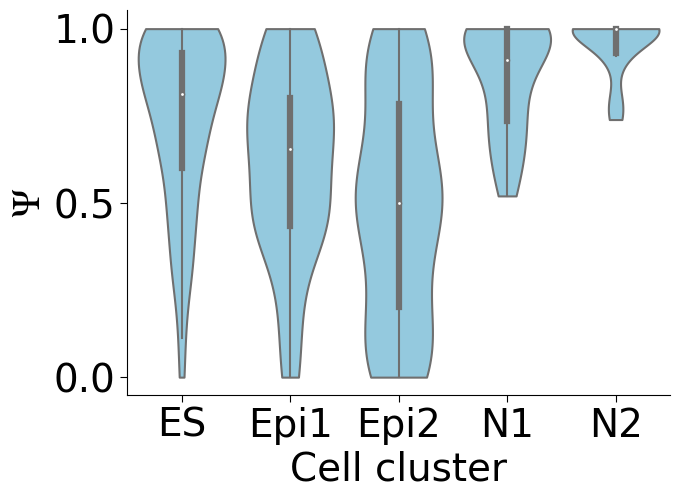

In [150]:
plot_violins(chen_PSI, chen_filtered_lax[0],'Nsfl1c_2')

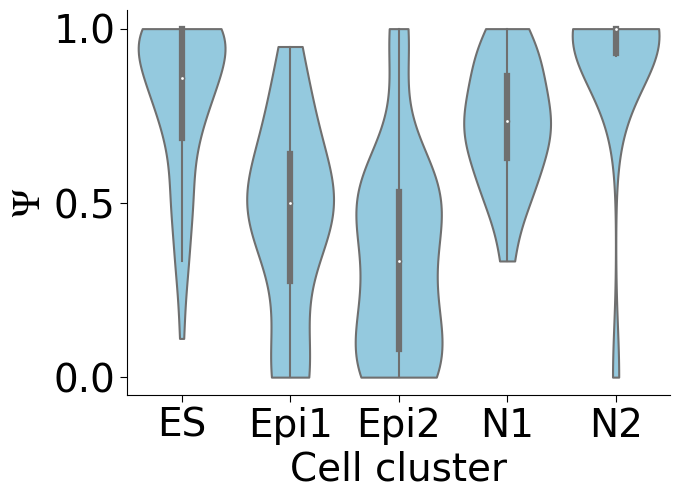

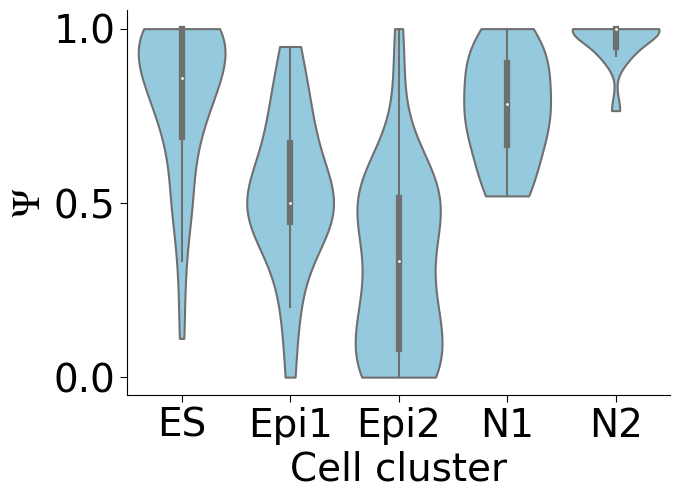

In [151]:
plot_violins(chen_PSI[chen_pca_clust.index[chen_pca_clust.sex == 'male']], 
             chen_filtered_lax[0][chen_pca_clust.index[chen_pca_clust.sex == 'male']], 'Nsfl1c_2', plot_name='Nsfl1c_2_male')

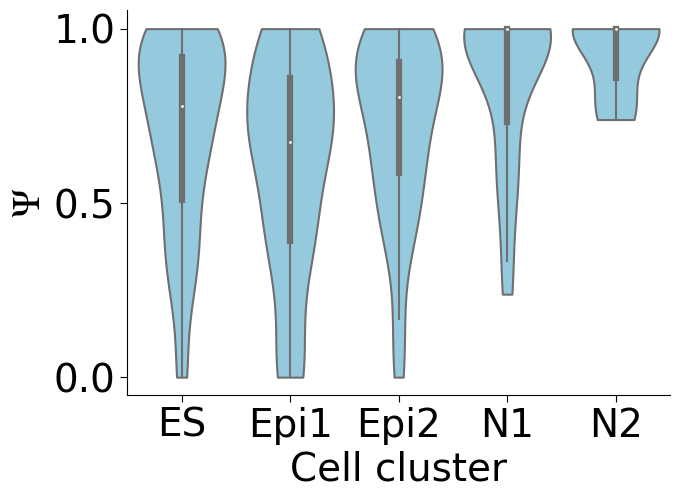

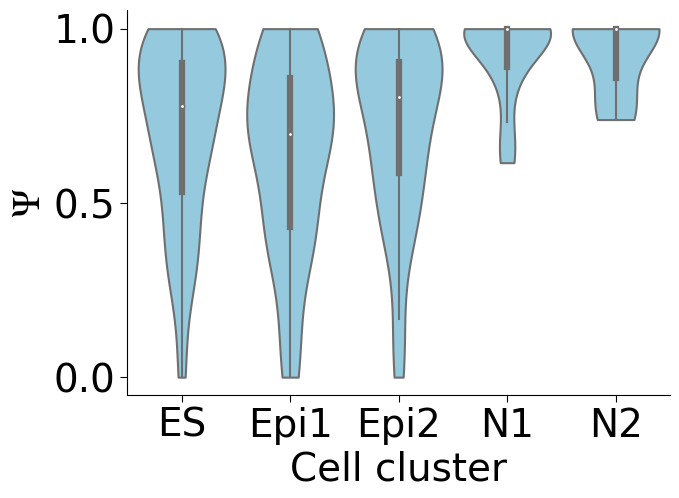

In [152]:
plot_violins(chen_PSI[chen_pca_clust.index[chen_pca_clust.sex == 'female']], 
             chen_filtered_lax[0][chen_pca_clust.index[chen_pca_clust.sex == 'female']], 'Nsfl1c_2', plot_name='Nsfl1c_2_female')

### Supp Figure 5: pseudotime vs $\Psi$

In [76]:
def plot_scatter(PSI_tab, PSI_filtered, pca, exon, plot_name = '', deg=4, alph=0.75):

    figsize(7, 5)
    fig = plt.figure()
    ax  = plt.subplot(1,1,1)


    idx = PSI_filtered.loc[exon].dropna().index
    psi_idx = PSI_filtered[idx].loc[exon].dropna()

    fx = np.poly1d(np.polyfit(pca.loc[idx].pseudotime, psi_idx, deg))
    
    uidx = PSI_tab.loc[exon].dropna().index
    upsi_idx = PSI_tab[uidx].loc[exon].dropna()
    
    ax.scatter(pca.loc[uidx].pseudotime, upsi_idx, c='skyblue', alpha=alph, edgecolor=None, linewidth=0)
    
    
    x = ax.scatter(pca.loc[idx].pseudotime, psi_idx, c='navy', edgecolor=None, linewidth=0)
    ax.plot(range(int(np.ceil(np.max(pca.loc[idx].pseudotime)))), 
             fx(range(int(np.ceil(np.max(pca.loc[idx].pseudotime))))), c='red',linewidth=1)
    plt.xlabel('Pseudotime', fontsize=28)
    plt.ylabel('$\Psi$', fontsize=28)
    ax.tick_params(labelsize=28, length=5)
    #plt.colorbar(x)
    if len(plot_name) == 0:
        plot_name = exon


#     plt.title(plot_name)


    ax.tick_params(labelsize=28, length=5)
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)


    filt_name = 'plots_review/figure3/events/{plot_name}_scatter_plot'.format(plot_name=plot_name)
    plt.savefig(filt_name + '.pdf', bbox_inches='tight', transparent=True)
    plt.savefig(filt_name + '.png', bbox_inches='tight', transparent=True)

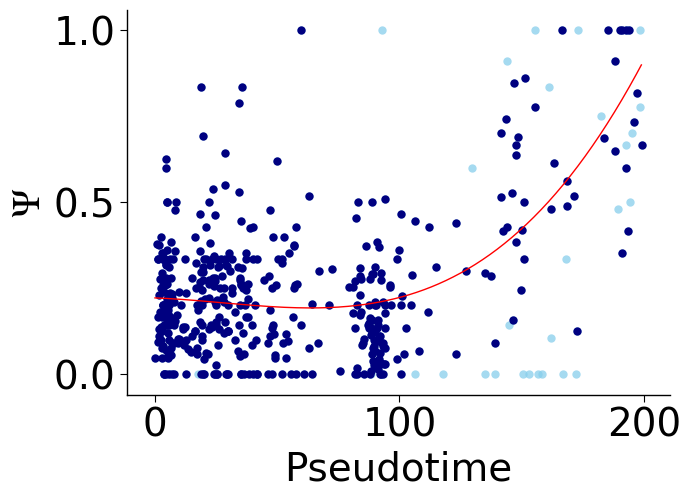

In [77]:
plot_scatter(chen_PSI, chen_filtered_lax[0], chen_pca_clust, 'Zfp207_1', plot_name = '', deg=3)

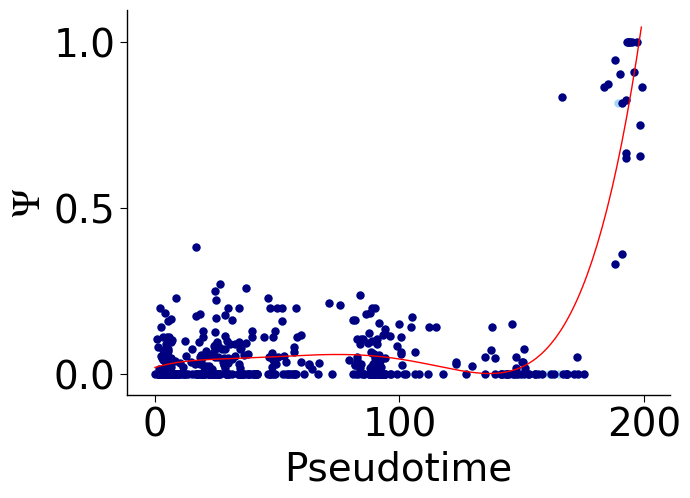

In [78]:
plot_scatter(chen_PSI, chen_filtered_lax[0], chen_pca_clust, 'Rpn2_1', plot_name = '', deg=5)

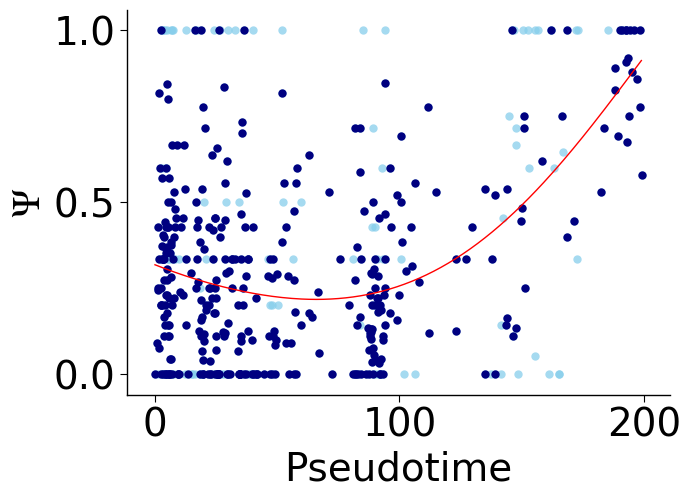

In [79]:
plot_scatter(chen_PSI, chen_filtered_lax[0], chen_pca_clust, 'Mff_3', plot_name = '', deg=5)

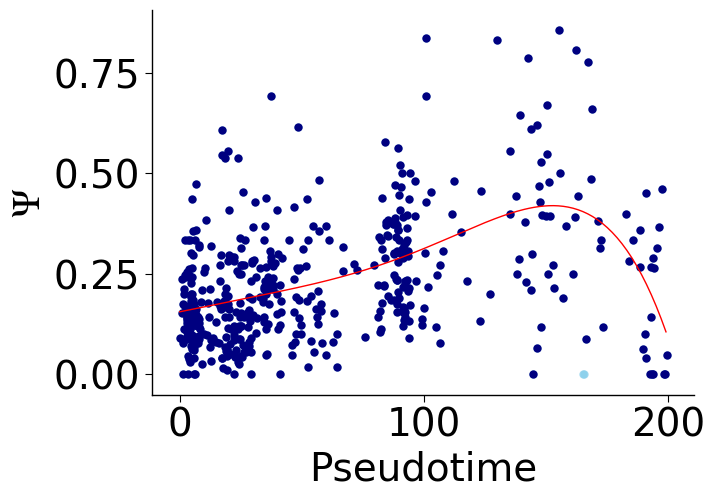

In [80]:
plot_scatter(chen_PSI, chen_filtered_lax[0], chen_pca_clust, 'Rbm39_nmdSE_2', plot_name = '', deg=5)

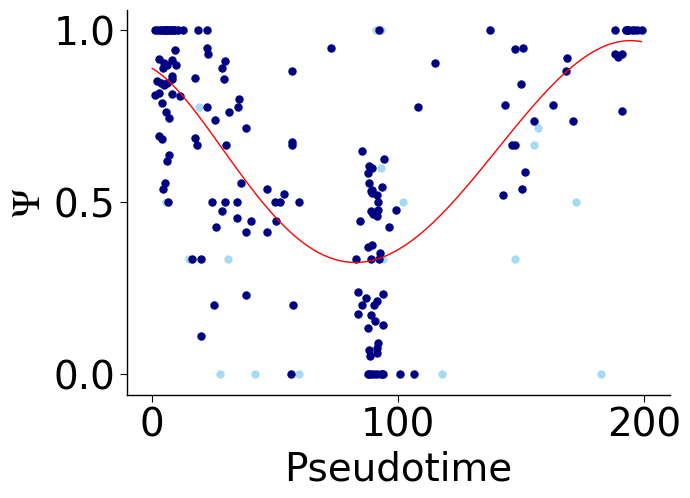

In [81]:
plot_scatter(chen_PSI[chen_pca_clust.index[chen_pca_clust.sex == 'male']], 
             chen_filtered_lax[0][chen_pca_clust.index[chen_pca_clust.sex == 'male']], 
             chen_pca_clust.loc[chen_pca_clust.sex == 'male'], 'Nsfl1c_2', plot_name='Nsfl1c_2_male', deg=5)

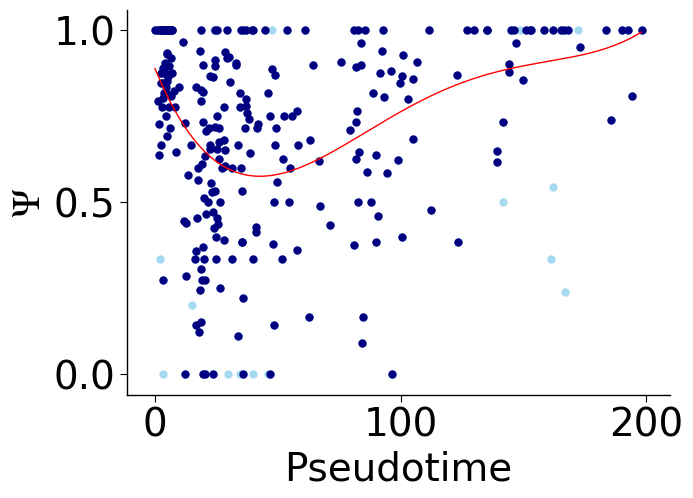

In [82]:
plot_scatter(chen_PSI[chen_pca_clust.index[chen_pca_clust.sex == 'female']], 
             chen_filtered_lax[0][chen_pca_clust.index[chen_pca_clust.sex == 'female']], 
             chen_pca_clust.loc[chen_pca_clust.sex == 'female'], 'Nsfl1c_2', plot_name='Nsfl1c_2_female', deg=4)

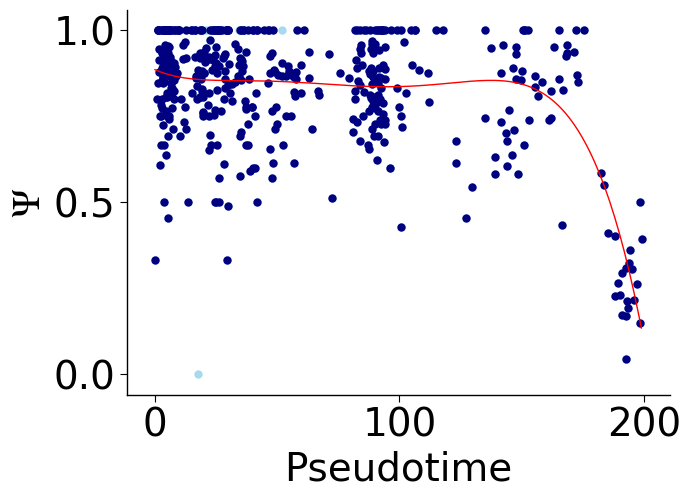

In [83]:
plot_scatter(chen_PSI, chen_filtered_lax[0], chen_pca_clust, 'Tecr_4', plot_name = '', deg=5)

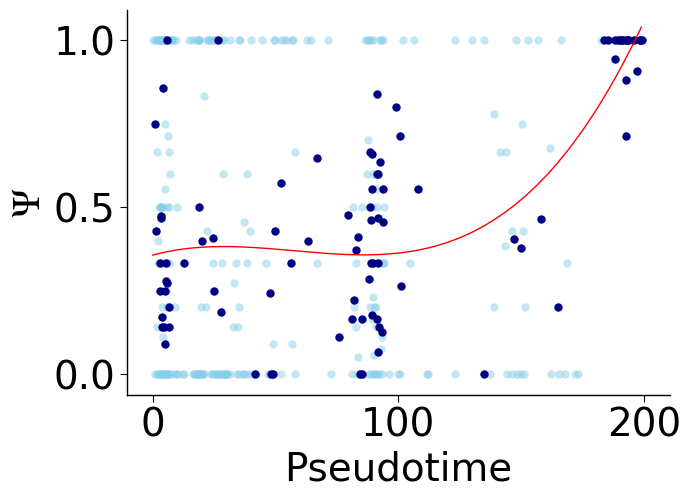

In [84]:
plot_scatter(chen_PSI, chen_filtered_lax[0], chen_pca_clust, 'Cadm1_2', plot_name = '', deg=3, alph=0.5)

In [154]:
### Cadm1, just to get the size right for the paper figure

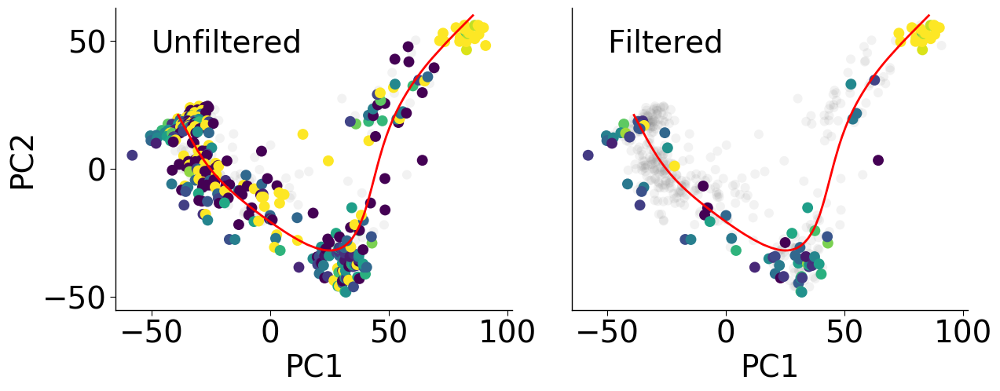

In [85]:
figsize(14, 5)
fig = plt.figure()

gs = GridSpec(1,2)
gs.update(wspace=0.15, hspace=1.05)

ax_1 = fig.add_subplot(gs[0,0])
ax_2 = fig.add_subplot(gs[0,1])

plot_exon(ax_1, chen_PSI, chen_pca_clust, 'Cadm1_2', vmin=0, vmax=1)
plot_exon(ax_2, chen_filtered_lax[0], chen_pca_clust, 'Cadm1_2', vmin=0, vmax=1)

plt.setp(ax_2.get_yticklabels(), visible=False)

ax_2.yaxis.set_ticks_position('none')

ax_1.text(-50, 55, 'Unfiltered', fontsize=28, verticalalignment='top')
ax_2.text(-50, 55, 'Filtered', fontsize=28, verticalalignment='top')
            
ax_1.set_ylabel('PC2', fontsize = 28)

plt.savefig('plots_review/figure3/events/Cadm1_2_all.svg', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/events/Cadm1_2_all.pdf', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/events/Cadm1_2_all.png', dpi=300, bbox_inches='tight', transparent=True)

plt.show()




#### Some calculations for Table 1; probably should move to Fig 1 references

In [86]:
print(np.sum((chen_PSI.mean(axis=1) <= 0.95) & (chen_PSI.mean(axis=1) >= 0.05) & (chen_PSI.isna().mean(axis=1) < 0.9)))
print(chen_read_counts.loc[(chen_PSI.mean(axis=1) <= 0.95) & (chen_PSI.mean(axis=1) >= 0.05) & (chen_PSI.isna().mean(axis=1) < 0.9)].mean(axis=1).mean())

3276
3.1324354720870966


In [87]:
print(np.sum((song_PSI.mean(axis=1) <= 0.95) & (song_PSI.mean(axis=1) >= 0.05) & (song_PSI.isna().mean(axis=1) < 0.9)))
print(song_read_counts.loc[(song_PSI.mean(axis=1) <= 0.95) & (song_PSI.mean(axis=1) >= 0.05) & (song_PSI.isna().mean(axis=1) < 0.9)].mean(axis=1).mean())

5355
88.80614582466659


In [88]:
print(np.sum((lescroart_PSI.mean(axis=1) <= 0.95) & (lescroart_PSI.mean(axis=1) >= 0.05) & (lescroart_PSI.isna().mean(axis=1) < 0.9)))
print(lescroart_read_counts.loc[(lescroart_PSI.mean(axis=1) <= 0.95) & (lescroart_PSI.mean(axis=1) >= 0.05) & (lescroart_PSI.isna().mean(axis=1) < 0.9)].mean(axis=1).mean())

3007
3.190638996337988


In [89]:
print(np.sum((trapnell_PSI.mean(axis=1) <= 0.95) & (trapnell_PSI.mean(axis=1) >= 0.05) & (trapnell_PSI.isna().mean(axis=1) < 0.9)))
print(trapnell_read_counts.loc[(trapnell_PSI.mean(axis=1) <= 0.95) & (trapnell_PSI.mean(axis=1) >= 0.05) & (trapnell_PSI.isna().mean(axis=1) < 0.9)].mean(axis=1).mean())

4457
14.410476443009532


In [90]:
print(np.sum((das_PSI.mean(axis=1) <= 0.95) & (das_PSI.mean(axis=1) >= 0.05) & (das_PSI.isna().mean(axis=1) < 0.9)))
print(das_read_counts.loc[(das_PSI.mean(axis=1) <= 0.95) & (das_PSI.mean(axis=1) >= 0.05) & (das_PSI.isna().mean(axis=1) < 0.9)].mean(axis=1).mean())

684
2.6730835709964578


In [91]:
print(np.sum((shalek_PSI.mean(axis=1) <= 0.95) & (shalek_PSI.mean(axis=1) >= 0.05) & (shalek_PSI.isna().mean(axis=1) < 0.9)))
print(shalek_read_counts.loc[(shalek_PSI.mean(axis=1) <= 0.95) & (shalek_PSI.mean(axis=1) >= 0.05) & (shalek_PSI.isna().mean(axis=1) < 0.9)].mean(axis=1).mean())

380
213.38765182186225


### Identify bimodal events in cluster

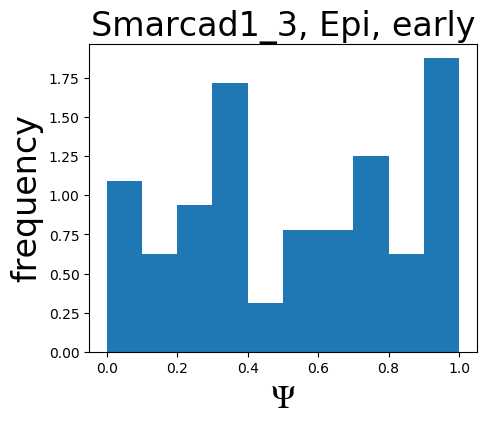

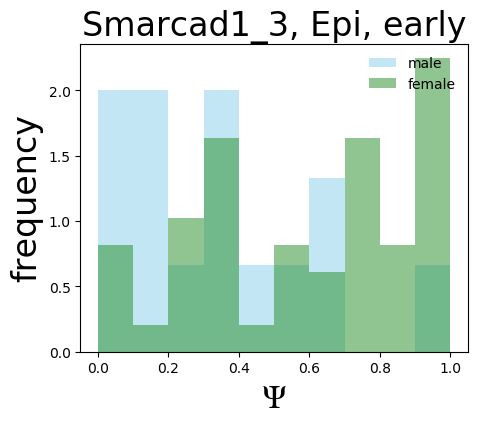

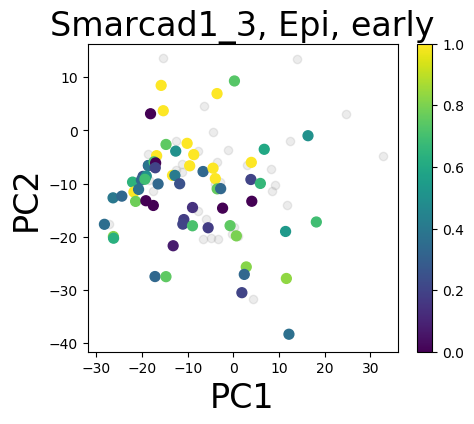

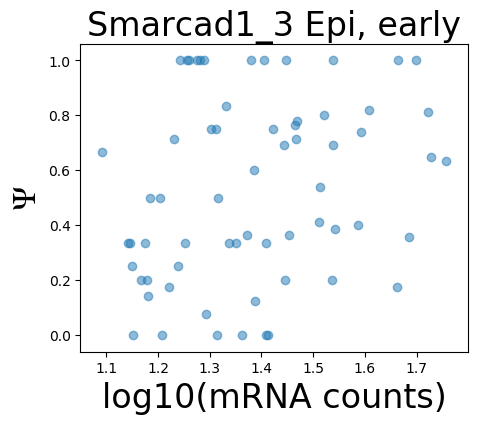

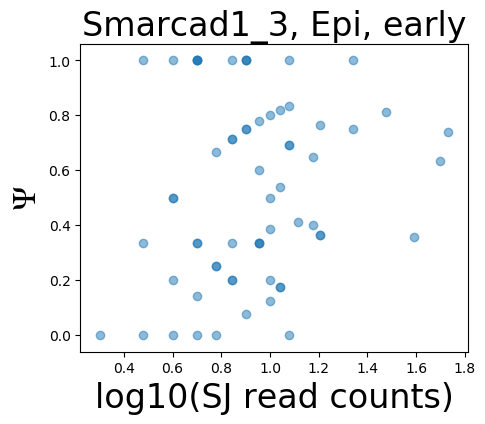

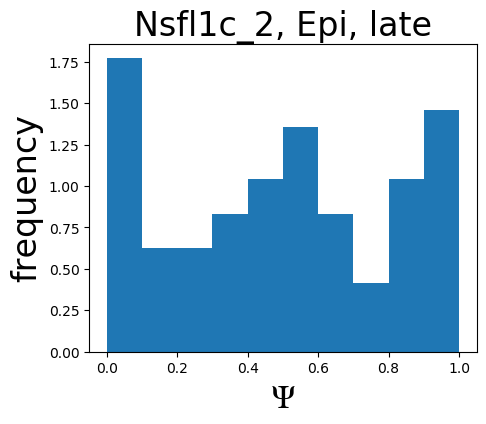

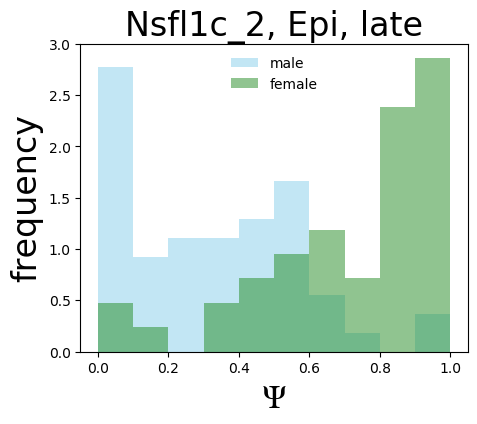

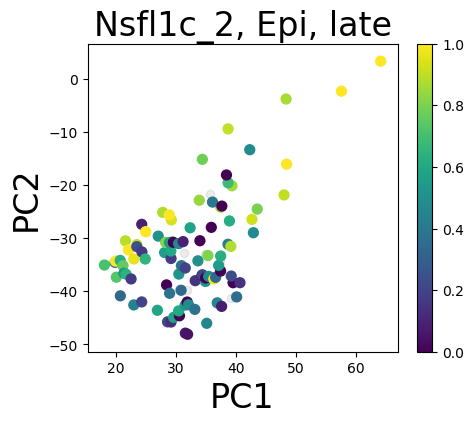

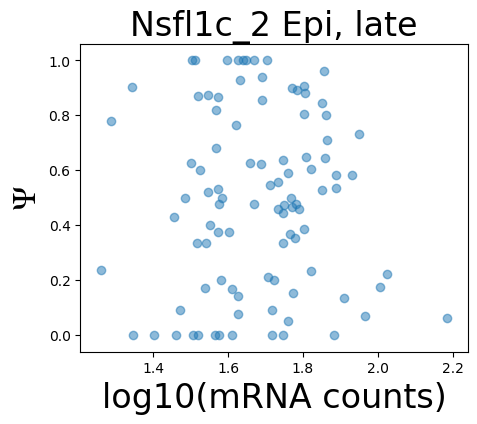

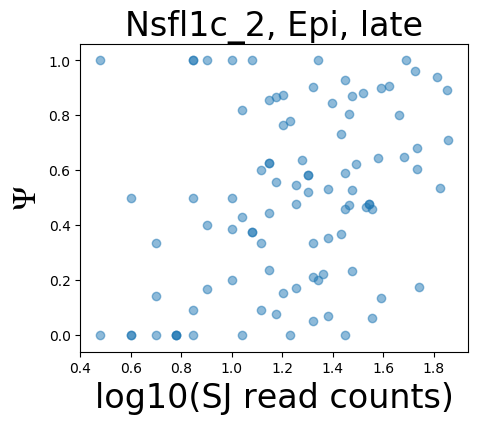

In [156]:
figsize(5, 4)
filtered_bimodal(chen_clust_filter, 
                 ['ES', 'Epi, early', 'Epi, late', 'Neuron, early', 'Neuron, late'], chen_pca, mrna_per_event_chen, 
                     chen_read_counts, quantile = 0.25, psi_lim = 0.25)

#### Supp Figure 3f: differential splicing between sexes

Differential splicing of the two remaining bimodal events in the Chen dataset: Smarcad1_3 in Epi early, and Nsfl1c_2 in Epi late.

In [158]:
male = chen_pca_clust.loc[chen_pca_clust.sex == 'male'].index
female = chen_pca_clust.loc[chen_pca_clust.sex == 'female'].index

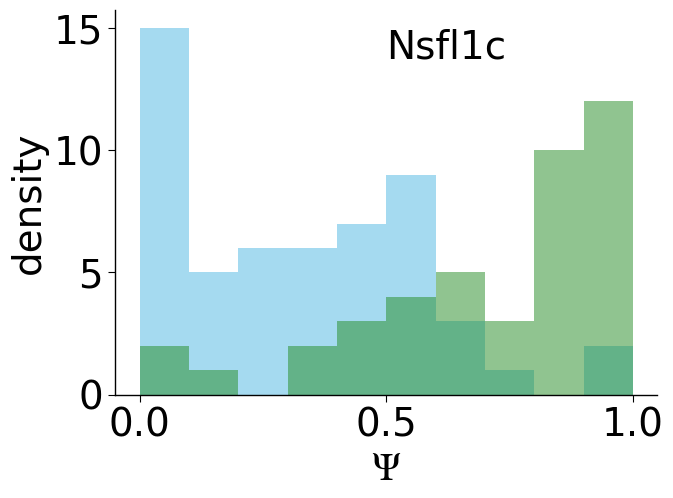

In [98]:
figsize(7, 5)
fig = plt.figure()
ax  = plt.subplot(1,1,1)

ax.hist(chen_clust_filter[2][0].loc['Nsfl1c_2', [x for x in chen_clust_filter[2][0].columns if x in male]].dropna(), 
        color='skyblue', alpha=0.75)
ax.hist(chen_clust_filter[2][0].loc['Nsfl1c_2', [x for x in chen_clust_filter[2][0].columns if x in female]].dropna(), 
        color='forestgreen', alpha=0.5)

ax.tick_params(labelsize=28, length=5)
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)

ax.set_ylabel('density', fontsize = 28)
ax.set_xlabel('$\Psi$', fontsize = 28)

ax.text(0.5, 15, 'Nsfl1c', fontsize=28, verticalalignment='top')

plt.savefig('plots_review/figure3/events/Nsfl1c_sex.svg', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/events/Nsfl1c_sex.pdf', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/events/Nsfl1c_sex.png', dpi=300, bbox_inches='tight', transparent=True)

plt.show()


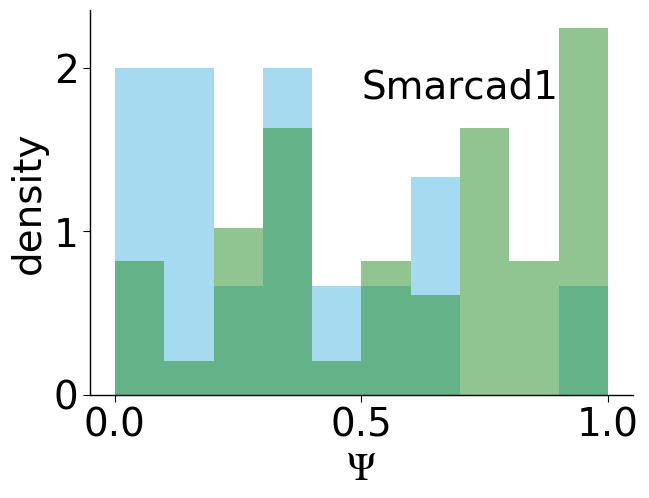

In [99]:
figsize(7, 5)
fig = plt.figure()
ax  = plt.subplot(1,1,1)

ax.hist(chen_clust_filter[1][0].loc['Smarcad1_3', [x for x in chen_clust_filter[1][0].columns if x in male]].dropna(), 
        color='skyblue', alpha=0.75, density=True)
ax.hist(chen_clust_filter[1][0].loc['Smarcad1_3', [x for x in chen_clust_filter[1][0].columns if x in female]].dropna(), 
        color='forestgreen', alpha=0.5, density=True)



ax.tick_params(labelsize=28, length=5)
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)

ax.set_ylabel('density', fontsize = 28)
ax.set_xlabel('$\Psi$', fontsize = 28)

ax.text(0.5, 2, 'Smarcad1', fontsize=28, verticalalignment='top')


plt.savefig('plots_review/figure3/events/Smarcad1_sex.svg', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/events/Smarcad1_sex.pdf', bbox_inches='tight', transparent=True)
plt.savefig('plots_review/figure3/events/Smarcad1_sex.png', dpi=300, bbox_inches='tight', transparent=True)

plt.show()


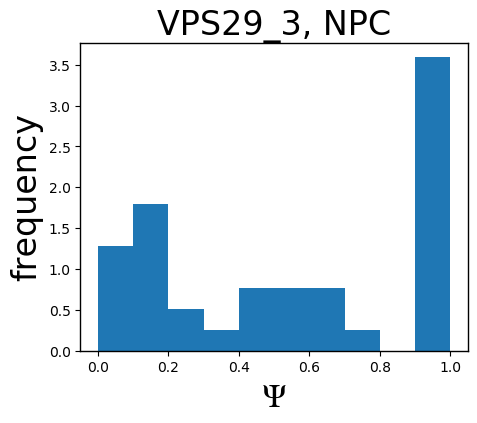

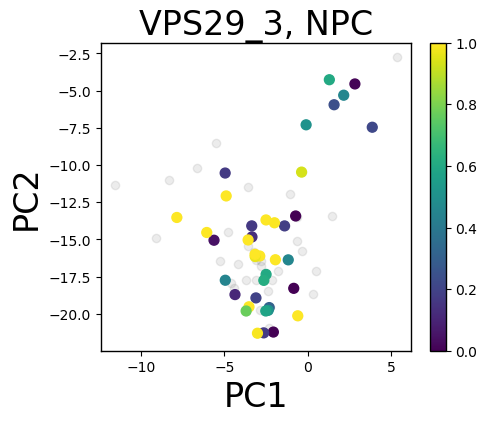

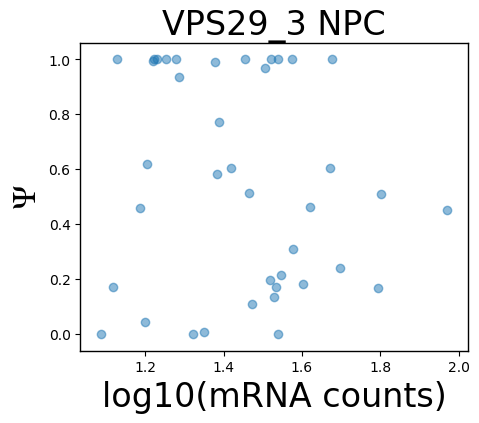

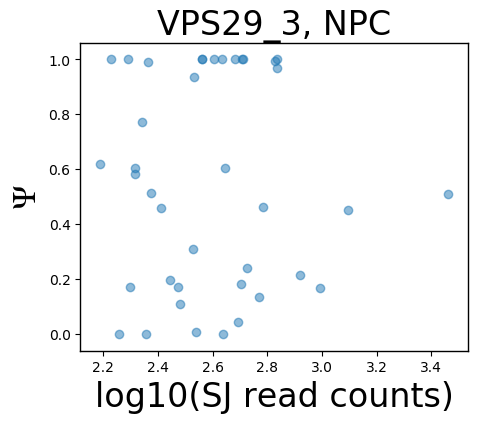

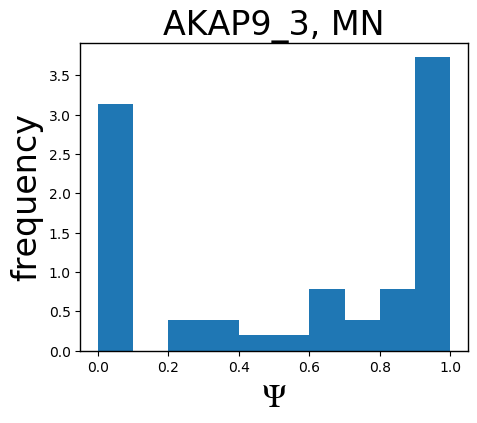

...

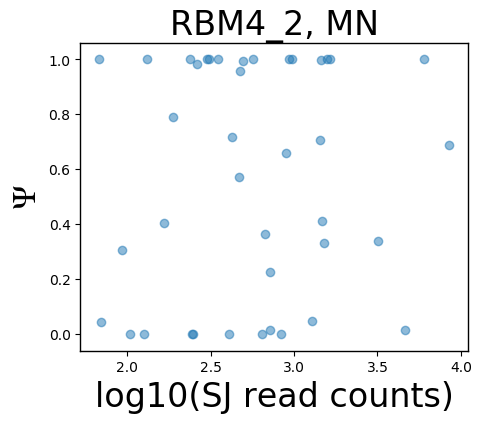

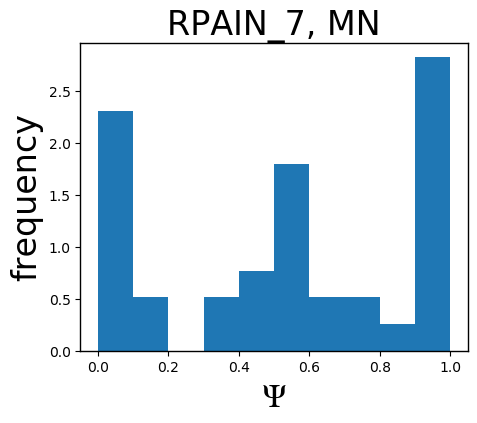

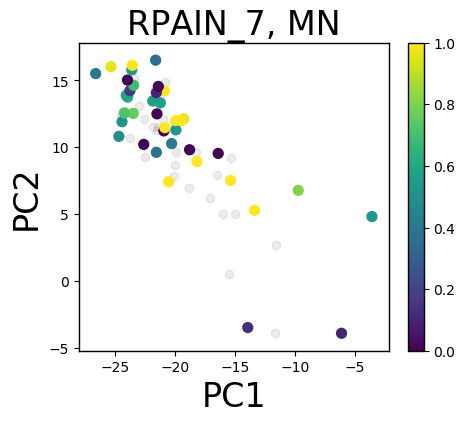

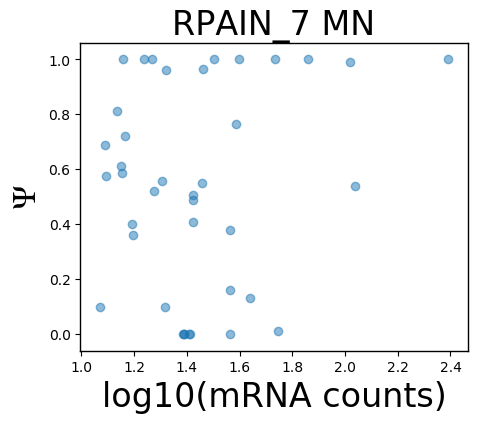

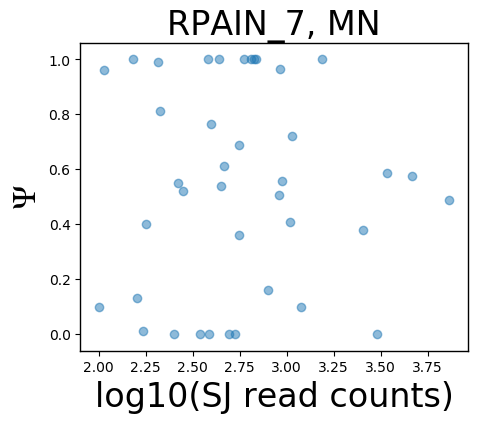

In [69]:
figsize(5, 4)
filtered_bimodal(song_clust_filter, 
                 ['iPSC', 'NPC', 'MN'], song_pca, mrna_per_event_song, 
                     song_read_counts, quantile = 0.25, psi_lim = 0.25)

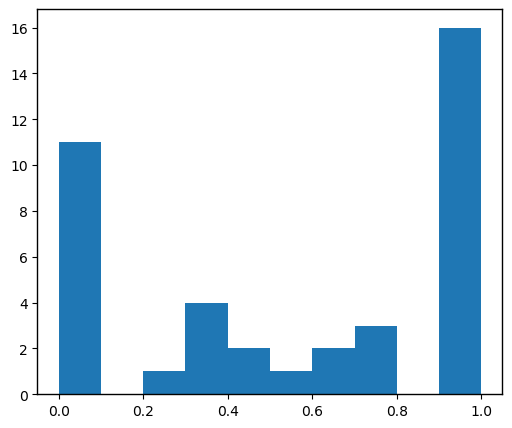

In [49]:
figsize(6, 5)
plt.hist(song_clust_filter[2][0].loc['RBM4_2'])
plt.show()

In [58]:
song_int_genes, song_int_exons = spu.get_int_events(song_PSI, song_mrna_counts, 0.05)
song_int_exons = [x for x in song_int_exons if x in mrna_per_event_song.index]
song_filtered_lax = filter_psi(song_PSI, song_int_exons, mrna_per_event_song, song_coverage_tab['SJ_coverage'], 
                           song_read_counts, mrna_min=10, reads_min=0, cell_min=0.05)

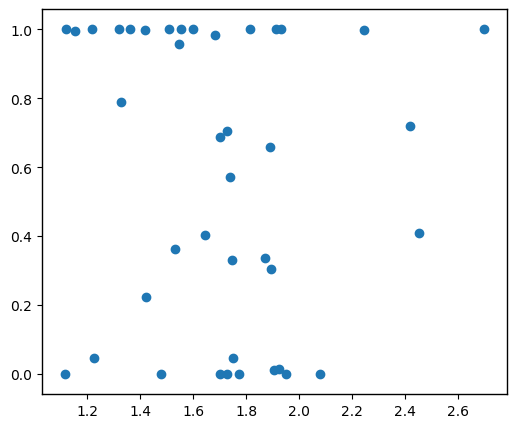

In [54]:
plt.scatter(np.log10(mrna_per_event_song.loc['RBM4_2', song_clust_filter[2][0].columns]+1), 
            song_clust_filter[2][0].loc['RBM4_2'])
plt.show()

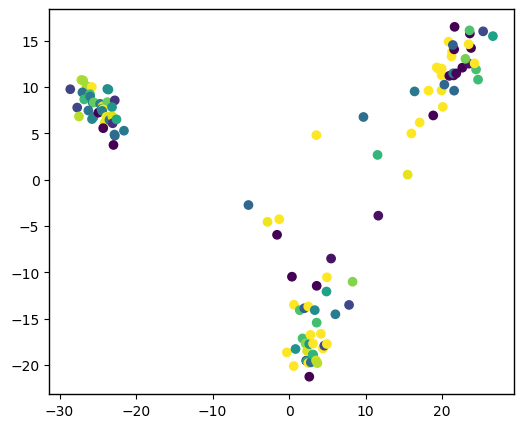

In [68]:
plt.scatter(-song_pca_clust.PC1, song_pca_clust.PC2,
    c=song_filtered_lax[0].loc['RBM4_2'], cmap=cm.viridis)

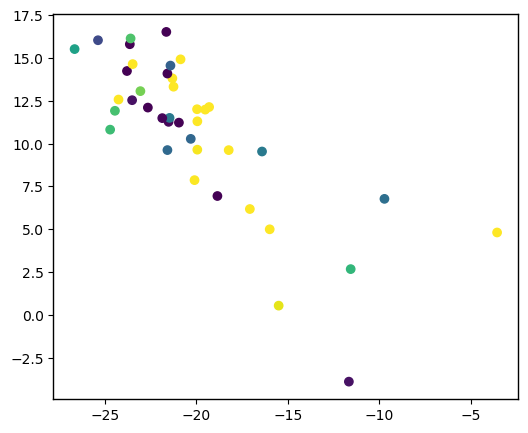

In [63]:
plt.scatter(song_pca_clust.PC1.loc[song_clust_filter[2][0].columns], song_pca_clust.PC2.loc[song_clust_filter[2][0].columns],
    c=song_filtered_lax[0].loc['RBM4_2', song_clust_filter[2][0].columns], cmap=cm.viridis)

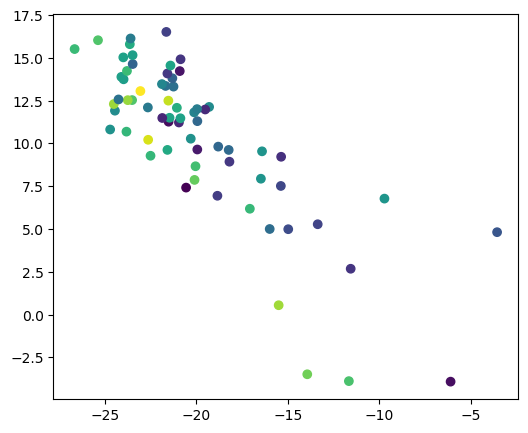

In [111]:
figsize(6,5)
plt.scatter(song_pca_clust.PC1.loc[song_clust_filter[2][0].columns], song_pca_clust.PC2.loc[song_clust_filter[2][0].columns],
    c=np.log10(song_tpm_tab.loc['NOVA1', song_clust_filter[2][0].columns]+1), cmap=cm.viridis, vmin=0)

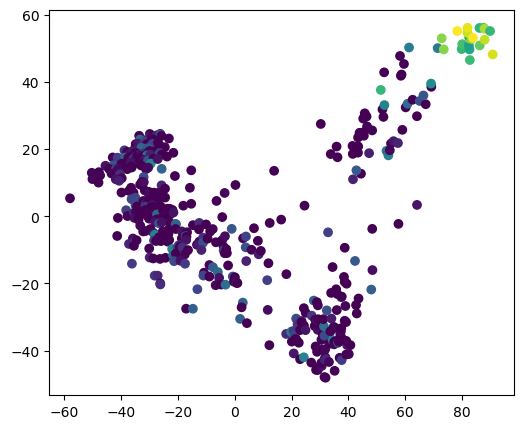

In [116]:
figsize(6,5)
plt.scatter(chen_pca_clust.PC1, chen_pca_clust.PC2,
    c=np.log10(chen_tpm_tab.loc['Nova1', chen_pca_clust.index]+1), cmap=cm.viridis, vmin=0)

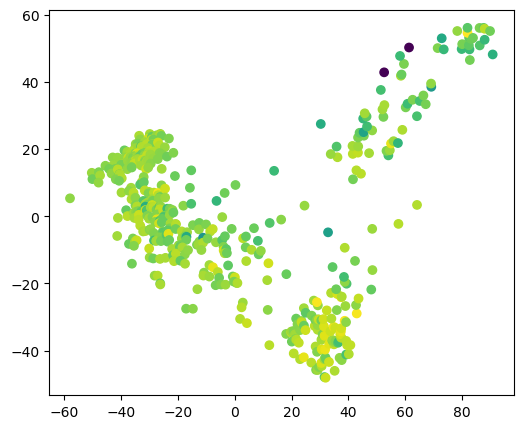

In [133]:
figsize(6,5)
plt.scatter(chen_pca_clust.PC1, chen_pca_clust.PC2,
    c=np.log10(chen_tpm_tab.loc['Srsf10', chen_pca_clust.index]+1), cmap=cm.viridis, vmin=0)

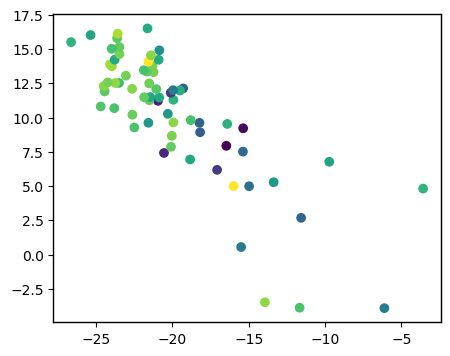

In [84]:
plt.scatter(song_pca_clust.PC1.loc[song_clust_filter[2][0].columns], song_pca_clust.PC2.loc[song_clust_filter[2][0].columns],
    c=np.log10(song_tpm_tab.loc['RBFOX2', song_clust_filter[2][0].columns]+1), cmap=cm.viridis)

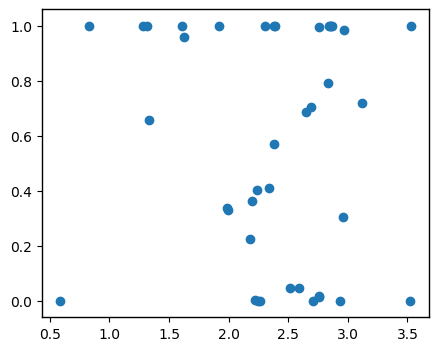

In [85]:
plt.scatter(np.log10(song_tpm_tab.loc['RBFOX2', song_clust_filter[2][0].columns]+1),
           song_filtered_lax[0].loc['RBM4_2', song_clust_filter[2][0].columns])

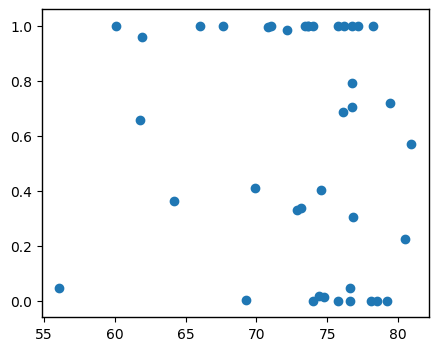

In [88]:
plt.scatter(song_pca_clust.pseudotime.loc[song_clust_filter[2][0].columns], 
            song_filtered_lax[0].loc['RBM4_2', song_clust_filter[2][0].columns])

In [60]:
chen_int_genes, chen_int_exons = spu.get_int_events(chen_PSI, chen_mrna_counts, 0.05)
chen_int_exons = [x for x in chen_int_exons if x in mrna_per_event_chen.index]
chen_filtered_lax = filter_psi(chen_PSI, chen_int_exons, mrna_per_event_chen, chen_coverage_tab['SJ_coverage'], 
                           chen_read_counts, mrna_min=10, reads_min=0, cell_min=0.05)

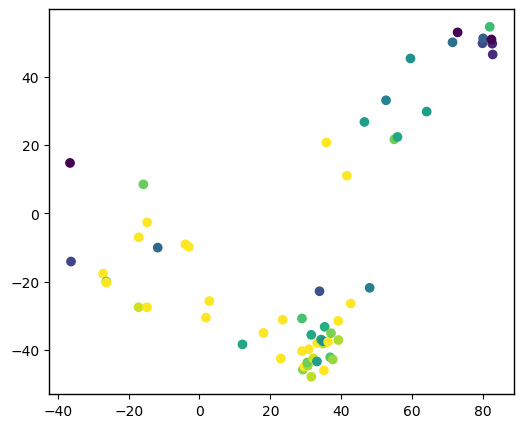

In [67]:
plt.scatter(chen_pca_clust.PC1, chen_pca_clust.PC2,
    c=chen_filtered_lax[0].loc['Rbm4_1'], cmap=cm.viridis)

In [193]:
song_norm_counts =  pd.read_csv(data_dir + 'song/song.norm_counts.tab', sep='\t', index_col = 0)

In [159]:
from sklearn.decomposition import PCA

In [211]:
pc_song = PCA(n_components = 10)
MN_pca = pc_song.fit_transform(np.log1p(song_norm_counts[song_clust_filter[2][0].columns].T))

In [214]:
MN_pca = pd.DataFrame(MN_pca)
MN_pca.index = song_clust_filter[2][0].columns
MN_pca.columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10']

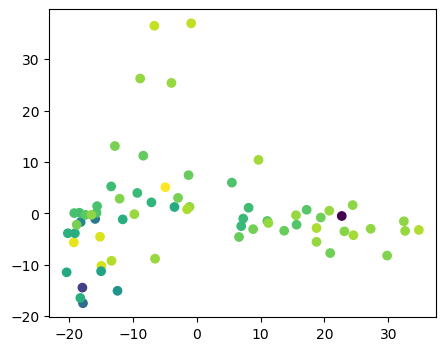

In [215]:
plt.scatter(list(MN_pca.PC1), list(MN_pca.PC2), 
            c=list(np.log1p(song_norm_counts.loc['NOVA1',song_clust_filter[2][0].columns])))

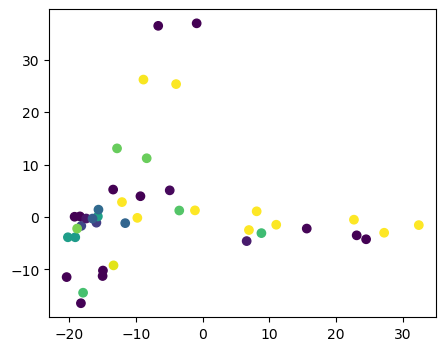

In [216]:
figsize(5, 4)
plt.scatter(list(MN_pca.PC1), list(MN_pca.PC2), 
            c=song_filtered_lax[0].loc['BAZ2B_1', song_clust_filter[2][0].columns])

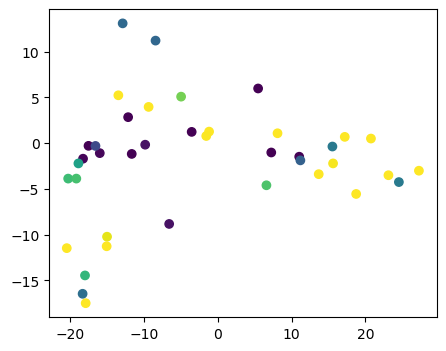

In [219]:
figsize(5, 4)
plt.scatter(list(MN_pca.PC1), list(MN_pca.PC2), 
            c=song_filtered_lax[0].loc['RBM4_2', song_clust_filter[2][0].columns])

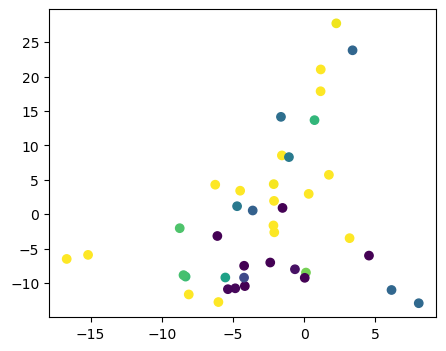

In [208]:
figsize(5, 4)
plt.scatter(list(MN_pca.PC3), list(MN_pca.PC2), 
            c=song_filtered_lax[0].loc['RBM4_2', MN_pca.index])

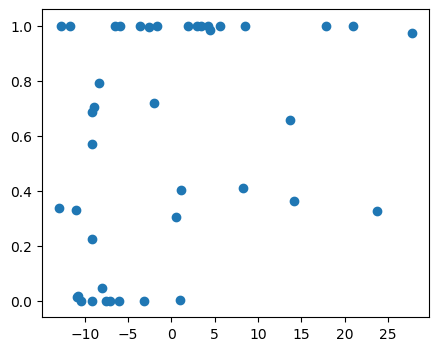

In [202]:
figsize(5, 4)
plt.scatter(list(MN_pca.PC2), 
            song_filtered_lax[0].loc['RBM4_2', MN_pca.index])

In [189]:
type(MN_pca['PC1'].PC1.PC1)

pandas.core.frame.DataFrame

In [176]:
np.log1p(song_tpm_tab.loc['NOVA1', song_pca_clust.index[song_pca_clust.cell_type == "MN"]])

SRR4047297    0.000000
SRR4047296    0.000000
SRR4047335    0.662688
SRR4047282    0.104360
SRR4047281    0.000000
SRR4047348    0.343590
SRR4047291    0.246860
SRR4047333    1.757858
SRR4047342    1.022451
SRR4047292    3.414443
SRR4047329    1.332366
SRR4047313    1.497388
SRR4047326    2.320425
SRR4047293    4.398884
SRR4047307    1.386294
SRR4047328    3.401531
SRR4047324    0.908259
SRR4047305    1.163151
SRR4047306    3.391147
SRR4047304    1.061257
SRR4047327    0.000000
SRR4047334    5.015623
SRR4047312    2.243896
SRR4047337    4.572647
SRR4047320    2.179287
SRR4047317    0.444686
SRR4047289    3.296207
SRR4047347    3.955082
SRR4047303    2.193886
SRR4047294    4.368308
                ...   
SRR4047350    0.717840
SRR4047284    5.988911
SRR4047345    4.349762
SRR4047339    2.659560
SRR4047351    2.386007
SRR4047352    3.309813
SRR4047336    2.406044
SRR4047340    2.075684
SRR4047309    0.357674
SRR4047301    3.021887
SRR4047318    1.095273
SRR4047343    4.758063
SRR4047341 